# 0. 데이터불러오기

In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MeanShift
from sklearn.metrics import silhouette_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from itertools import combinations
font_path = 'C:\Windows\Fonts\MALGUNBD.TTF'
font_prop = fm.FontProperties(fname=font_path)
plt.rc('font', family=font_prop.get_name())

In [2]:
df = pd.read_csv('final_merged.csv')

In [3]:
# 불필요한 컬럼 제거
df = df.drop(["시군구명","시도명"], axis= 1)

In [4]:
df

,맞벌이비율,평균 과세대상근로소득(백만원),apart,초등학생 수 대비 학원 비율,초등학생 수 대비 도서관 비율,초등학생 수 대비 pc방 비율,초등학생 수 대비 소아과 비율,초등학생 수 대비 학교 숲 비율
0,0.5818,33.9802,0.589536,0.0650,0.0011,0.0065,0.0014,11.0156
1,0.4667,31.6427,0.198992,0.0196,0.0035,0.0069,0.0000,24.8581
2,0.4141,36.5519,0.660448,0.0394,0.0014,0.0041,0.0010,7.9148
3,0.5686,35.8620,0.466221,0.0330,0.0011,0.0052,0.0011,32.4194
4,0.4416,31.9435,0.701770,0.0377,0.0007,0.0061,0.0017,25.1465
...,...,...,...,...,...,...,...,...
224,0.4630,33.5292,0.563537,0.0405,0.0010,0.0043,0.0013,1.5655
225,0.5556,33.4837,0.669411,0.0310,0.0009,0.0040,0.0004,2.2162
226,0.5000,33.9319,0.574872,0.0271,0.0008,0.0039,0.0010,154.6193
227,0.5070,38.2154,0.742007,0.0421,0.0003,0.0035,0.0010,1.2137


# 1. EDA 및 전처리

### 1.1 heatmap 출력

In [6]:
# 기초 통계량, heatmap 살펴보기
from IPython.display import display, HTML
import seaborn as sns
import random
import matplotlib.pyplot as plt
import plotly.express as px
import matplotlib.font_manager as fm
import pandas as pd
import numpy as np
font_path = 'C:\Windows\Fonts\MALGUNBD.TTF'
font_prop = fm.FontProperties(fname=font_path)
plt.rc('font', family=font_prop.get_name())
plt.rcParams['axes.unicode_minus'] = False  # 마이너스 기호 깨짐 방지
def eda(df):
    print("==================================================================")
    print("1. Dataframe Shape: ", df.shape)
    print("==================================================================")
    print("2. Explore the Data: ")
    display(HTML(df.head(5).to_html()))
    print("==================================================================")
    print("3. Information on the Data: ")
    data_info_df = pd.DataFrame(df.dtypes, columns=['data type'])
    data_info_df['Duplicated_Values'] = df.duplicated().sum()
    data_info_df['Missing_Values'] = df.isnull().sum().values
    data_info_df['%Missing'] = df.isnull().sum().values / len(df) * 100
    data_info_df['Unique_Values'] = df.nunique().values
    df_desc = df.describe(include='all').transpose()
    data_info_df['Count'] = df_desc['count'].values
    data_info_df['Mean'] = df_desc['mean'].values
    data_info_df['STD'] = df_desc['std'].values
    data_info_df['Min'] = df_desc['min'].values
    data_info_df['Max'] = df_desc['max'].values
    data_info_df = data_info_df[['Count', 'Mean', 'STD', 'Min', 'Max', 'Duplicated_Values', 'Missing_Values',
                                 '%Missing', 'Unique_Values']]
    display(HTML(data_info_df.to_html()))
    print("==================================================================")
    print("4. Correlation Matrix Heatmap - For Numeric Variables:")
    num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    correlation_matrix = df[num_cols].corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f', annot_kws={"size": 10, "color": "black"})
    plt.show()
    print("==================================================================")

1. Dataframe Shape:  (229, 8)
2. Explore the Data: 


,맞벌이비율,평균 과세대상근로소득(백만원),apart,초등학생 수 대비 학원 비율,초등학생 수 대비 도서관 비율,초등학생 수 대비 pc방 비율,초등학생 수 대비 소아과 비율,초등학생 수 대비 학교 숲 비율
0,0.5818,33.9802,0.589536,0.0650,0.0011,0.0065,0.0014,11.0156
1,0.4667,31.6427,0.198992,0.0196,0.0035,0.0069,0.0000,24.8581
2,0.4141,36.5519,0.660448,0.0394,0.0014,0.0041,0.0010,7.9148
3,0.5686,35.8620,0.466221,0.0330,0.0011,0.0052,0.0011,32.4194
4,0.4416,31.9435,0.701770,0.0377,0.0007,0.0061,0.0017,25.1465


3. Information on the Data: 


,Count,Mean,STD,Min,Max,Duplicated_Values,Missing_Values,%Missing,Unique_Values
맞벌이비율,229.0,0.491411,0.069938,0.300000,0.812500,0,0,0.0,189
평균 과세대상근로소득(백만원),229.0,35.642959,6.550727,25.382600,74.507500,0,0,0.0,228
apart,229.0,0.484176,0.249193,0.001197,0.911928,0,0,0.0,229
초등학생 수 대비 학원 비율,229.0,0.040955,0.017360,0.000000,0.132600,0,0,0.0,180
초등학생 수 대비 도서관 비율,229.0,0.002268,0.002797,0.000000,0.023100,0,0,0.0,69
초등학생 수 대비 pc방 비율,229.0,0.003696,0.002241,0.000000,0.018800,0,0,0.0,64
초등학생 수 대비 소아과 비율,229.0,0.001084,0.000550,0.000000,0.003700,0,0,0.0,24
초등학생 수 대비 학교 숲 비율,229.0,6.042413,13.164320,0.000000,154.619300,0,0,0.0,219


4. Correlation Matrix Heatmap - For Numeric Variables:


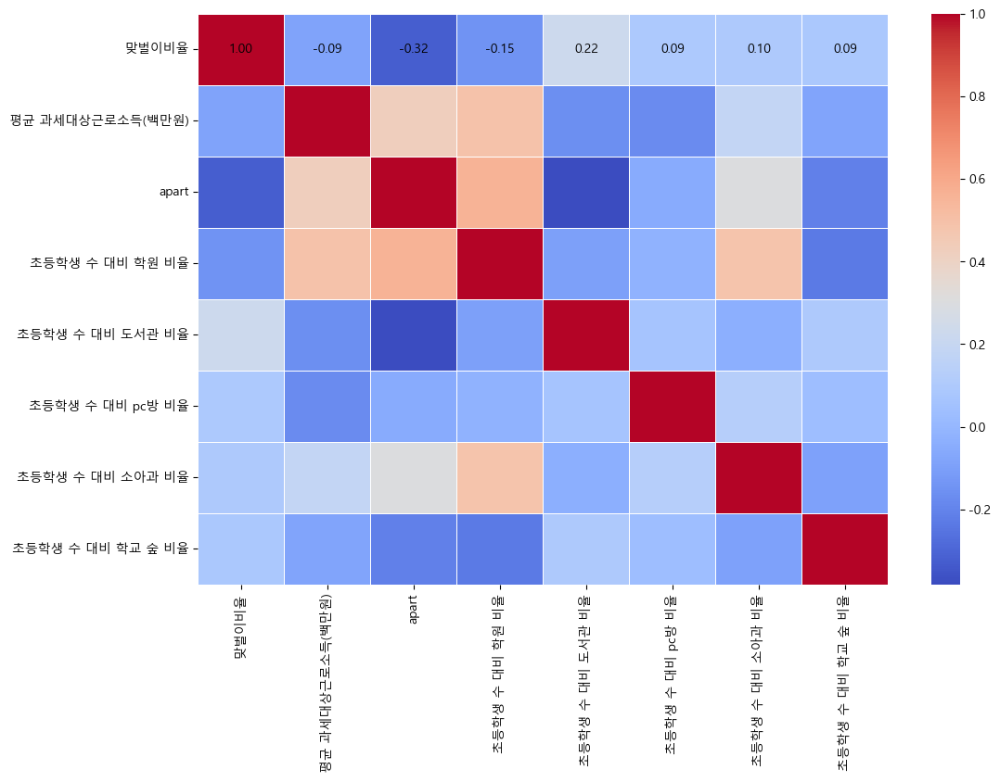

In [7]:
eda(df)

### 1.2 feature distribution

C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

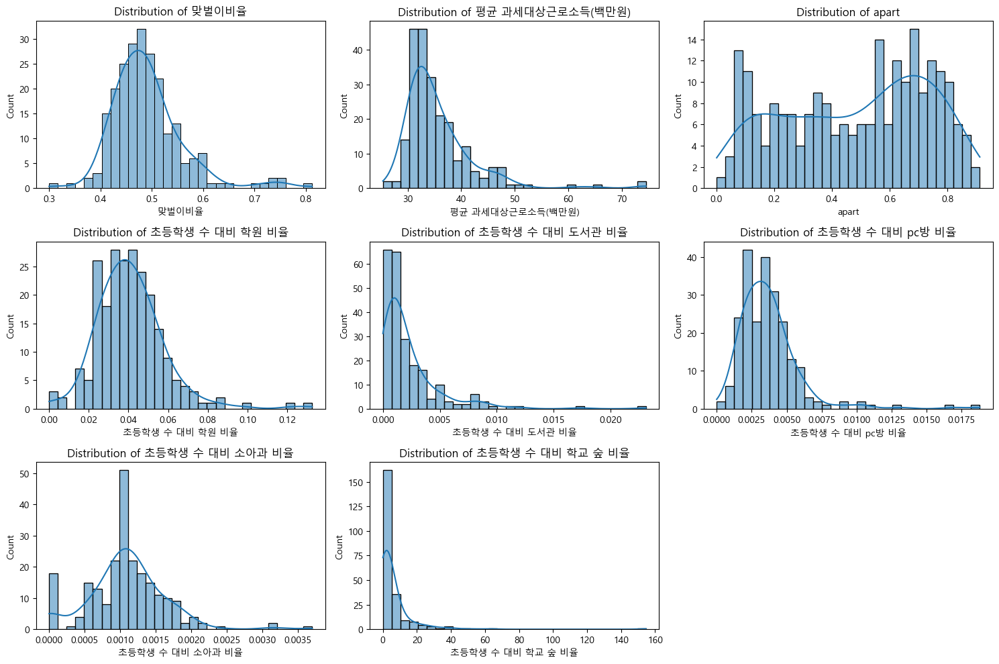

In [7]:
# columns 분포확인
columns_to_visualize = df.columns

plt.figure(figsize=(15,10))
for i, col in enumerate(columns_to_visualize, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], bins=30, kde=True)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()

plt.show()

#### 로그 취하기 - 분포가 skewed 해서

In [8]:
# 로그 변환
df_log_transformed = df.apply(lambda x: np.log1p(x))

In [9]:
df_log_transformed

,맞벌이비율,평균 과세대상근로소득(백만원),apart,초등학생 수 대비 학원 비율,초등학생 수 대비 도서관 비율,초등학생 수 대비 pc방 비율,초등학생 수 대비 소아과 비율,초등학생 수 대비 학교 숲 비율
0,0.458563,3.554782,0.463442,0.062975,0.001099,0.006479,0.001399,2.486206
1,0.383015,3.485621,0.181482,0.019410,0.003494,0.006876,0.000000,3.252624
2,0.346493,3.625724,0.507088,0.038644,0.001399,0.004092,0.001000,2.187713
3,0.450184,3.607181,0.382688,0.032467,0.001099,0.005187,0.001099,3.509137
4,0.365754,3.494794,0.531669,0.037007,0.000700,0.006081,0.001699,3.263715
...,...,...,...,...,...,...,...,...
224,0.380489,3.541805,0.446951,0.039701,0.001000,0.004291,0.001299,0.942153
225,0.441861,3.540487,0.512471,0.030529,0.000900,0.003992,0.000400,1.168201
226,0.405465,3.553400,0.454174,0.026739,0.000800,0.003892,0.001000,5.047413
227,0.410121,3.669070,0.555038,0.041238,0.000300,0.003494,0.001000,0.794665


C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

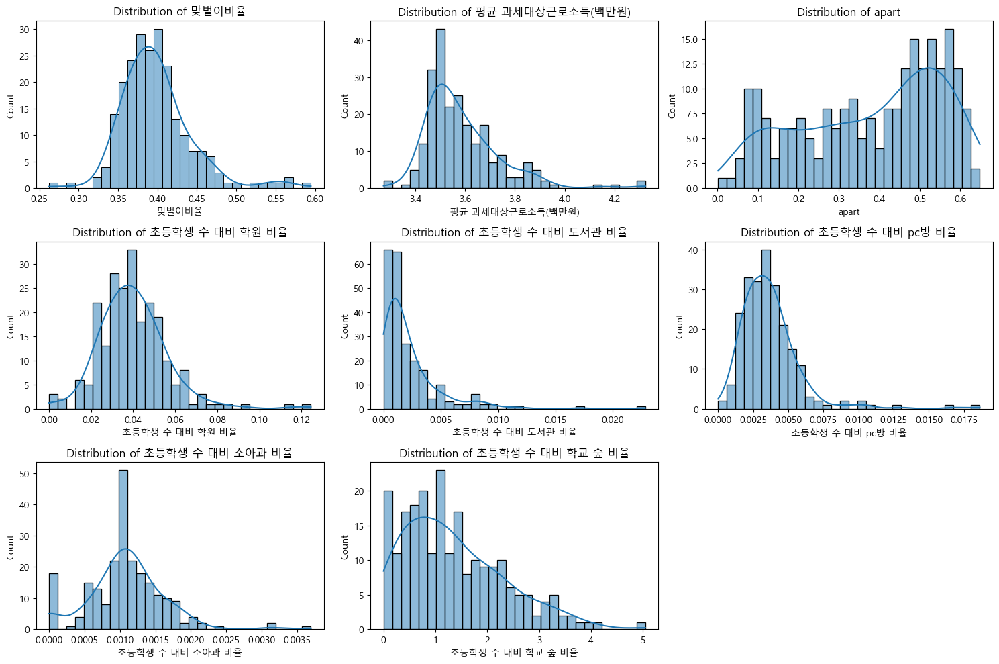

In [10]:
# 로그 변환된 데이터프레임의 각 컬럼에 대한 분포를 히스토그램과 KDE로 확인
columns_to_visualize = df_log_transformed.columns

plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_visualize, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df_log_transformed[col], bins=30, kde=True)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()

plt.show()

* 로그 변환한 값들과 비교했을 때 미미한 차이를 보이고 또한 clustering까지 진행했을 때 큰 차이가 없다고 판단되어서 기존 원래 데이터를 사용하고자 합니다.

### 1.3 scatter plot

C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\gkswl\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

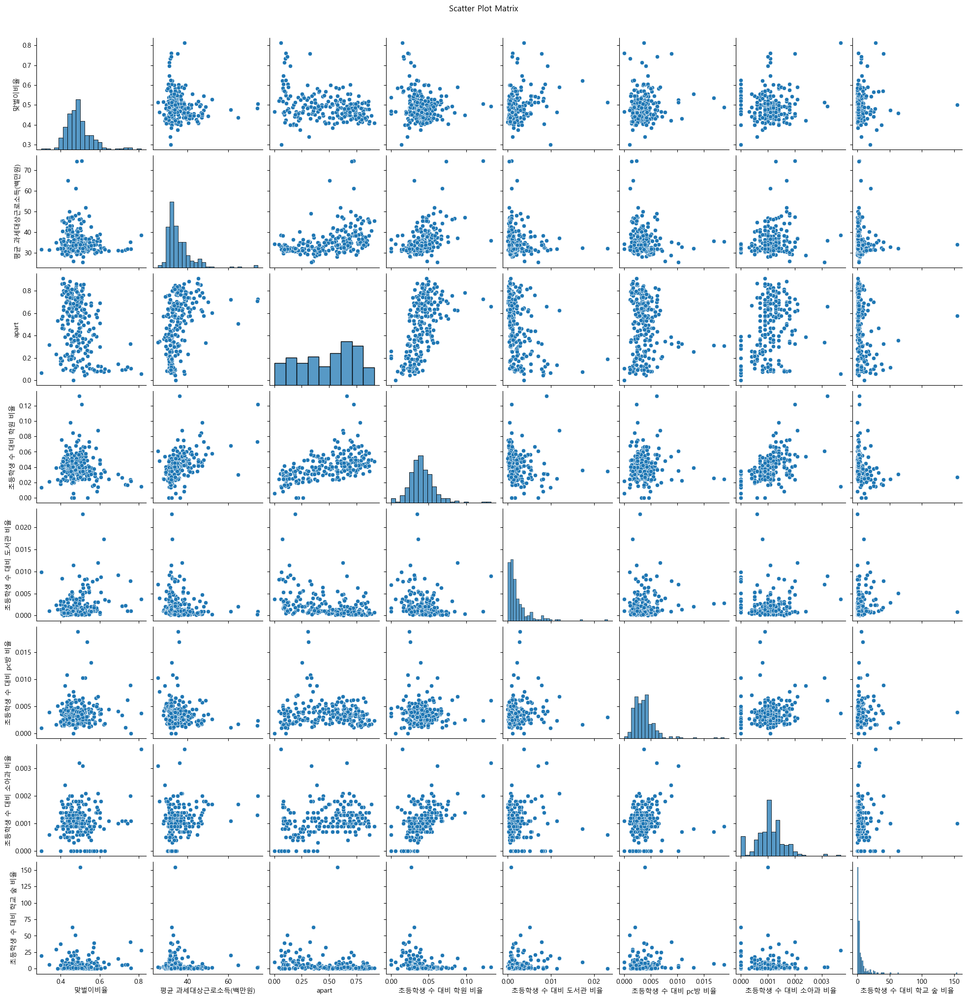

In [11]:
# 산점도 행렬 그리기
sns.pairplot(df)
plt.suptitle('Scatter Plot Matrix', y=1.02)
plt.show()

### 1.4 box plot - 이상치 확인

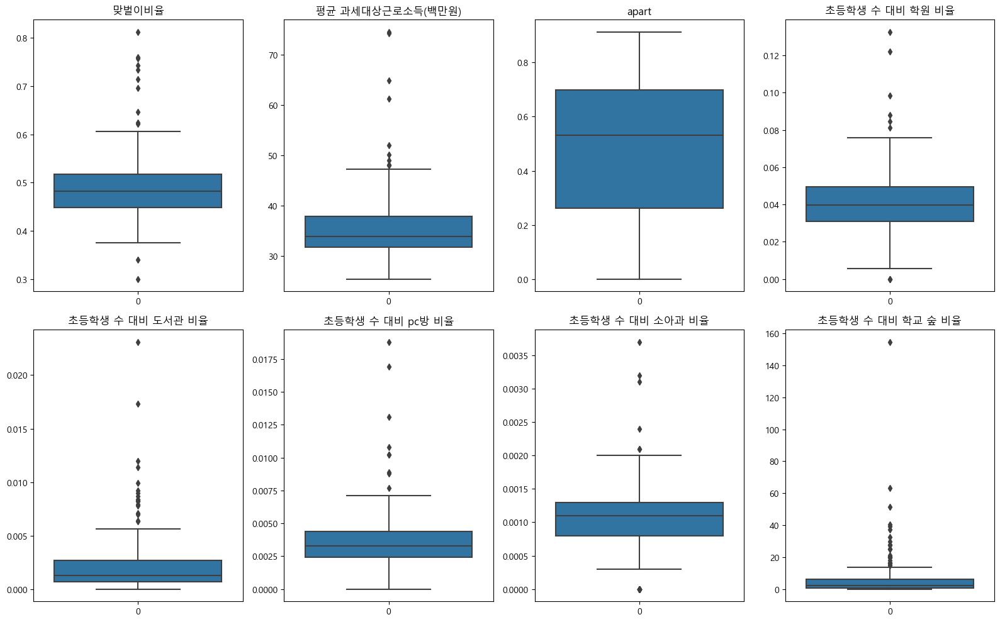

In [12]:
# 박스플롯 그리기
plt.figure(figsize=(16, 10))

for i, column in enumerate(df_log_transformed.columns, 1):
    plt.subplot(2, 4, i)  # 2행 4열의 서브플롯에 그래프를 배치
    sns.boxplot(data=df[column])
    plt.title(column)

plt.tight_layout()
plt.show()

* 학교 숲 비율을 제외한 나머지 column들의 outlier 값들이 있는 IQR 범위에 있는 값들에 비해서 큰 차이를 보이지 않고, 또한 각  지역 DNA를 잘 반영한 것으로 판단할 수 있다.
* 그러나 학교 숲 비율의 경우 일정 임계값 이상이 되면 비교적 미미한 영향을 준다고 판단된다. 하나의 지역(진천군)이 정말 큰 값(80만 제곱미터)을 가지는 것을 확인할 수 있다. 이는 짐작했을 때 진천군 학교 근처 숲, 논이 많은 것으로 판단되기에 outlier를 제거하지 않고 지역적 특색을 반영하기 위해 그대로 clustering 진행하고자 한다.
* 데이터 분포, 값의 범위를 봤을 때 clustering을 하기 위해서는 scaling을 필연적이다.

### 1.5 scaling 진행

In [13]:
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler

standard_scaler = StandardScaler()
standard_scaled = standard_scaler.fit_transform(df)

robust_scaler = RobustScaler()
robust_scaled = robust_scaler.fit_transform(df)

# MinMaxScaler를 사용한 스케일링
minmax_scaler = MinMaxScaler()
minmax_scaled = minmax_scaler.fit_transform(df)

* 각각의 scaler들로 실루엣 스코어를 척도하여 최적의 clustering scaler를 찾고자 한다.
    * **최종적으로 standard scaler 사용**
<br>

* standard scaler : 평균 0 표준편차 1 
* robust scaler : 중앙값을 0으로 IQR를 1로 설정
* Min-Max scaler : 데이터의 범위 0과 1 사이로 맞춤

### 전처리 - csv 파일 상
* 전처리 과정(feature engineering 포함)은 직접적으로 csv 파일에서 수정함에 따라 주피터 노트북 상에서는 이뤄지지 않고, 직접 csv 파일 상에서 진행하였습니다. 
* 전처리에 대한 자세한 내용은 발표자료에서 확인하실 수 있습니다.

# <Dunn Index에 필요한 함수>

In [14]:
from scipy.spatial.distance import pdist, squareform

def complete_diameter_distance(X):
    # 모든 점들 사이의 거리를 계산합니다.
    pairwise_distances = pdist(X)
    # 최대 거리를 반환합니다.
    return np.max(pairwise_distances)

def average_diameter_distance(X):
    # 모든 점들 사이의 거리를 계산합니다.
    pairwise_distances = pdist(X)
    # 거리의 평균을 반환합니다.
    return np.mean(pairwise_distances)

def centroid_diameter_distance(X):
    # 중심점을 계산합니다.
    centroid = np.mean(X, axis=0)
    # 중심점에서 모든 점까지의 거리를 계산합니다.
    pairwise_distances = np.linalg.norm(X - centroid, axis=1)
    # 최대 거리를 반환합니다.
    return np.max(pairwise_distances)

def single_linkage_distance(X1, X2):
    # 서로 다른 두 클러스터 간의 모든 점들 사이의 거리를 계산합니다.
    pairwise_distances = pdist(np.vstack([X1, X2]))
    # 최소 거리를 반환합니다.
    return np.min(pairwise_distances)

def complete_linkage_distance(X1, X2):
    # 서로 다른 두 클러스터 간의 모든 점들 사이의 거리를 계산합니다.
    pairwise_distances = pdist(np.vstack([X1, X2]))
    # 최대 거리를 반환합니다.
    return np.max(pairwise_distances)

def average_linkage_distance(X1, X2):
    # 서로 다른 두 클러스터 간의 모든 점들 사이의 거리를 계산합니다.
    pairwise_distances = pdist(np.vstack([X1, X2]))
    # 거리의 평균을 반환합니다.
    return np.mean(pairwise_distances)

def centroid_linkage_distance(X1, X2):
    # 각 클러스터의 중심점을 계산합니다.
    centroid1 = np.mean(X1, axis=0)
    centroid2 = np.mean(X2, axis=0)
    # 중심점 사이의 거리를 계산합니다.
    distance = np.linalg.norm(centroid1 - centroid2)
    return distance

def average_of_centroids_linkage_distance(X1, X2):
    # 각 클러스터의 중심점을 계산합니다.
    centroid1 = np.mean(X1, axis=0)
    centroid2 = np.mean(X2, axis=0)
    # 중심점 사이의 거리의 평균을 계산합니다.
    distance = np.linalg.norm(centroid1 - centroid2)
    return distance

In [15]:
def get_Dunn_index(X, labels, intra_cluster_distance_type, inter_cluster_distance_type):
    intra_cdt_dict = {
        'cmpl_dd': complete_diameter_distance,
        'avdd': average_diameter_distance,
        'cent_dd': centroid_diameter_distance
    }
    inter_cdt_dict = {
        'sld': single_linkage_distance,
        'cmpl_ld': complete_linkage_distance,
        'avld': average_linkage_distance,
        'cent_ld': centroid_linkage_distance,
        'av_cent_ld': average_of_centroids_linkage_distance
    }

    # Intra cluster distance
    intra_cluster_distance = intra_cdt_dict[intra_cluster_distance_type]

    # Inter cluster distance
    inter_cluster_distance = inter_cdt_dict[inter_cluster_distance_type]

    # Get minimum value of inter_cluster_distance
    res1 = []
    for i, j in combinations(np.unique(labels), 2):
        X1 = X[np.where(labels == i)[0], :]
        X2 = X[np.where(labels == j)[0], :]
        res1.append(inter_cluster_distance(X1, X2))
    min_inter_cd = np.min(res1)

    # Get maximum value of intra_cluster_distance
    res2 = []
    for label in np.unique(labels):
        X_target = X[np.where(labels == label)[0], :]
        if X_target.shape[0] >= 2:
            res2.append(intra_cluster_distance(X_target))
        else:
            res2.append(0)
    max_intra_cd = np.max(res2)

    Dunn_idx = min_inter_cd / max_intra_cd
    return Dunn_idx


# 2. Clustering 알고리즘 - 각 feature pair

## 2.1 K-Means

In [16]:
standard_scaler = StandardScaler()
df_scaled = standard_scaler.fit_transform(df)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

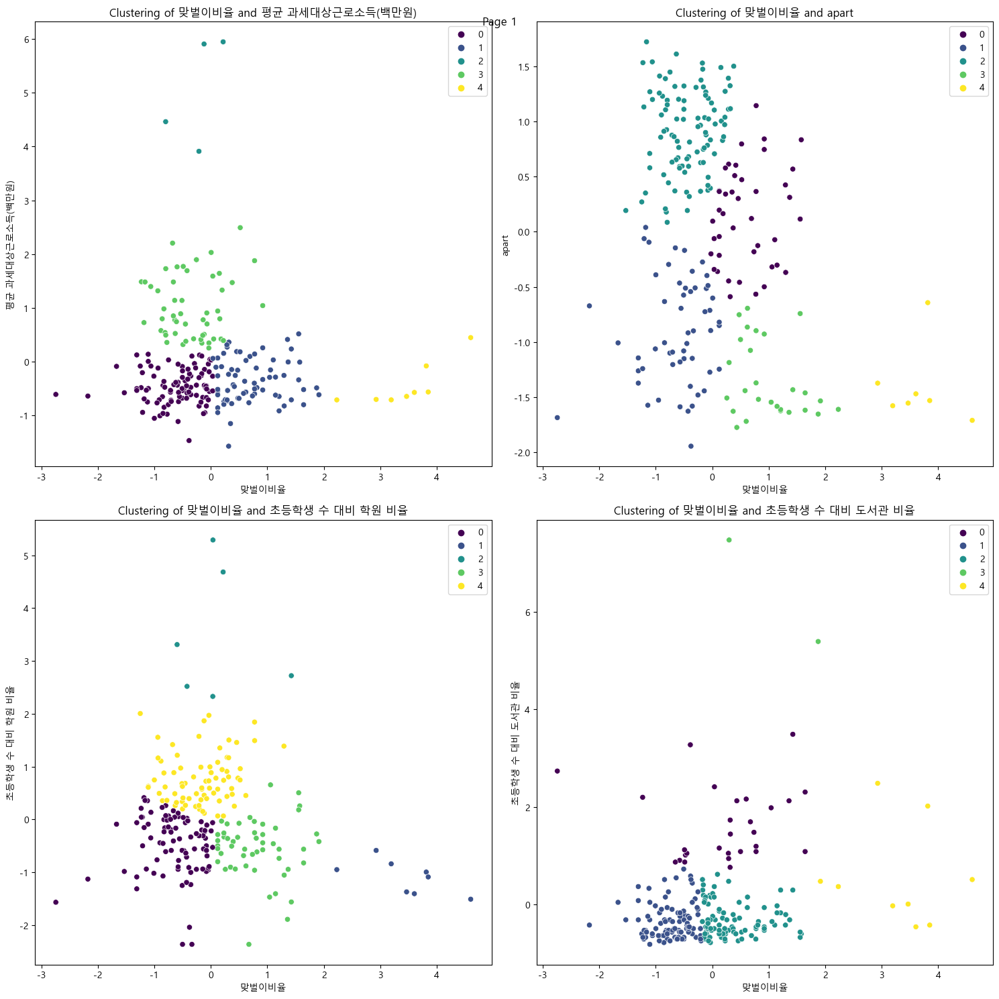

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

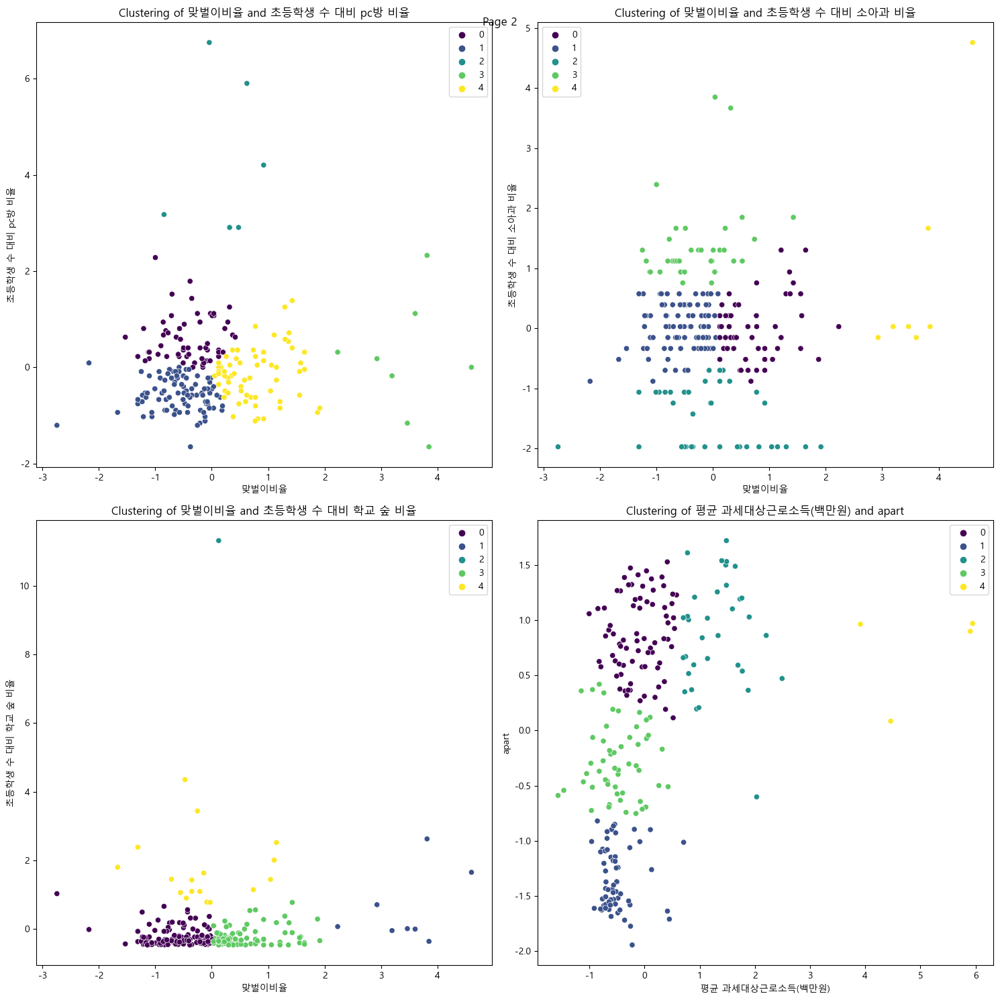

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

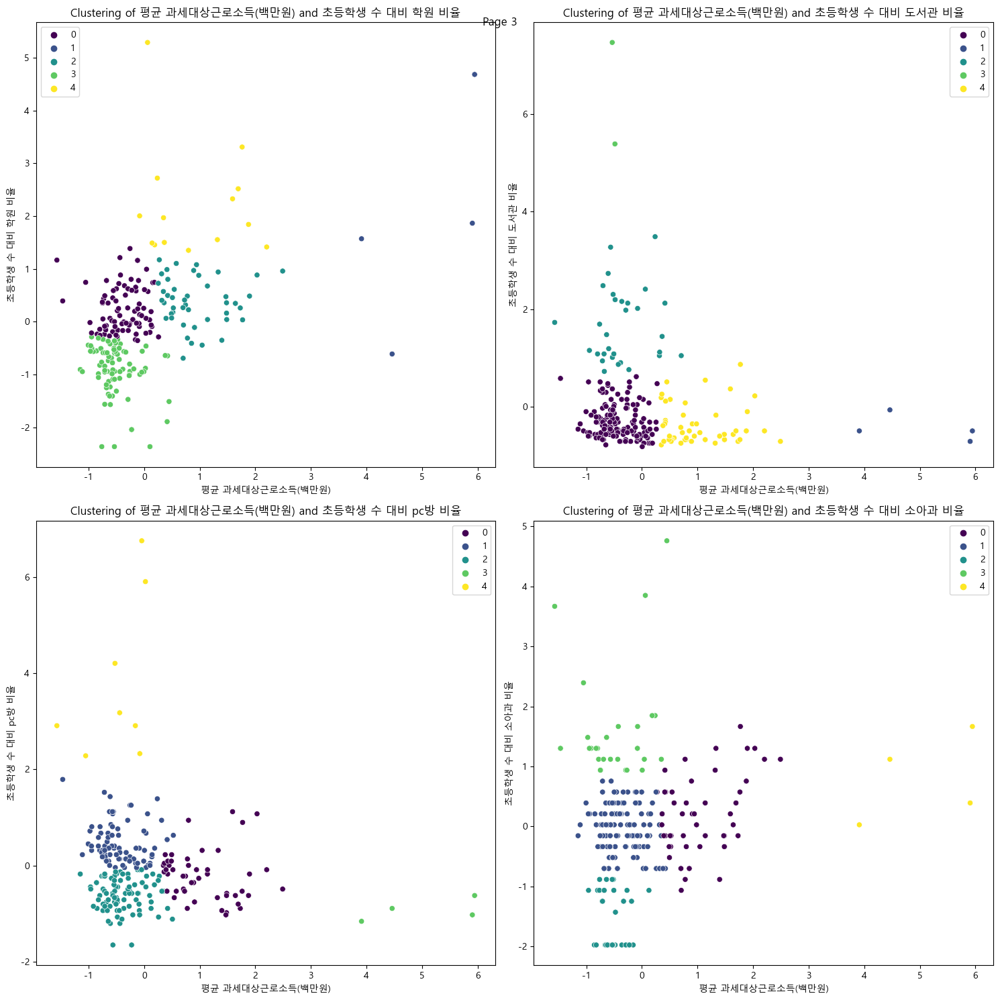

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

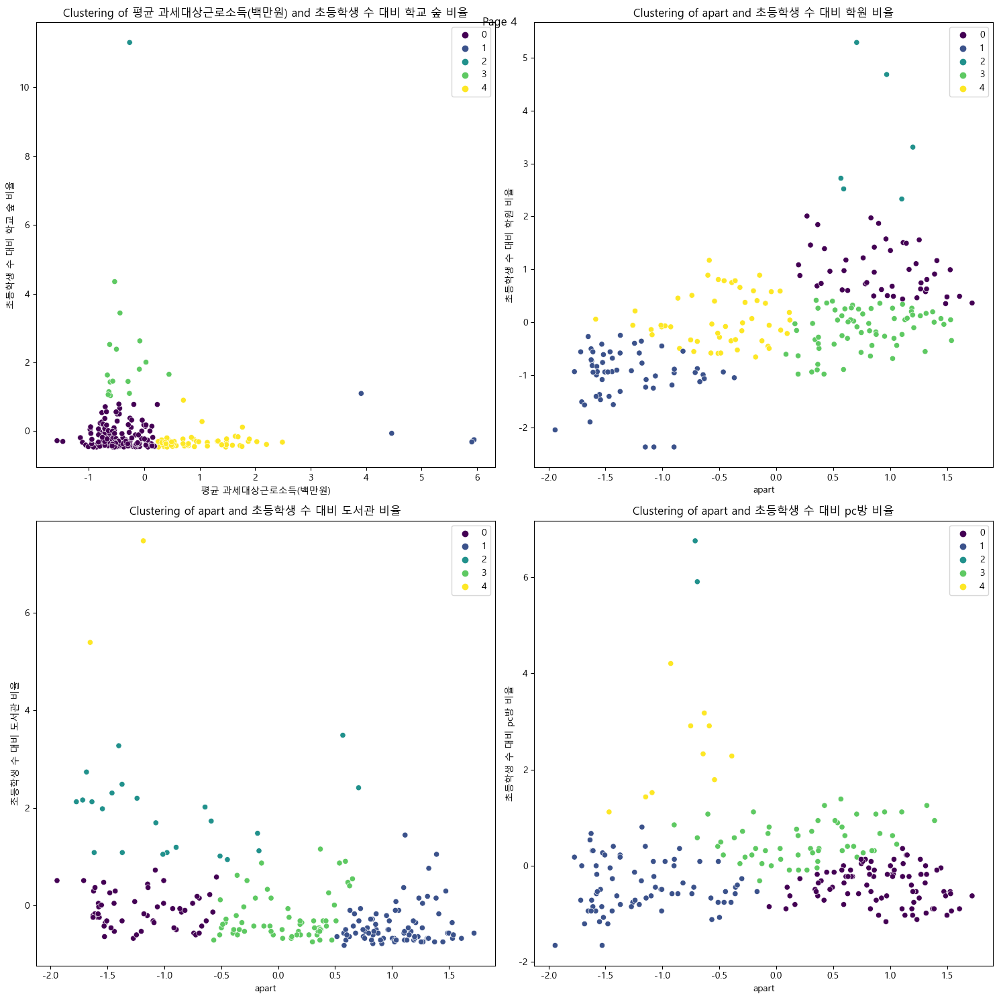

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

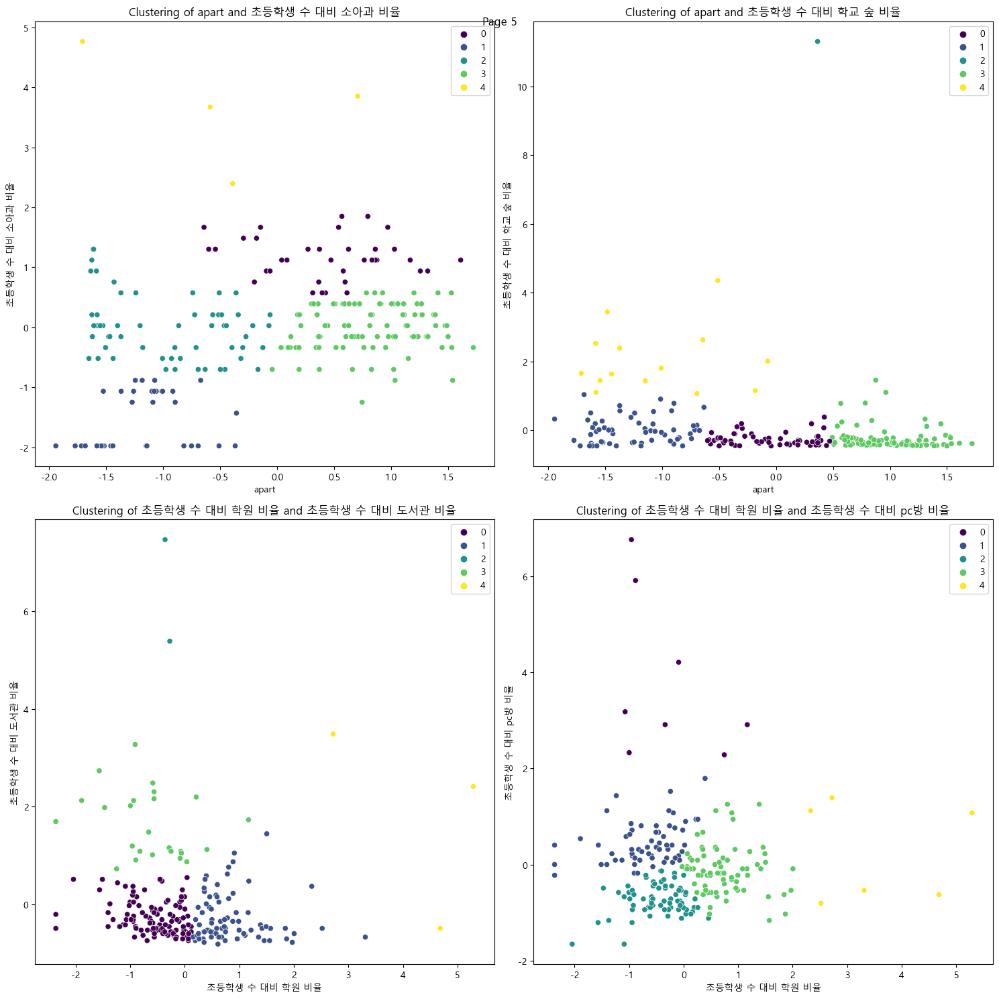

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

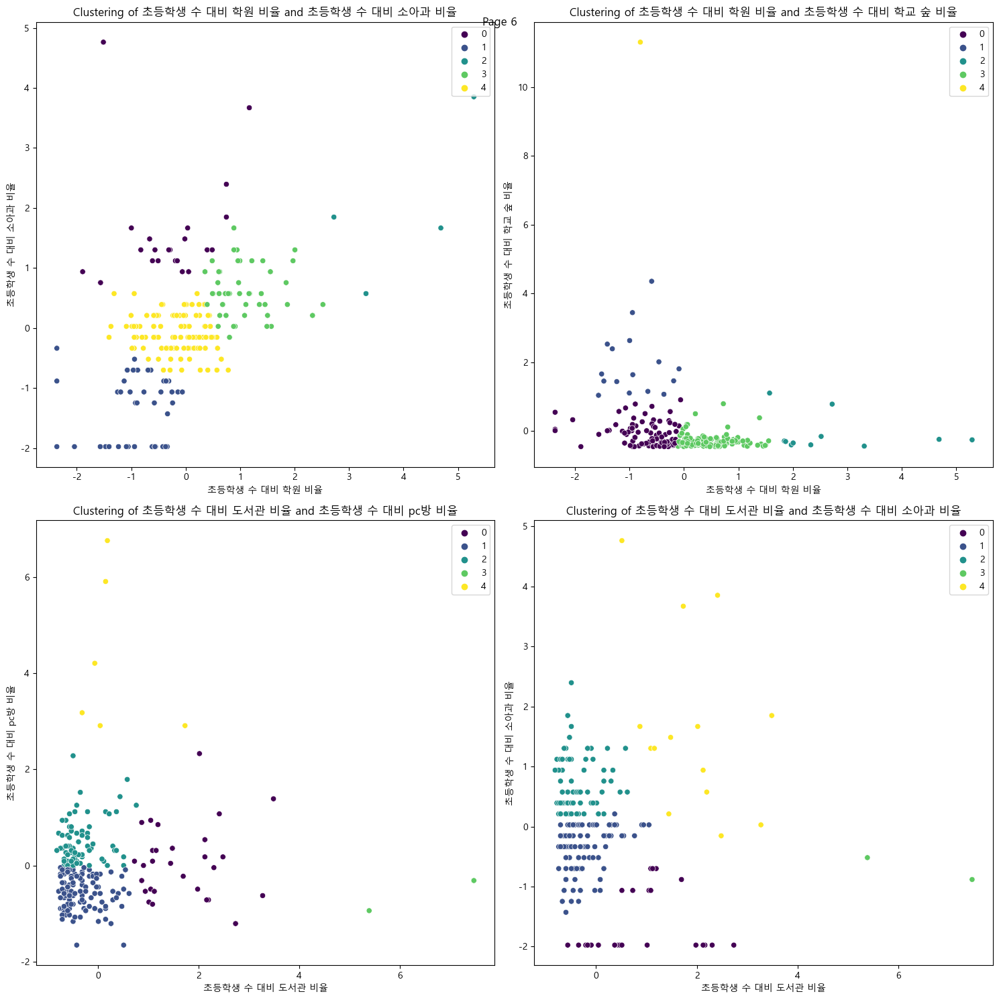

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

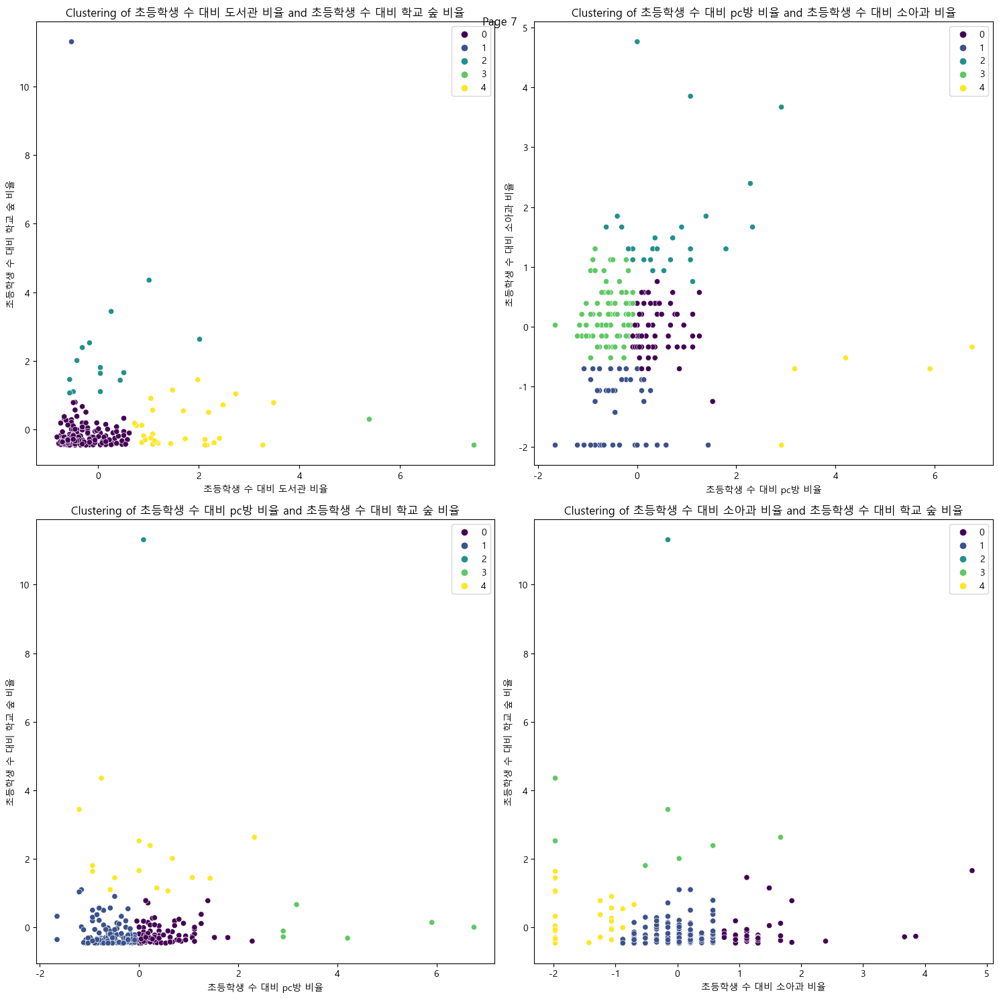

In [17]:
import itertools
# 모든 피처 쌍 생성
feature_combinations = list(itertools.combinations(df.columns, 2))

# 클러스터링 및 시각화
plots_per_page = 4  # 한 페이지에 표시할 플롯 수
num_pages = (len(feature_combinations) + plots_per_page - 1) // plots_per_page

for page in range(num_pages):
    plt.figure(figsize=(15, 15))
    start_index = page * plots_per_page
    end_index = min(start_index + plots_per_page, len(feature_combinations))
    for i, (feat1, feat2) in enumerate(feature_combinations[start_index:end_index], 1):
        # 피처 쌍 선택
        X = df_scaled[:, [df.columns.get_loc(feat1), df.columns.get_loc(feat2)]]
        
        # KMeans 클러스터링 수행
        kmeans = KMeans(n_clusters=5, random_state=0).fit(X)
        labels = kmeans.labels_
        
        # 클러스터링 결과 시각화
        plt.subplot(2, 2, i)
        sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis')
        plt.xlabel(feat1)
        plt.ylabel(feat2)
        plt.title(f'Clustering of {feat1} and {feat2}')
        plt.tight_layout()
    
    plt.suptitle(f'Page {page + 1}')
    plt.show()

## 2.2 K-Medoids

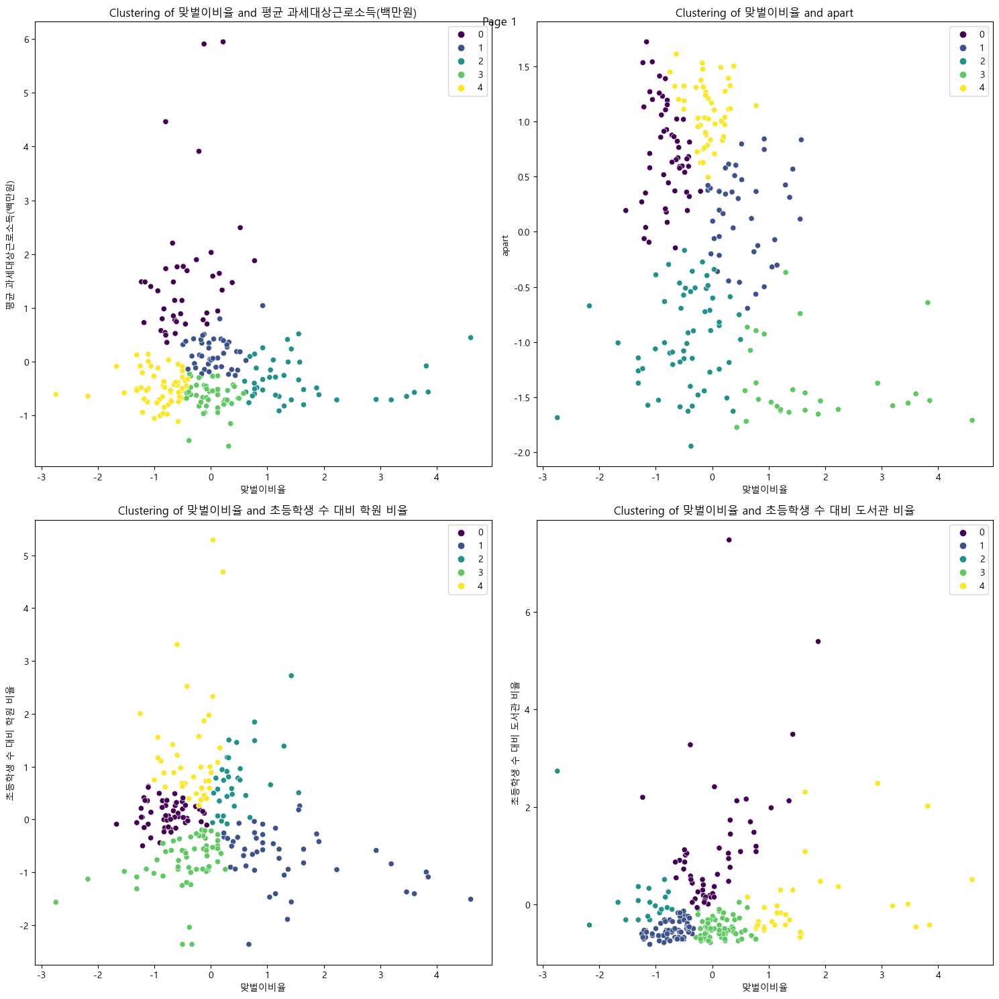

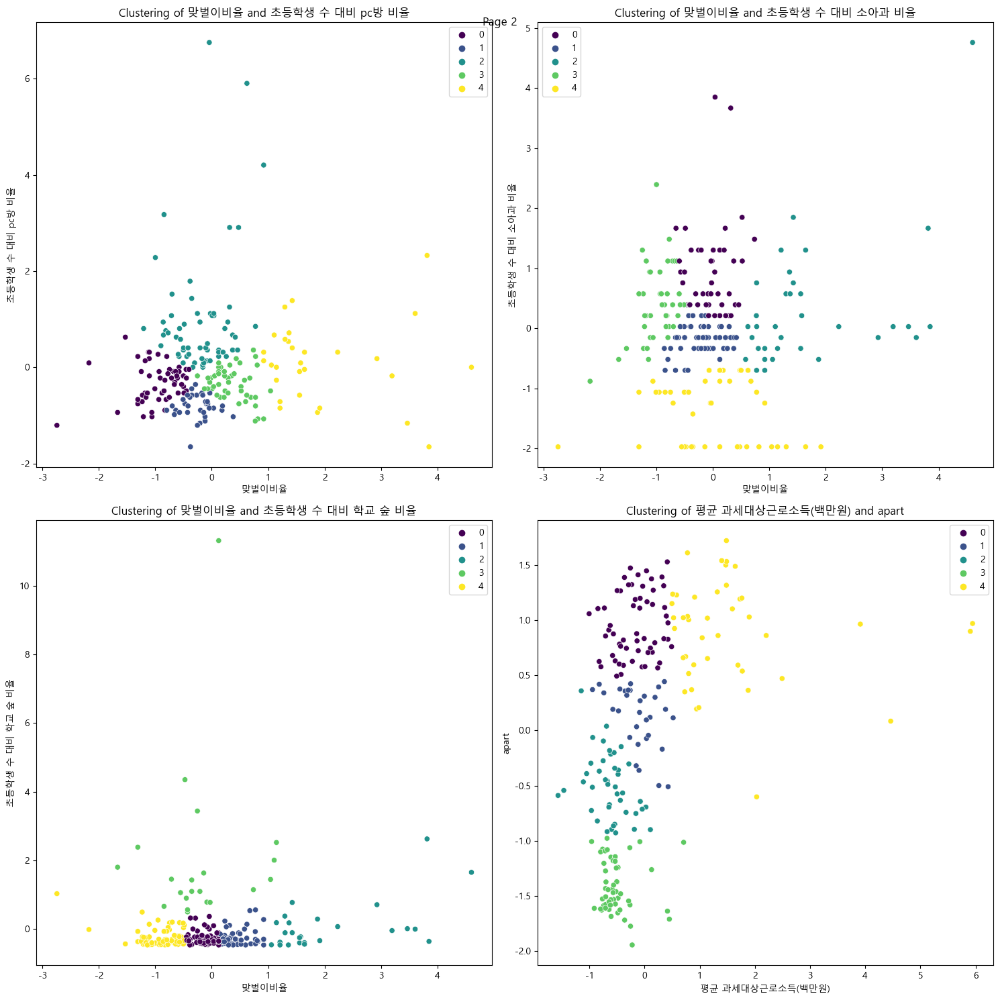

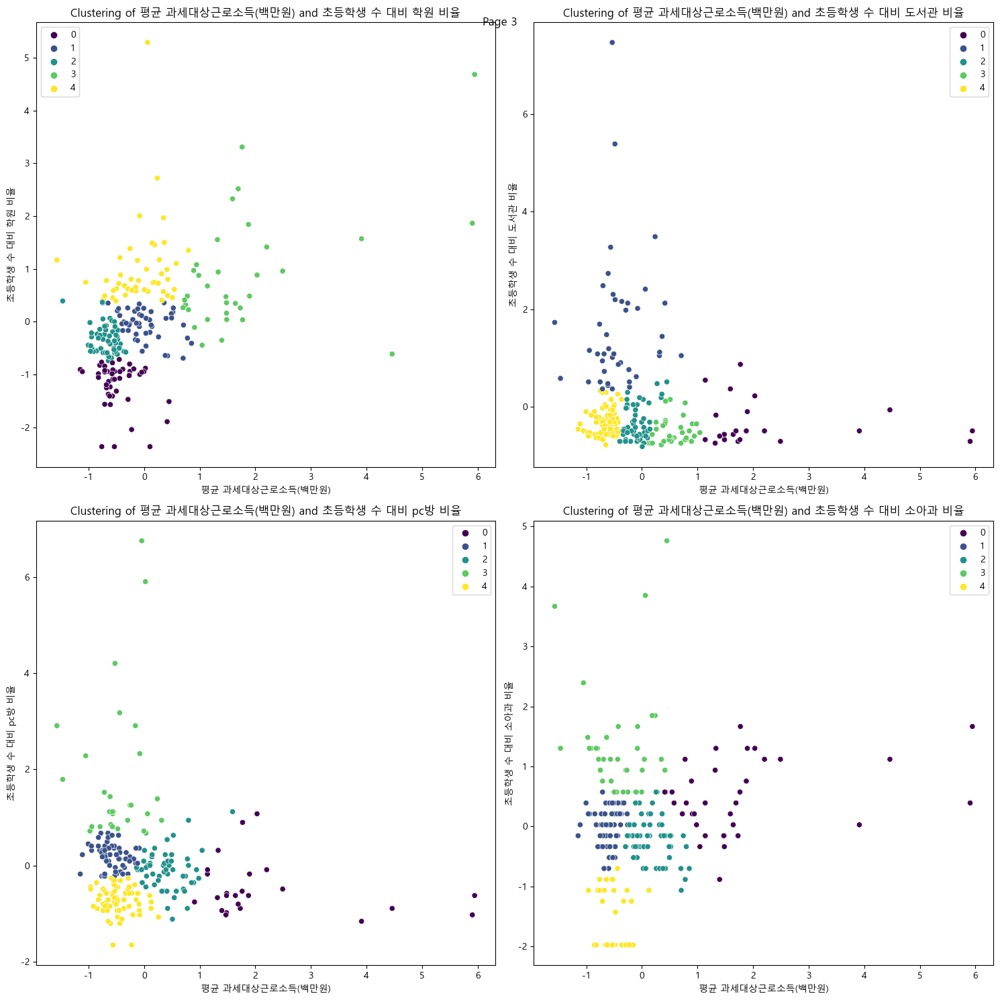

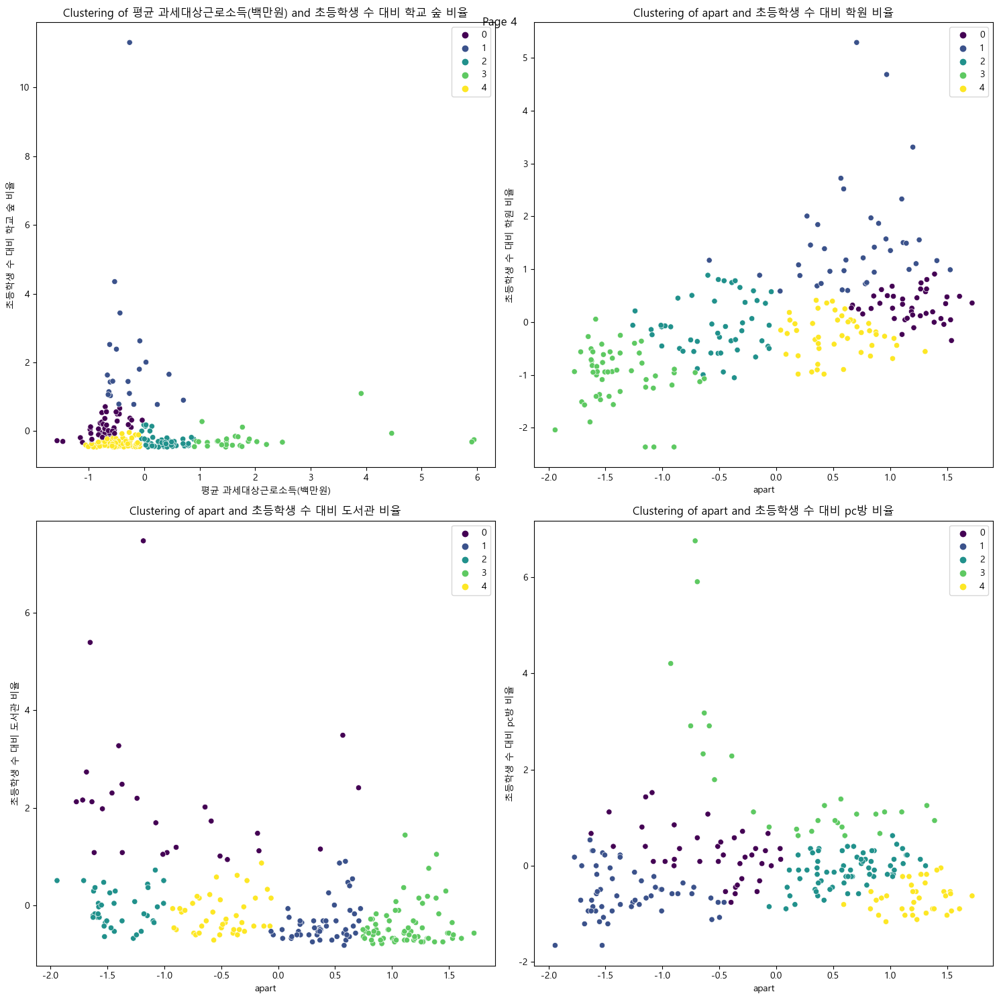

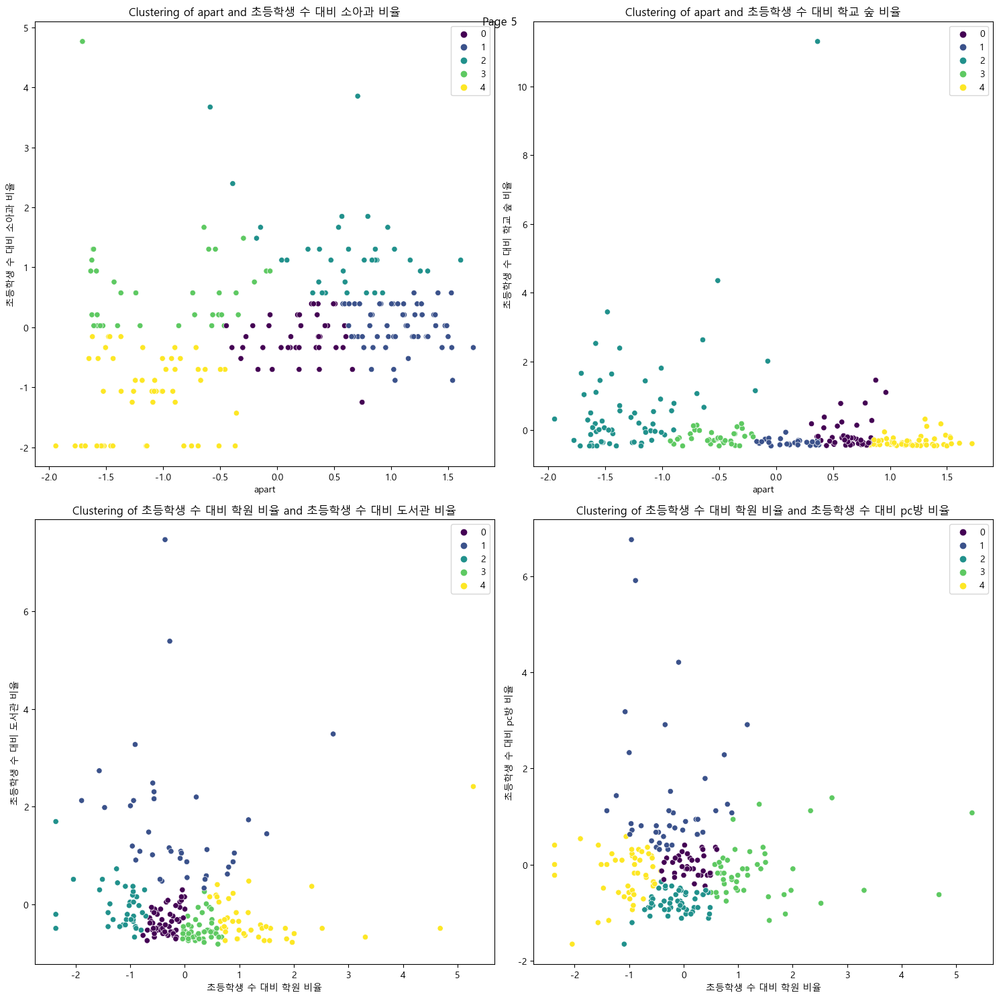

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn_extra\cluster\_k_medoids.py:329: UserWarning: Cluster 3 is empty! self.labels_[self.medoid_indices_[3]] may not be labeled with its corresponding cluster (3).
  warnings.warn(


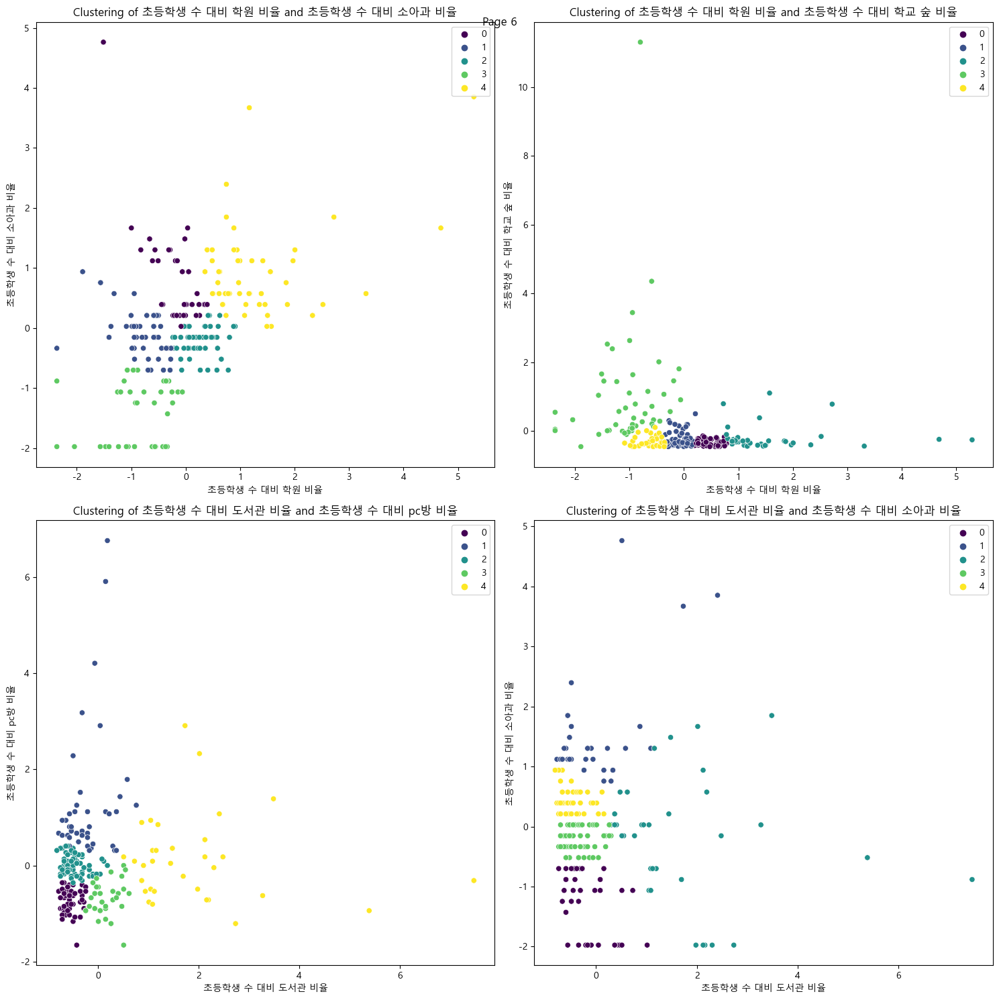

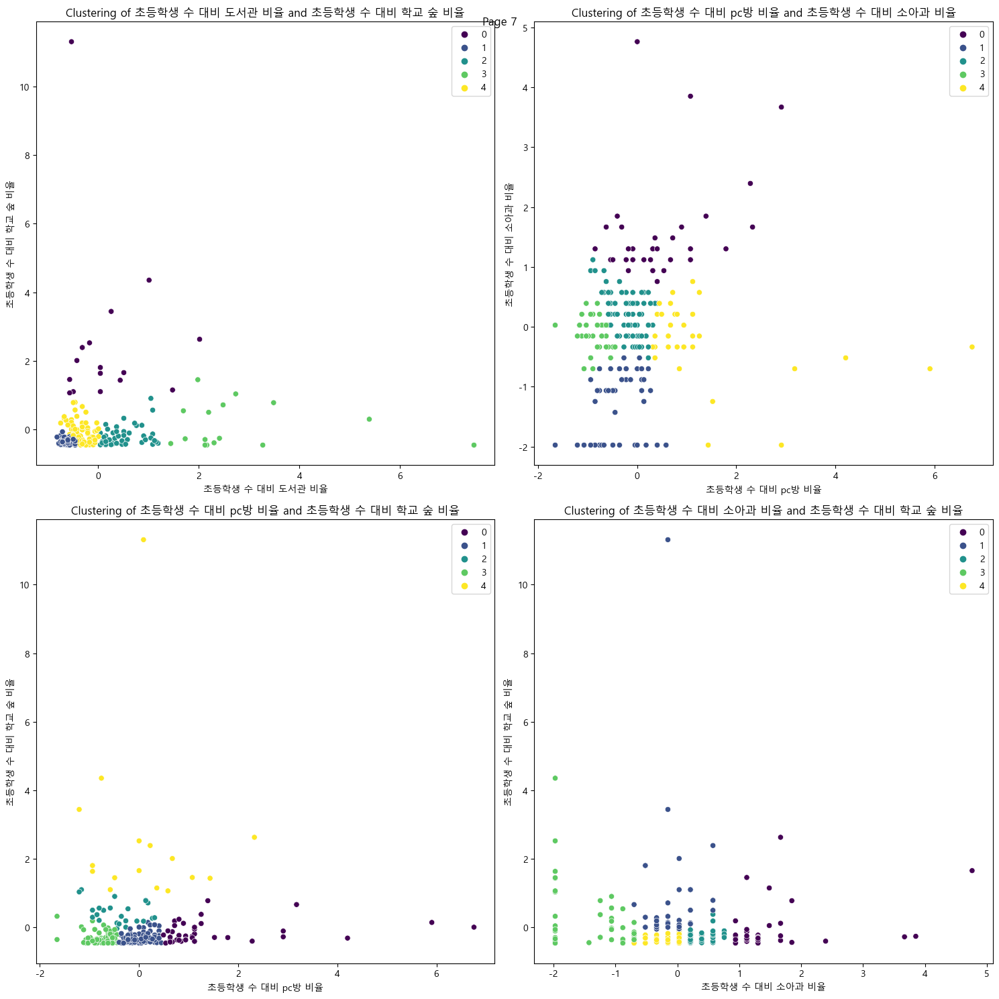

In [18]:
from sklearn_extra.cluster import KMedoids
# 모든 피처 쌍 생성
feature_combinations = list(itertools.combinations(df.columns, 2))

# 클러스터링 및 시각화
plots_per_page = 4  # 한 페이지에 표시할 플롯 수
num_pages = (len(feature_combinations) + plots_per_page - 1) // plots_per_page

for page in range(num_pages):
    plt.figure(figsize=(15, 15))
    start_index = page * plots_per_page
    end_index = min(start_index + plots_per_page, len(feature_combinations))
    for i, (feat1, feat2) in enumerate(feature_combinations[start_index:end_index], 1):
        # 피처 쌍 선택
        X = df_scaled[:, [df.columns.get_loc(feat1), df.columns.get_loc(feat2)]]
        
        # KMedoids 클러스터링 수행
        kmedoids = KMedoids(n_clusters=5, random_state=0).fit(X)
        labels = kmedoids.labels_
        
        # 클러스터링 결과 시각화
        plt.subplot(2, 2, i)
        sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis')
        plt.xlabel(feat1)
        plt.ylabel(feat2)
        plt.title(f'Clustering of {feat1} and {feat2}')
        plt.tight_layout()
    
    plt.suptitle(f'Page {page + 1}')
    plt.show()

## 2.3 DBSCAN

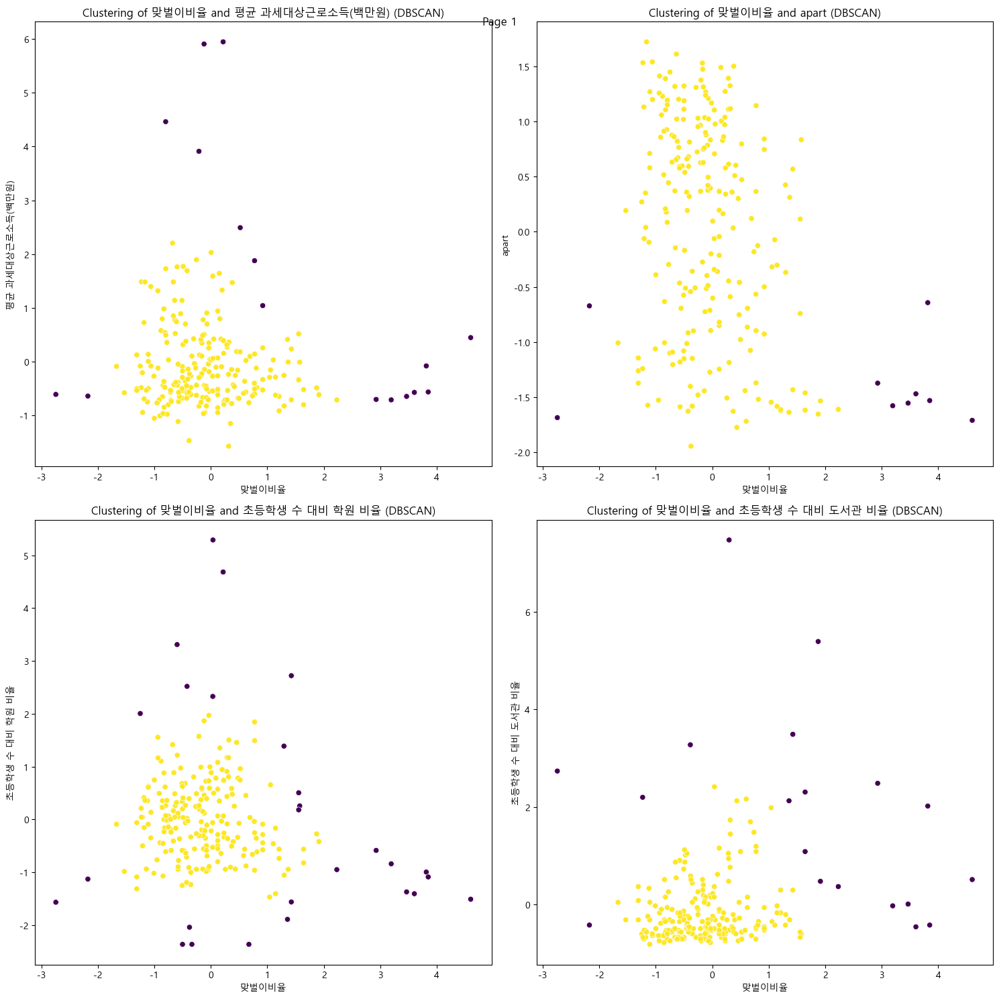

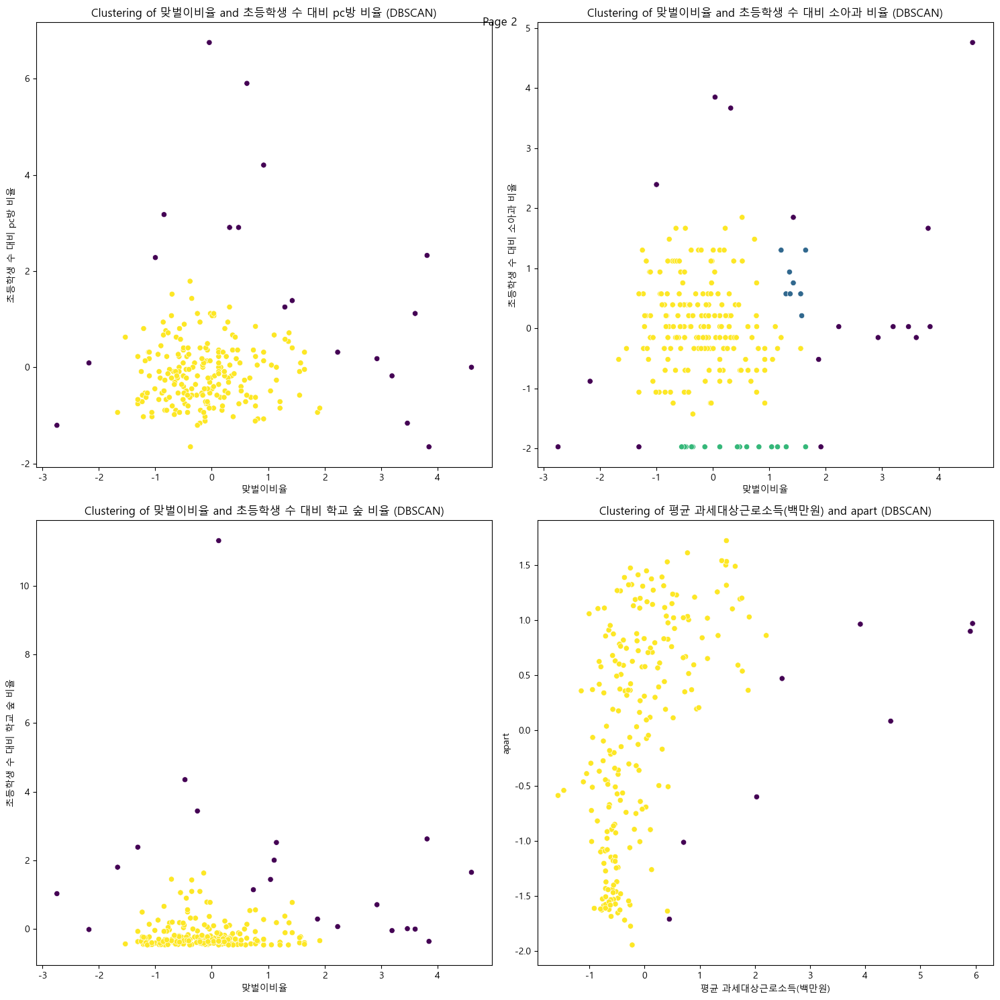

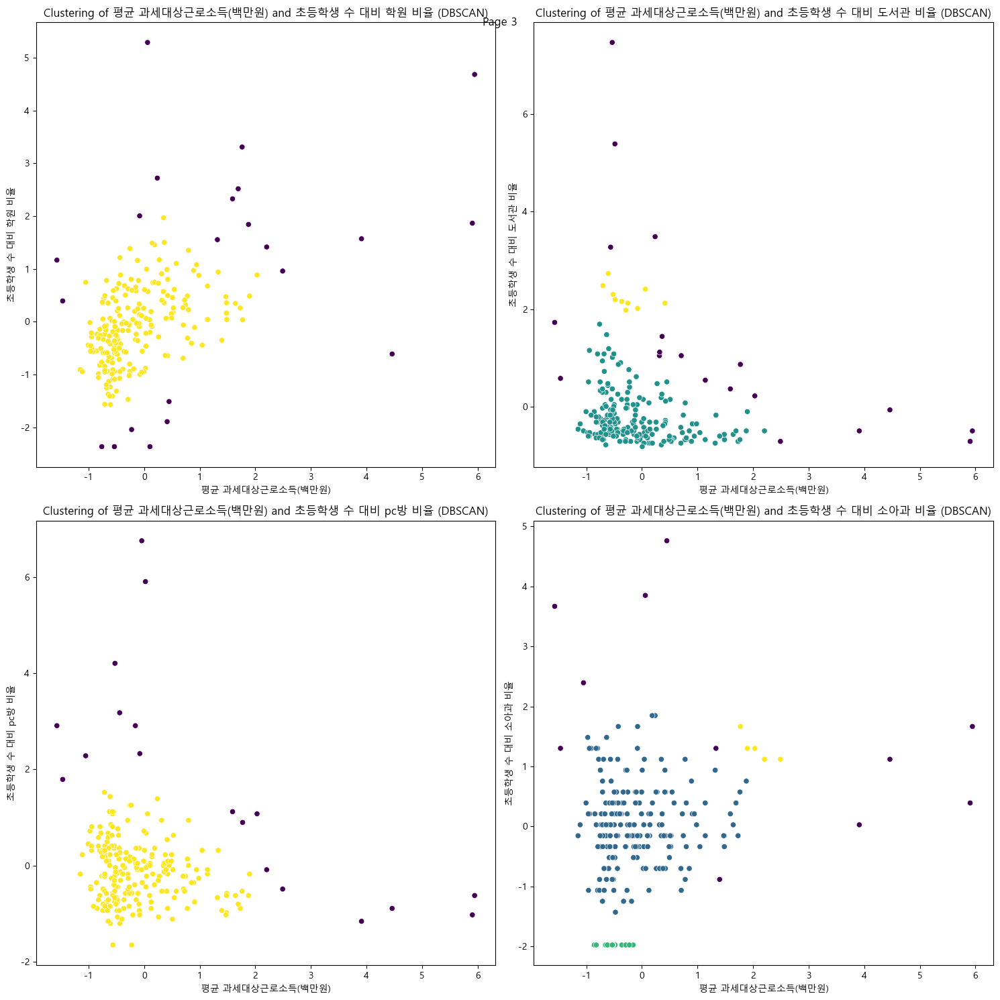

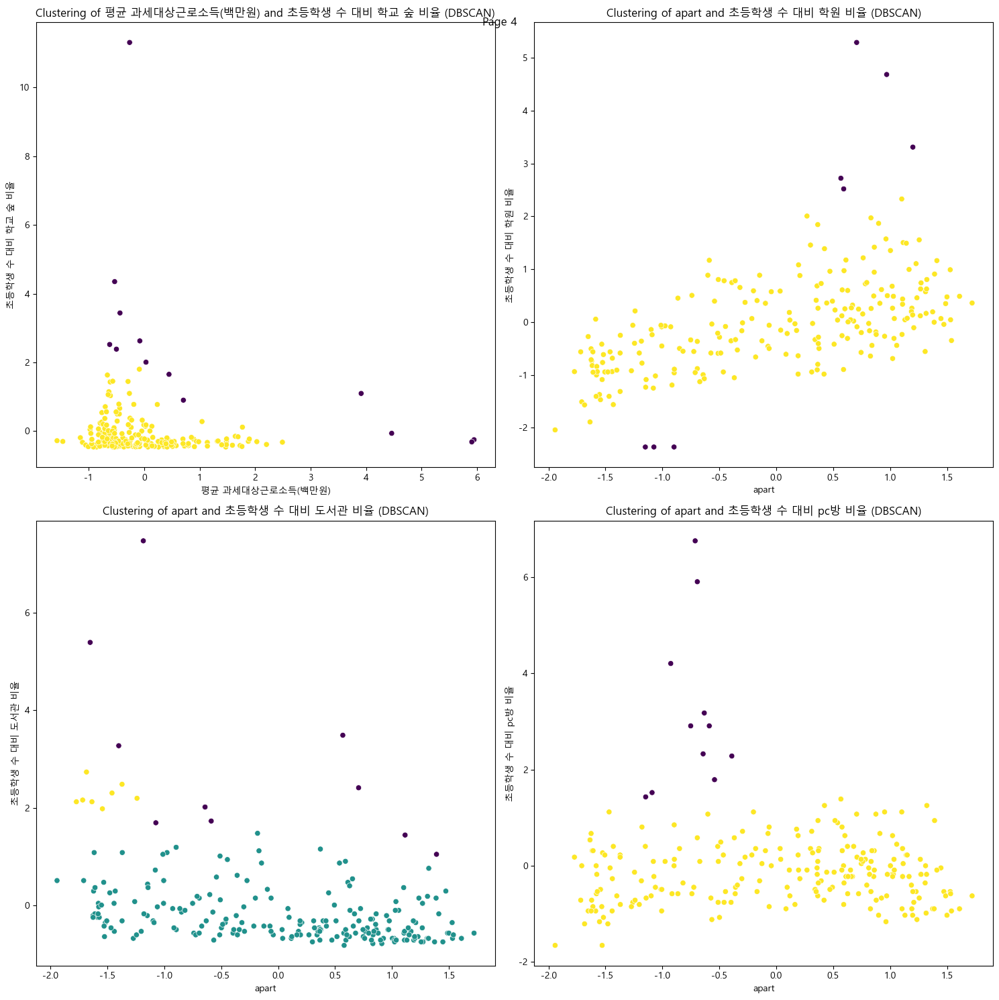

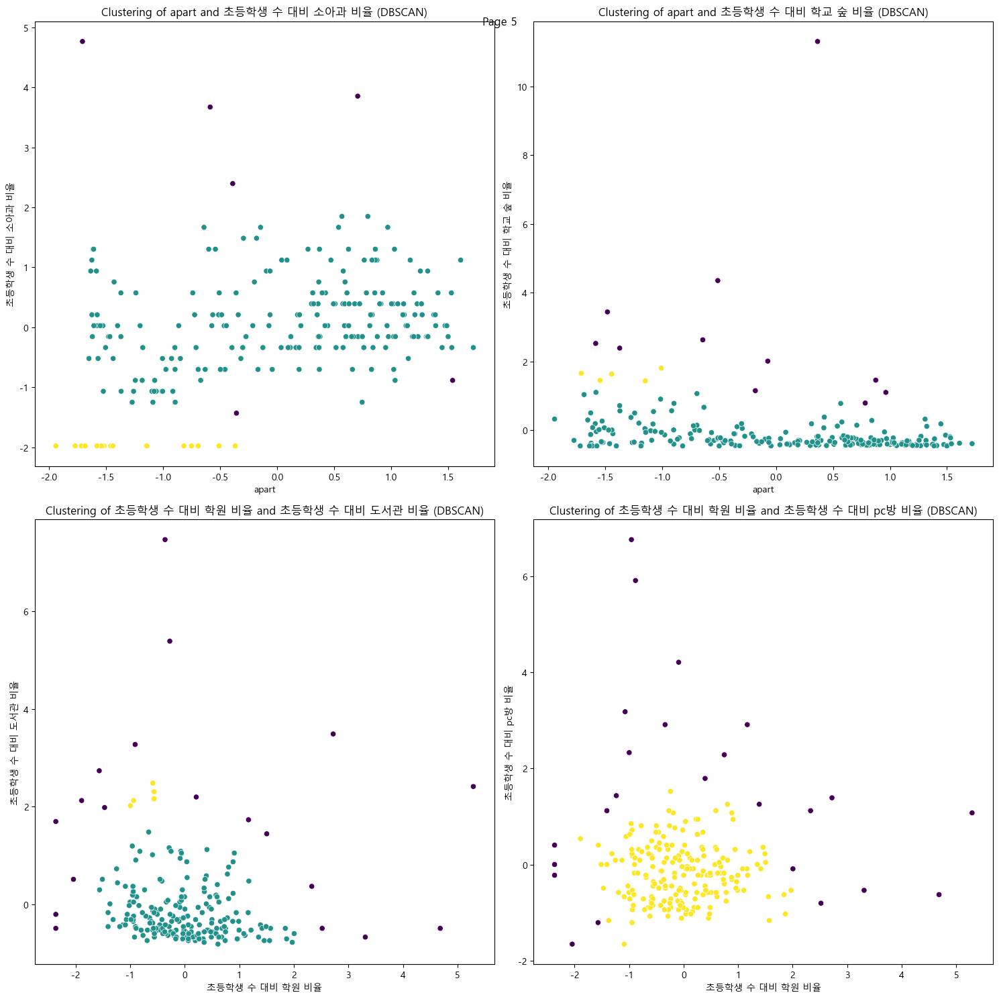

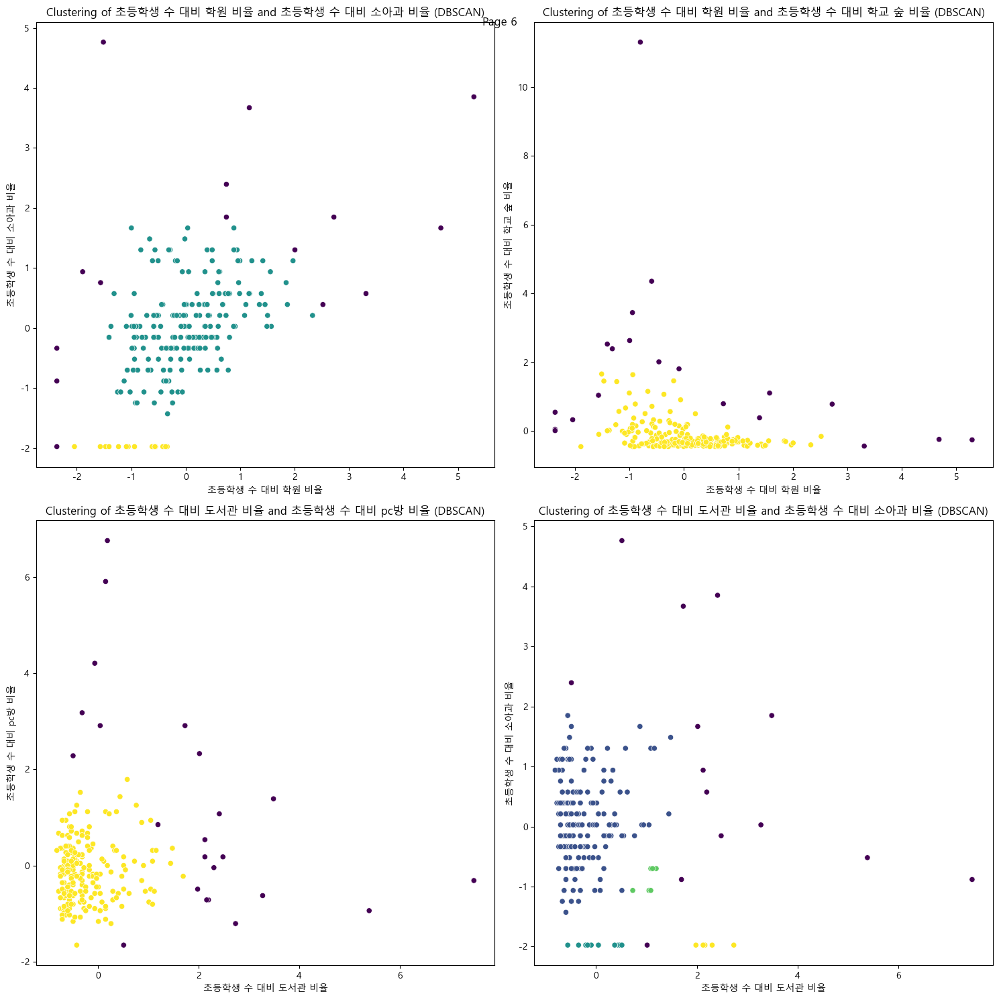

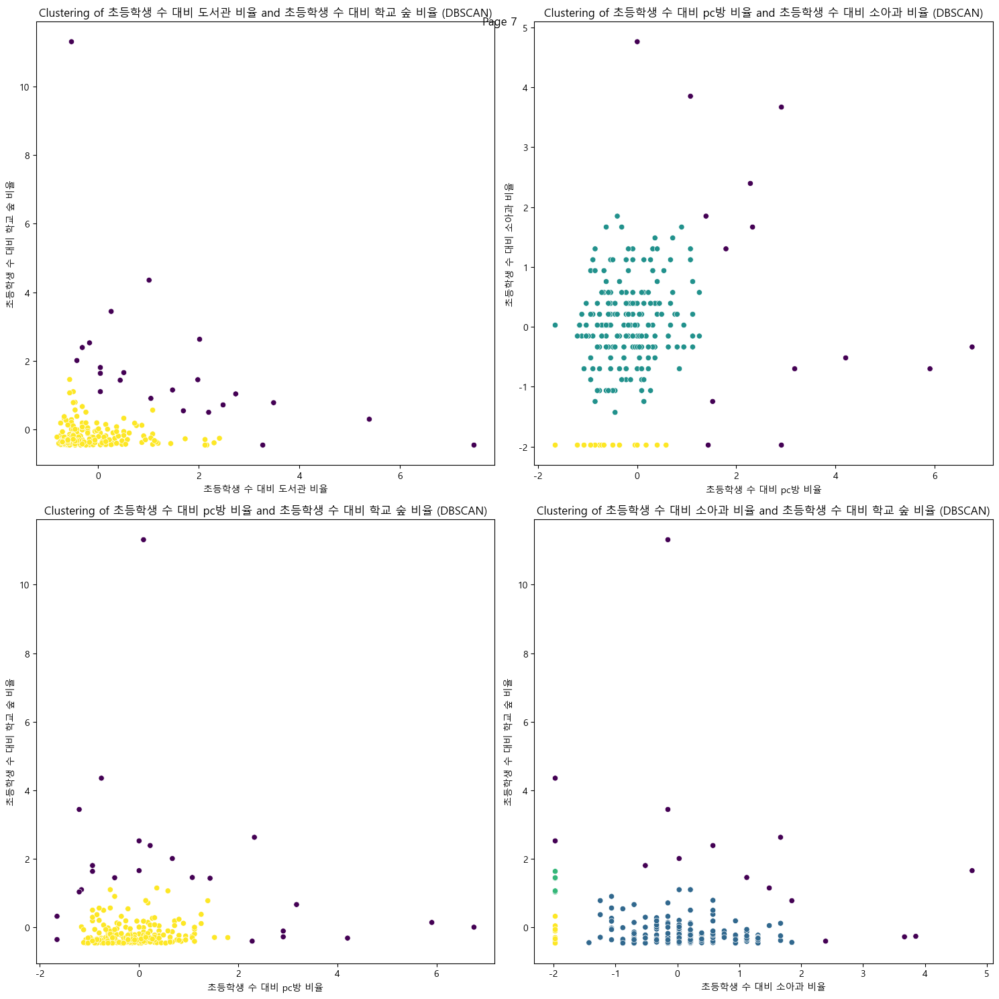

In [19]:
from sklearn.cluster import DBSCAN
from sklearn.model_selection import ParameterGrid

# 모든 피처 쌍 생성
feature_combinations = list(itertools.combinations(df.columns, 2))

# 데이터 스케일링
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# 모든 피처 쌍 생성
feature_combinations = list(itertools.combinations(df.columns, 2))

# 클러스터링 및 시각화
plots_per_page = 4  # 한 페이지에 표시할 플롯 수
num_pages = (len(feature_combinations) + plots_per_page - 1) // plots_per_page

for page in range(num_pages):
    plt.figure(figsize=(15, 15))
    start_index = page * plots_per_page
    end_index = min(start_index + plots_per_page, len(feature_combinations))
    for i, (feat1, feat2) in enumerate(feature_combinations[start_index:end_index], 1):
        # 피처 쌍 선택
        X = df_scaled[:, [df.columns.get_loc(feat1), df.columns.get_loc(feat2)]]
        
        # DBSCAN 클러스터링 수행
        dbscan = DBSCAN(eps=0.5, min_samples=5).fit(X)
        labels = dbscan.labels_
        
        # 클러스터링 결과 시각화
        plt.subplot(2, 2, i)
        sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis', legend=None)
        plt.xlabel(feat1)
        plt.ylabel(feat2)
        plt.title(f'Clustering of {feat1} and {feat2} (DBSCAN)')
        plt.tight_layout()
    
    plt.suptitle(f'Page {page + 1}')
    plt.show()

## 2.4 Agglomerative 

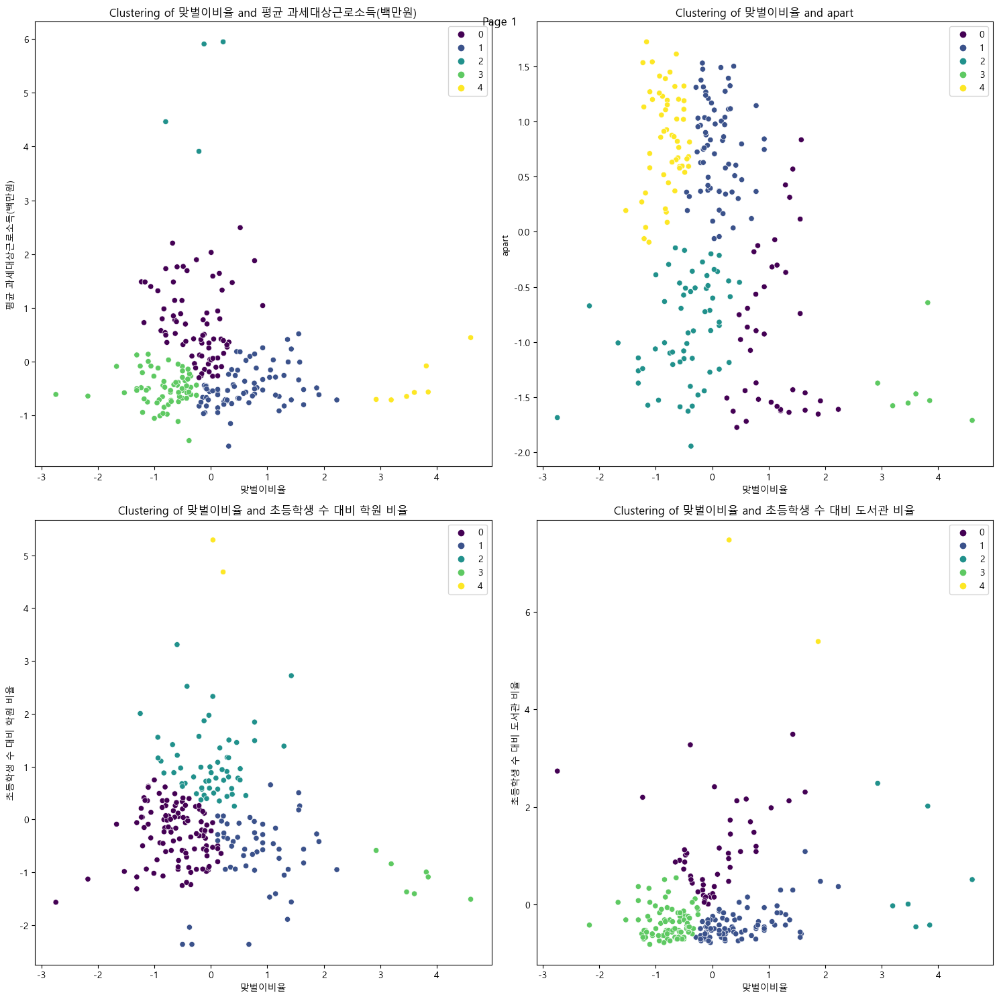

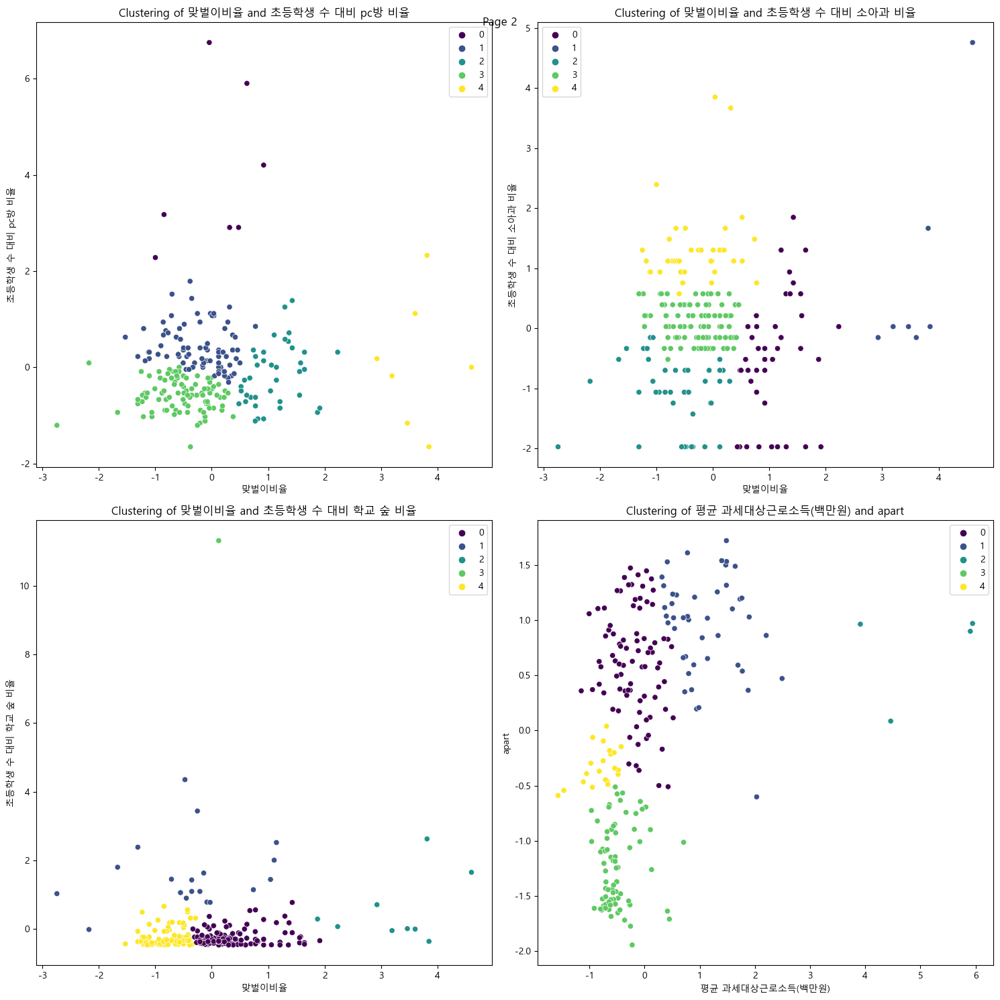

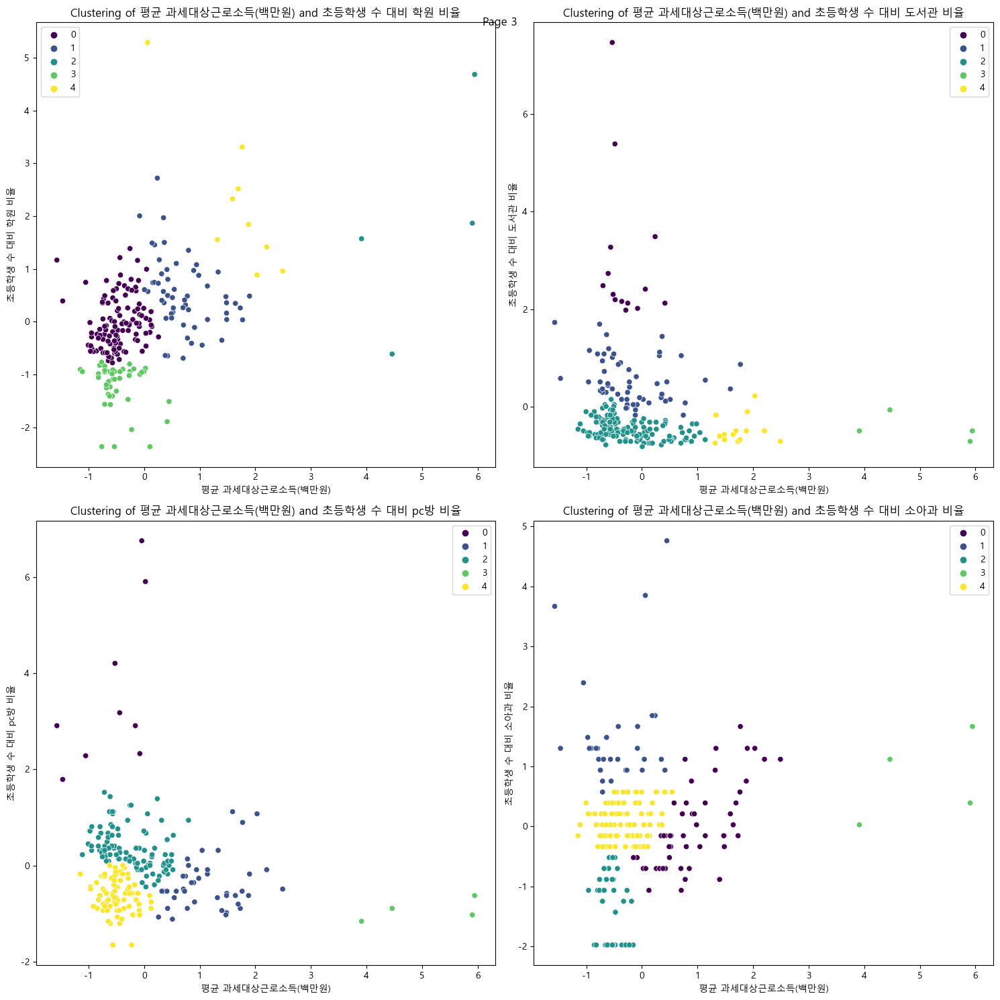

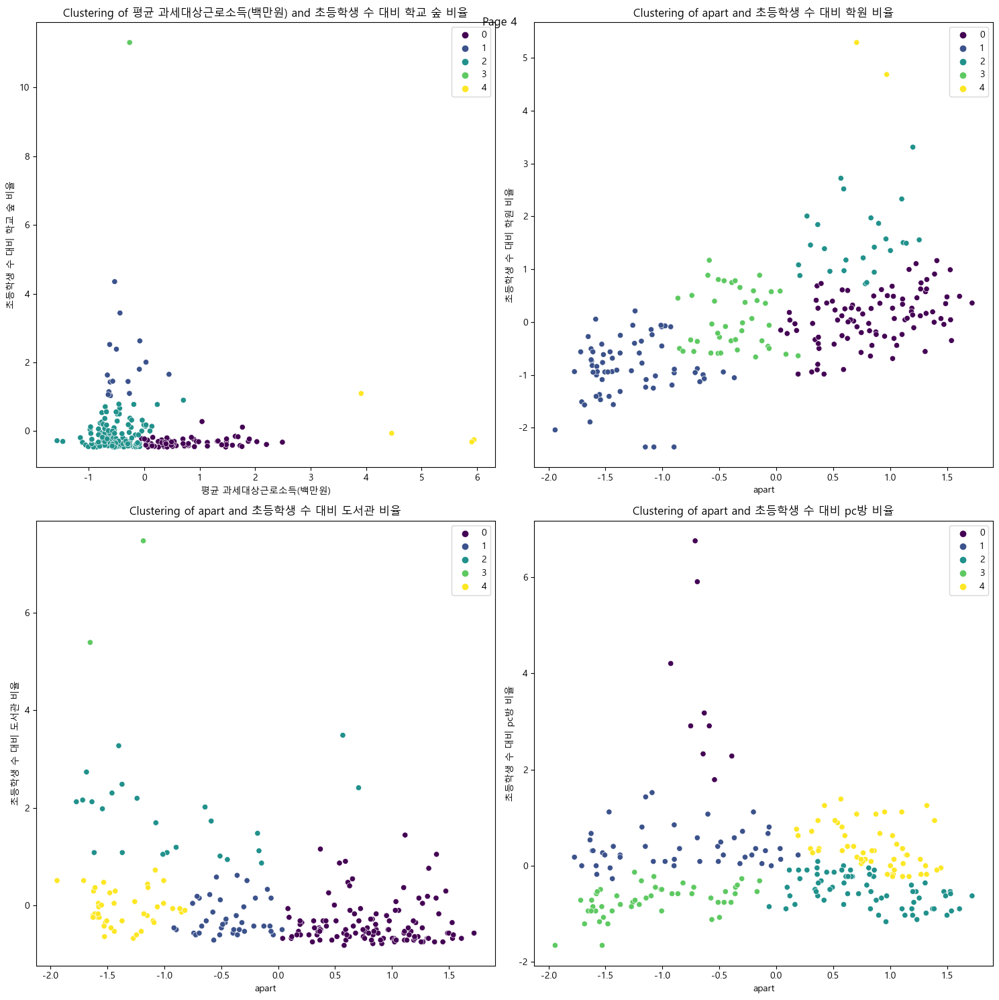

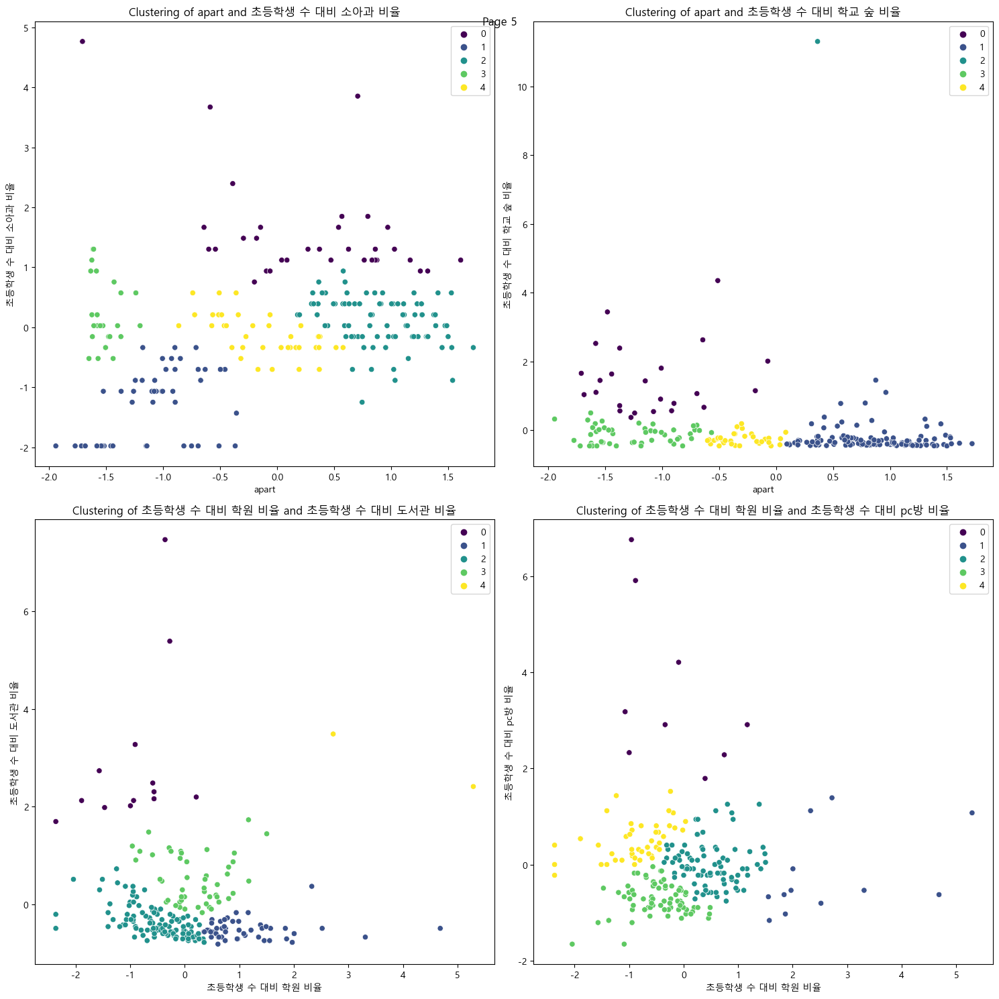

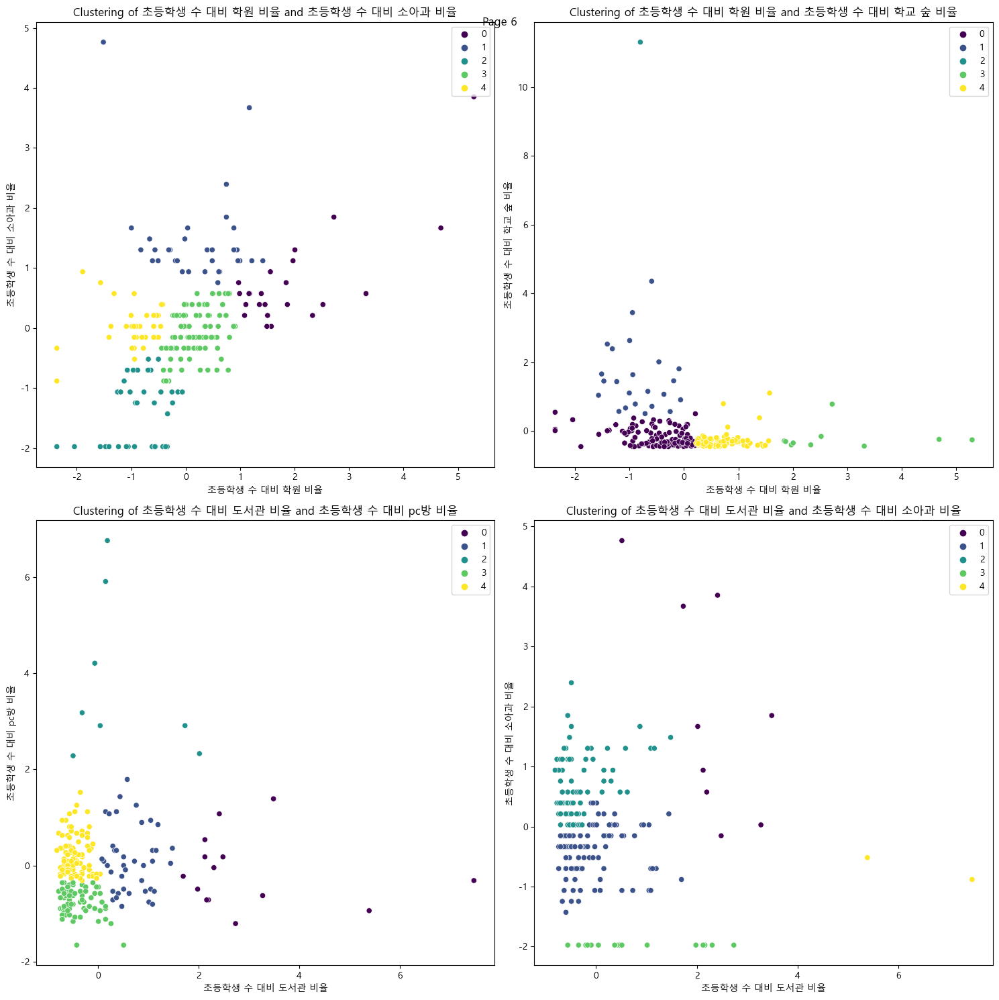

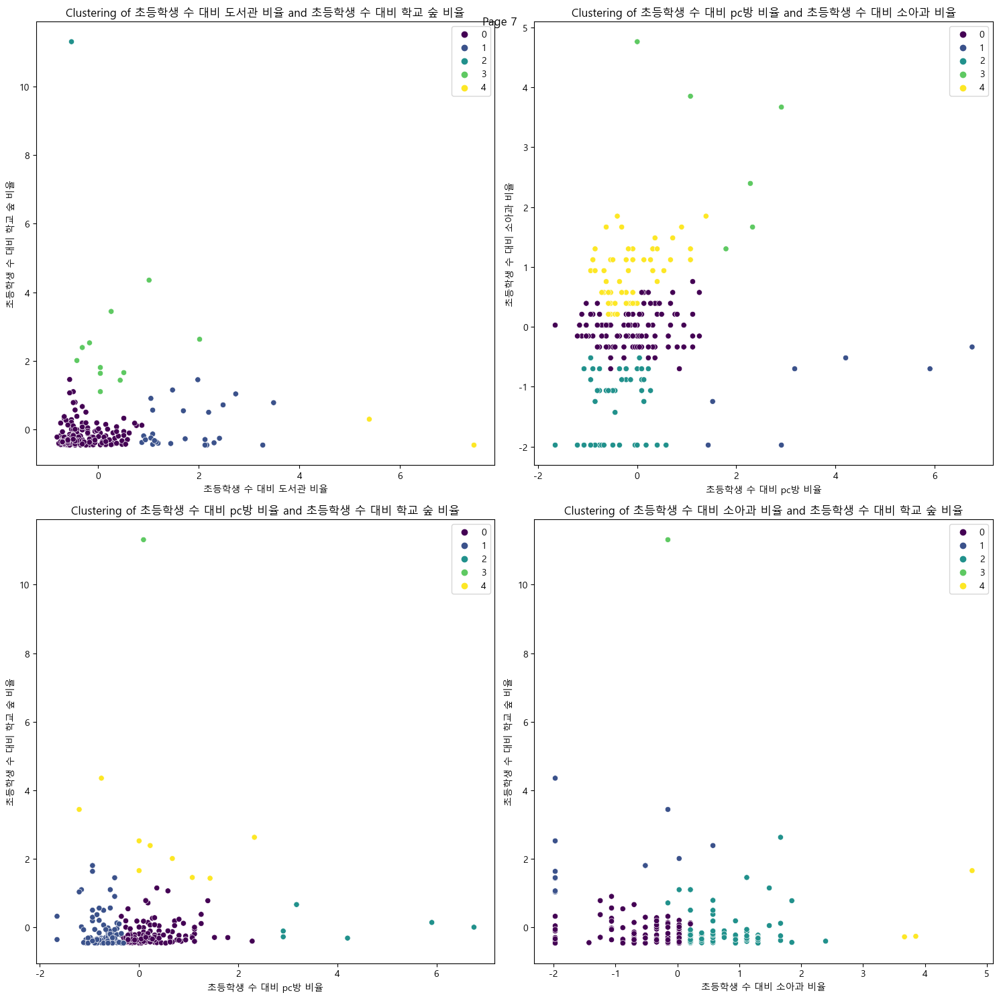

In [20]:
from sklearn.cluster import AgglomerativeClustering
# 모든 피처 쌍 생성
feature_combinations = list(itertools.combinations(df.columns, 2))

# 클러스터링 및 시각화
plots_per_page = 4  # 한 페이지에 표시할 플롯 수
num_pages = (len(feature_combinations) + plots_per_page - 1) // plots_per_page

for page in range(num_pages):
    plt.figure(figsize=(15, 15))
    start_index = page * plots_per_page
    end_index = min(start_index + plots_per_page, len(feature_combinations))
    for i, (feat1, feat2) in enumerate(feature_combinations[start_index:end_index], 1):
        # 피처 쌍 선택
        X = df_scaled[:, [df.columns.get_loc(feat1), df.columns.get_loc(feat2)]]
        
        # Agglomerative 클러스터링 수행
        agglomerative = AgglomerativeClustering(n_clusters=5)
        labels = agglomerative.fit_predict(X)
        
        # 클러스터링 결과 시각화
        plt.subplot(2, 2, i)
        sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis')
        plt.xlabel(feat1)
        plt.ylabel(feat2)
        plt.title(f'Clustering of {feat1} and {feat2}')
        plt.tight_layout()
    
    plt.suptitle(f'Page {page + 1}')
    plt.show()

## 2.5 MeanShift

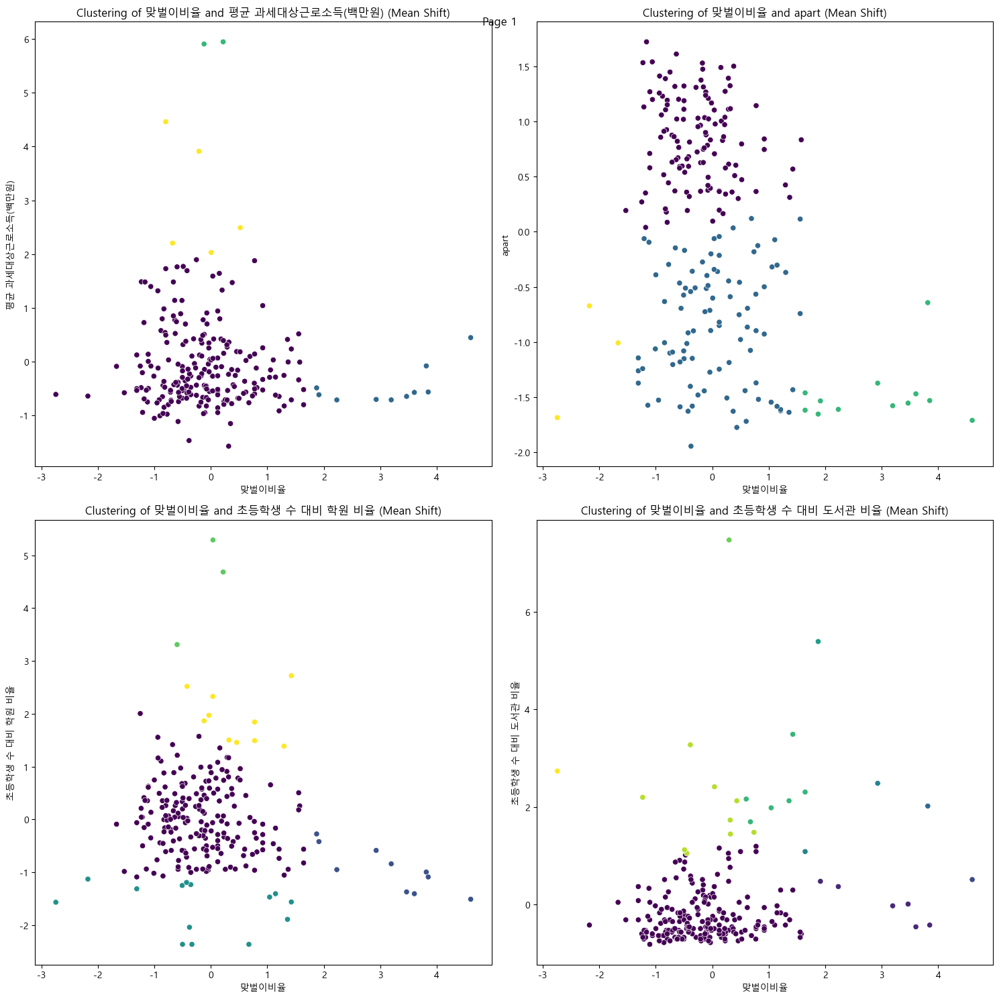

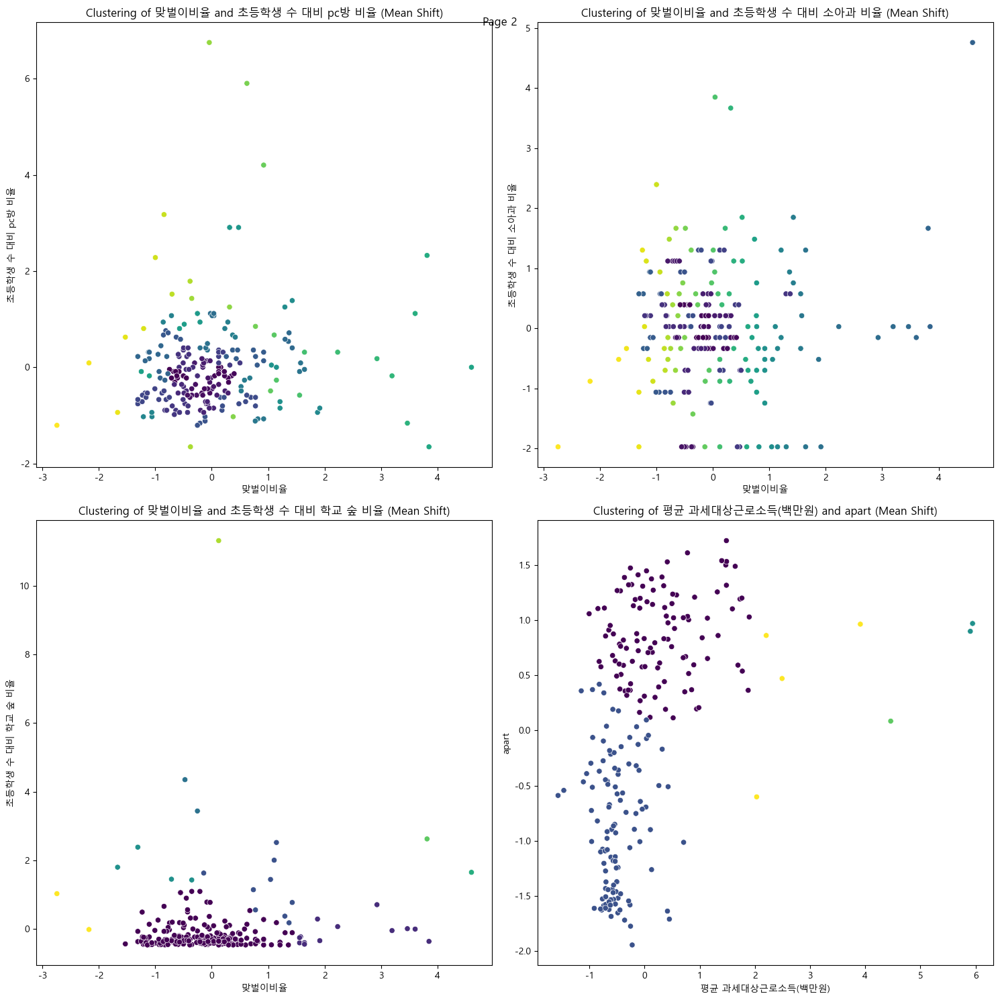

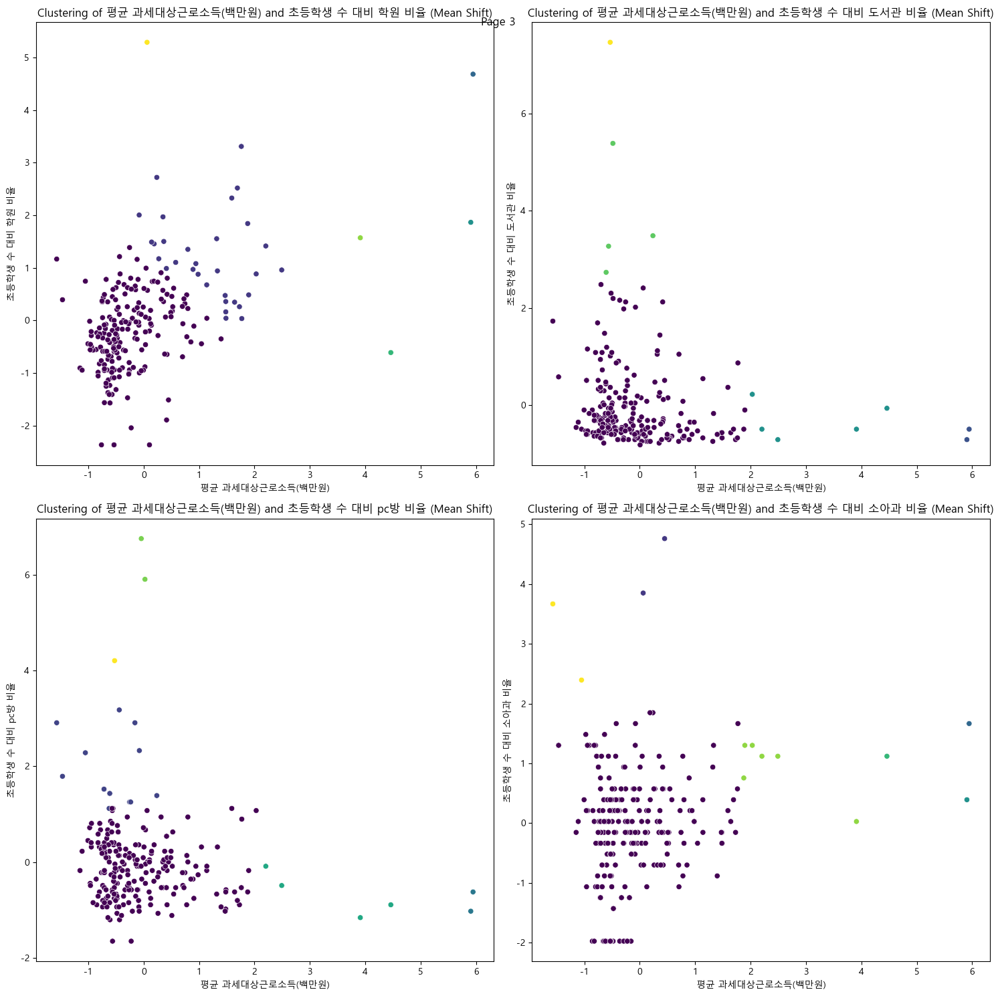

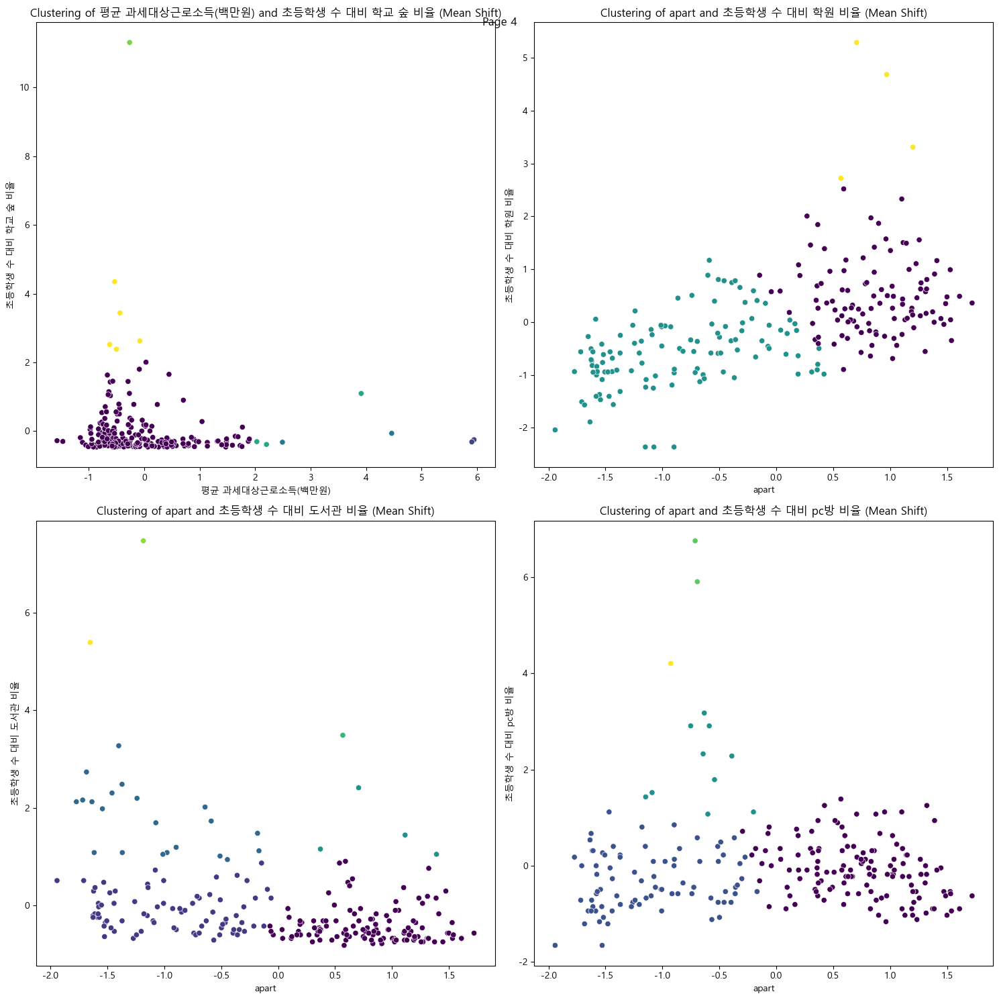

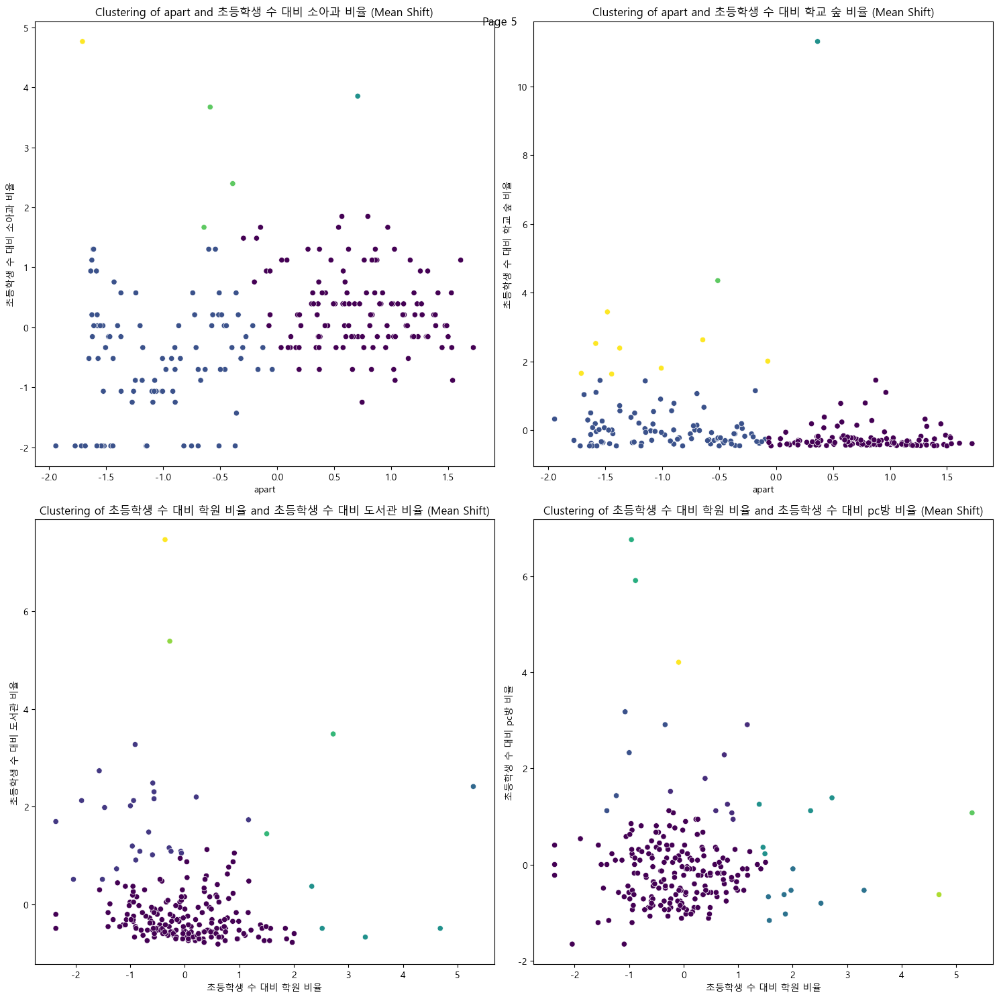

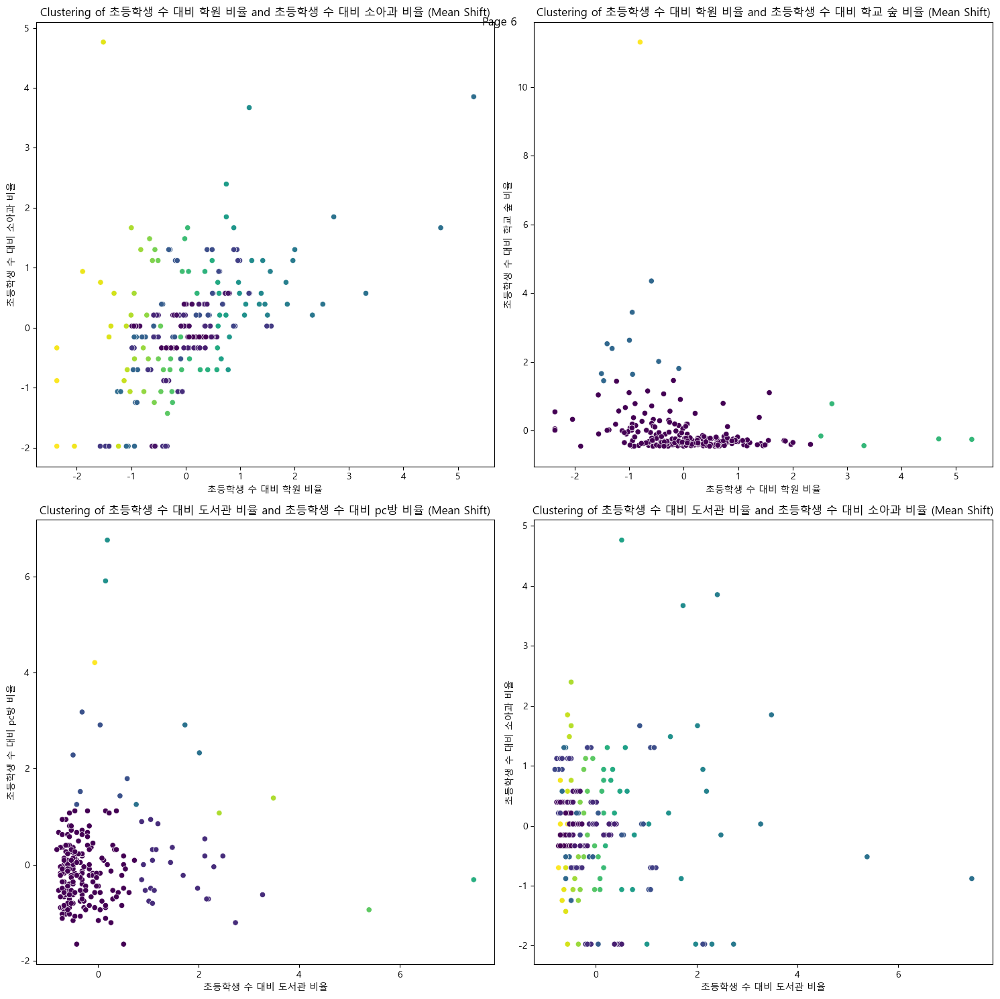

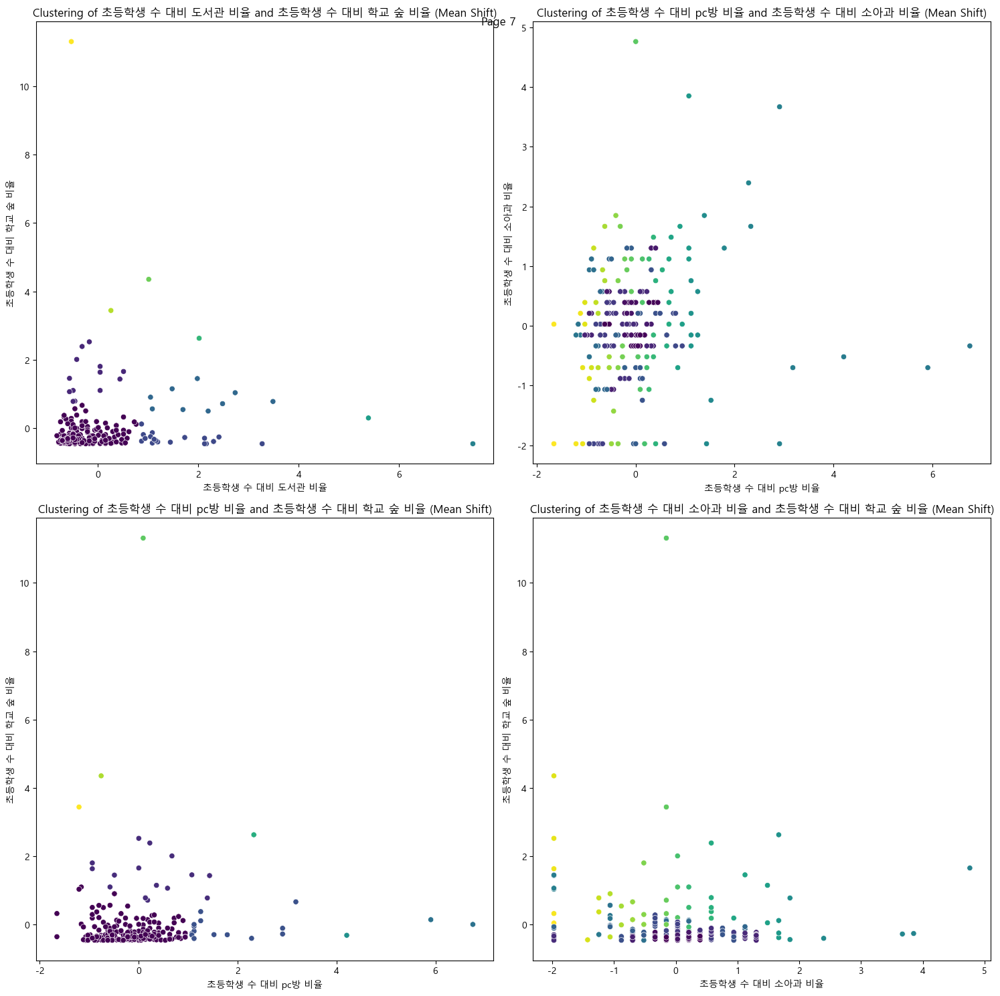

In [21]:
from sklearn.cluster import MeanShift, estimate_bandwidth
# 모든 피처 쌍 생성
feature_combinations = list(itertools.combinations(df.columns, 2))

# 그리드 서치를 위한 파라미터 그리드 설정
param_grid = {
    'bandwidth': np.linspace(0.1, 1.0, 10)
}

# 최적의 파라미터를 찾는 함수
def find_best_params(X, param_grid):
    best_score = -1
    best_params = None
    for params in ParameterGrid(param_grid):
        mean_shift = MeanShift(bandwidth=params['bandwidth'])
        labels = mean_shift.fit_predict(X)
        if len(set(labels)) > 1:
            score = silhouette_score(X, labels)
            if score > best_score:
                best_score = score
                best_params = params
    return best_params

# 클러스터링 및 시각화
plots_per_page = 4  # 한 페이지에 표시할 플롯 수
num_pages = (len(feature_combinations) + plots_per_page - 1) // plots_per_page

for page in range(num_pages):
    plt.figure(figsize=(15, 15))
    start_index = page * plots_per_page
    end_index = min(start_index + plots_per_page, len(feature_combinations))
    for i, (feat1, feat2) in enumerate(feature_combinations[start_index:end_index], 1):
        # 피처 쌍 선택
        X = df_scaled[:, [df.columns.get_loc(feat1), df.columns.get_loc(feat2)]]
        
        # 최적의 하이퍼파라미터 찾기
        best_params = find_best_params(X, param_grid)
        mean_shift = MeanShift(bandwidth=best_params['bandwidth'])
        labels = mean_shift.fit_predict(X)
        
        # 클러스터링 결과 시각화
        plt.subplot(2, 2, i)
        sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='viridis', legend=None)
        plt.xlabel(feat1)
        plt.ylabel(feat2)
        plt.title(f'Clustering of {feat1} and {feat2} (Mean Shift)')
        plt.tight_layout()
    
    plt.suptitle(f'Page {page + 1}')
    plt.show()

# 3. 전체 데이터로 clustering

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.model_selection import ParameterGrid


### 3.1 K-means

In [23]:
def silhouette_analysis(X, max_k=10):
    silhouette_scores = []
    for k in range(2, max_k + 1):
        kmeans = KMeans(init='k-means++',n_clusters=k, random_state=42)
        kmeans.fit(X)
        score = silhouette_score(X, kmeans.labels_)
        silhouette_scores.append(score)
    plt.figure(figsize=(10, 8))
    plt.plot(range(2, max_k + 1), silhouette_scores, marker='o')
    plt.title('Silhouette Analysis')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.show()

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

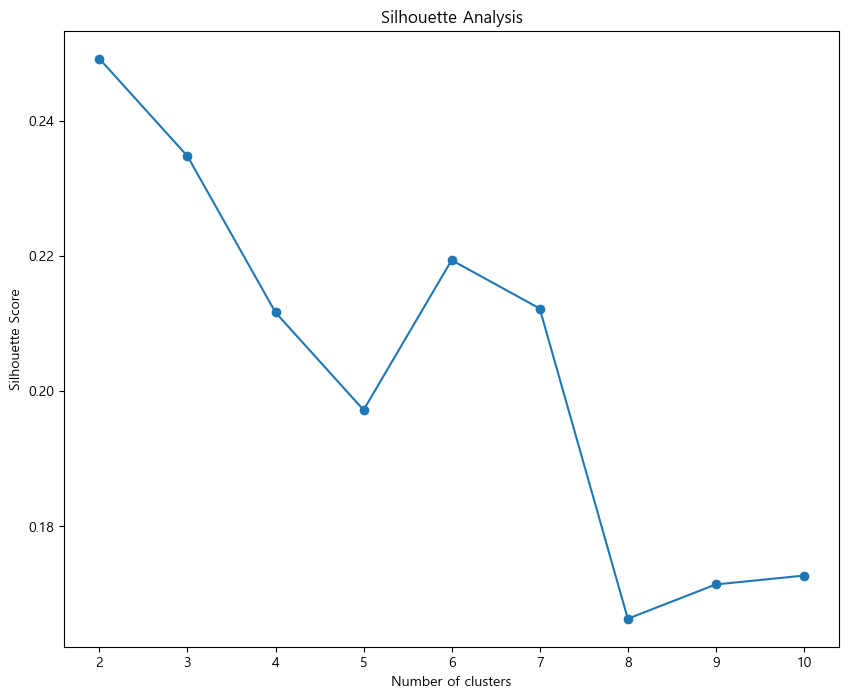

In [24]:
silhouette_analysis(standard_scaled)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

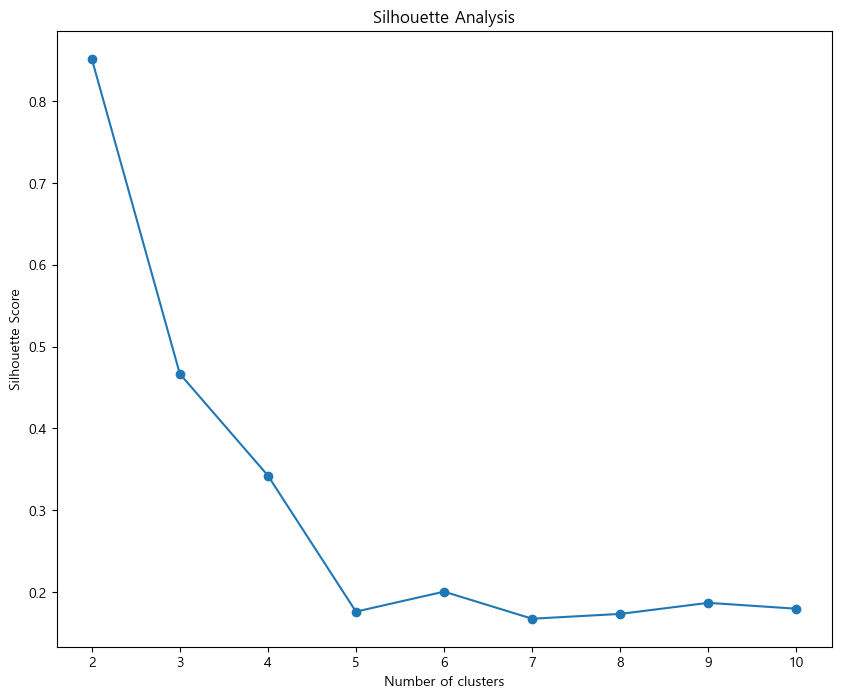

In [25]:
silhouette_analysis(robust_scaled)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

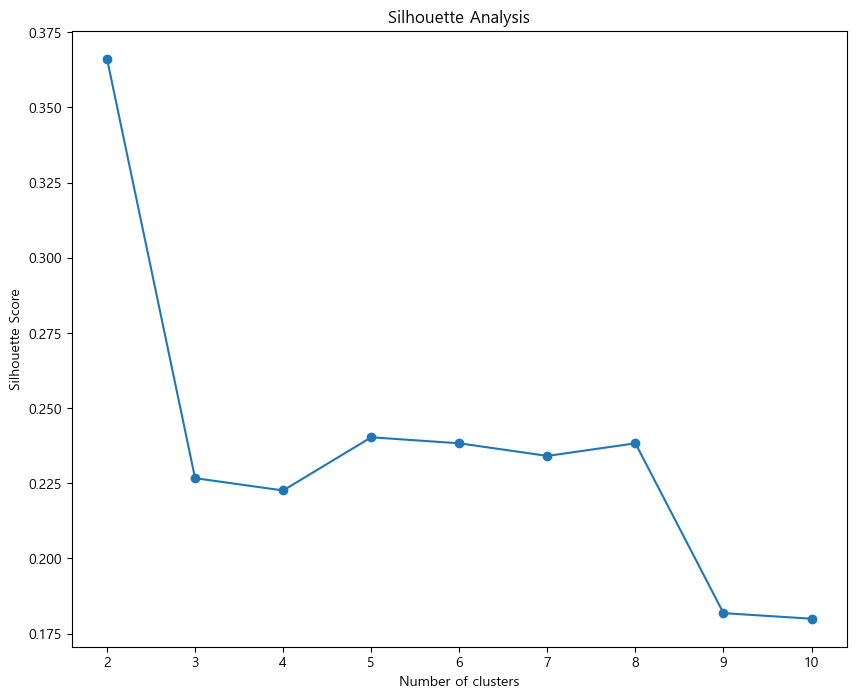

In [26]:
silhouette_analysis(minmax_scaled)

In [27]:
def evaluate_clustering(X_scaled, optimal_k=8):
    
    dunn_indices = []
    for k in range(2, optimal_k + 1):
        kmeans = KMeans(init='k-means++', n_clusters=k, random_state=42)
        kmeans.fit_predict(X_scaled)
        labels = kmeans.labels_
        dunn_index = get_Dunn_index(X_scaled, labels, intra_cluster_distance_type='avdd', inter_cluster_distance_type='avld')
        dunn_indices.append(dunn_index)

    plt.figure(figsize=(10, 8))
    plt.plot(range(2, optimal_k + 1), dunn_indices, marker='o')
    plt.title('Dunn Index Analysis')
    plt.xlabel('Number of clusters')
    plt.ylabel('Dunn Index')
    plt.show()

    print("Dunn Indices:", dunn_indices)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

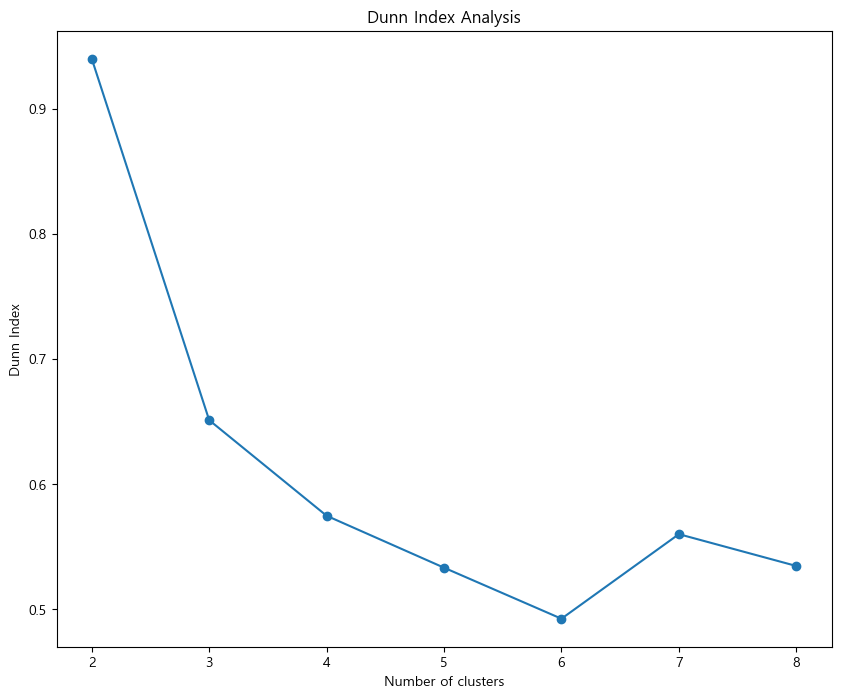

Dunn Indices: [0.9399808990632598, 0.65097675664869, 0.5745177966867976, 0.5329850810419975, 0.4921850639795383, 0.5598041918692882, 0.5343667477862037]


In [28]:
evaluate_clustering(standard_scaled, optimal_k=8)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

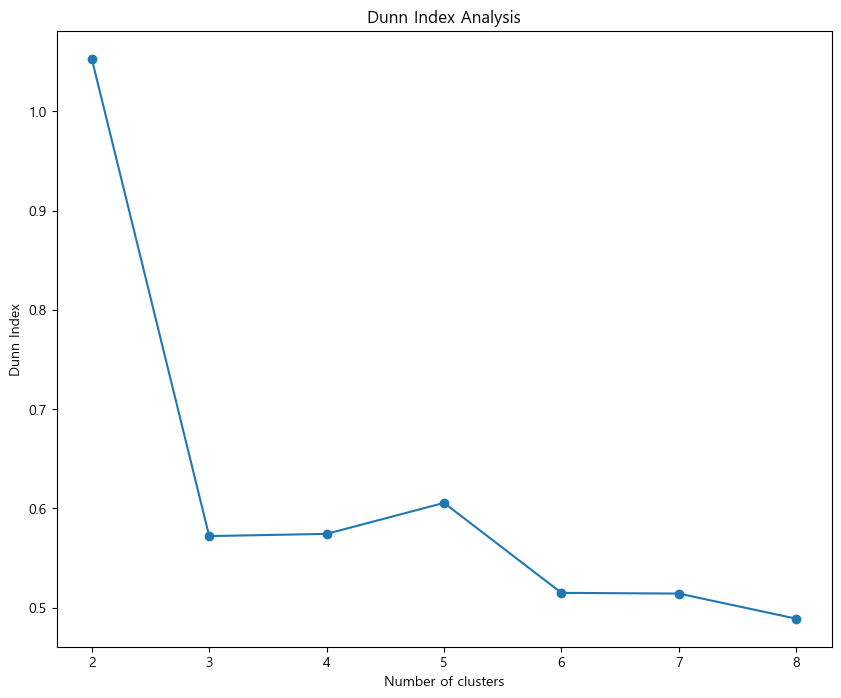

Dunn Indices: [1.0528887510578682, 0.572209224901083, 0.5744312369309992, 0.6056376556900703, 0.5150397746112596, 0.5143176554651689, 0.48900193472417924]


In [29]:
evaluate_clustering(robust_scaled, optimal_k=8)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environme

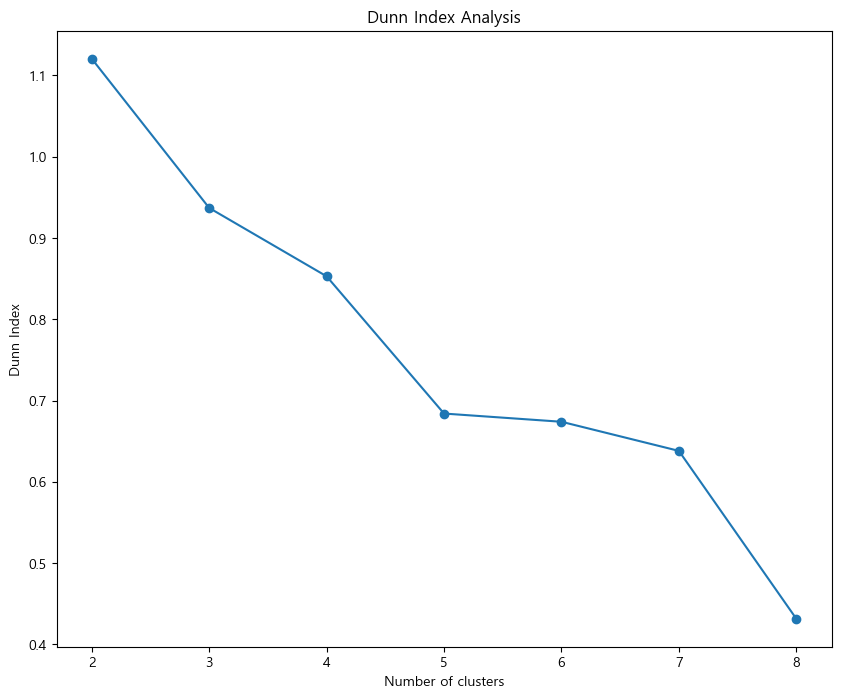

Dunn Indices: [1.1205869444274086, 0.9370149021626647, 0.8529086101624349, 0.6840543108257368, 0.6739539975258632, 0.6381201864359416, 0.43163543604306254]


In [30]:
evaluate_clustering(minmax_scaled, optimal_k=8)

#### standard scaler

In [31]:
optimal_k = 4

In [32]:
kmeans = KMeans(init='k-means++',n_clusters=optimal_k, random_state=42)
kmeans.fit_predict(standard_scaled)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


array([0, 1, 0, 1, 0, 3, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 2, 2, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 1, 0, 1, 0, 2, 0, 0, 0,
       0, 0, 0, 2, 2, 0, 0, 1, 0, 0, 0, 0, 3, 0, 1, 0, 1, 0, 0, 3, 1, 1,
       3, 0, 0, 1, 0, 1, 0, 1, 3, 0, 3, 0, 3, 1, 0, 0, 0, 3, 1, 3, 1, 3,
       0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 2, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 0, 2, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 2, 3, 0, 1, 1, 1, 0, 3, 0, 1, 0, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 0, 0, 0, 3, 1, 1, 0, 0, 3, 3,
       0, 0, 3, 1, 0, 2, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 3, 1, 0, 1, 1,
       1, 3, 1, 0, 0, 0, 1, 0, 0])

In [33]:
assignments_X_train_standard_scaled = kmeans.labels_
print(assignments_X_train_standard_scaled)

[0 1 0 1 0 3 1 1 0 1 1 1 0 0 1 1 1 1 1 2 2 0 0 0 0 0 0 0 0 2 2 0 0 0 2 0 1
 0 1 0 2 0 0 0 0 0 0 2 2 0 0 1 0 0 0 0 3 0 1 0 1 0 0 3 1 1 3 0 0 1 0 1 0 1
 3 0 3 0 3 1 0 0 0 3 1 3 1 3 0 0 0 0 3 0 0 0 0 0 0 0 0 2 2 0 0 0 2 0 0 0 0
 0 0 2 0 0 0 0 0 0 0 0 3 2 2 2 0 0 0 0 0 0 0 0 0 2 2 2 2 2 0 2 2 2 2 0 2 2
 0 2 2 0 2 0 0 1 0 0 0 0 0 0 2 3 0 1 1 1 0 3 0 1 0 0 1 0 1 0 1 1 1 1 1 1 1
 1 3 1 0 0 0 3 1 1 0 0 3 3 0 0 3 1 0 2 0 1 0 0 0 1 0 1 0 1 0 3 1 0 1 1 1 3
 1 0 0 0 1 0 0]


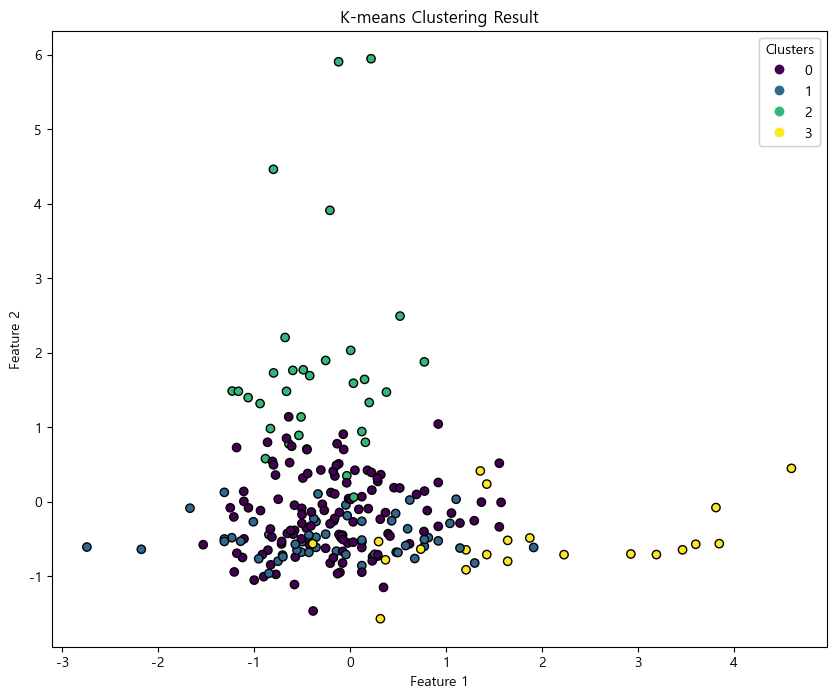

In [34]:
#그냥 한번 찍어보는
plt.figure(figsize=(10, 8))
scatter = plt.scatter(standard_scaled[:, 0], standard_scaled[:, 1], c=assignments_X_train_standard_scaled, cmap='viridis', marker='o', edgecolor='k')
plt.title('K-means Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
# 레전드 추가
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.show()

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


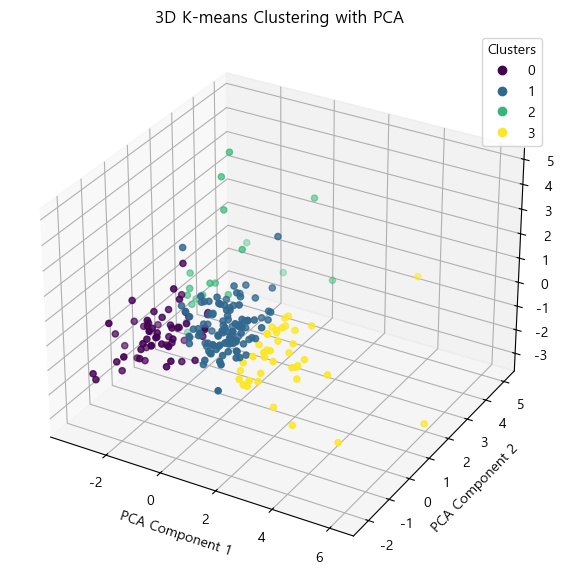

In [35]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
# PCA로 차원 축소 (3차원)
pca = PCA(n_components=3)
df_pca = pca.fit_transform(standard_scaled)

# K-means 클러스터링
kmeans = KMeans(n_clusters=4, random_state=0).fit(df_pca)
labels = kmeans.labels_

# 3D 클러스터링 결과 시각화
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca[:, 0], df_pca[:, 1], df_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D K-means Clustering with PCA')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

#### Robust Scaler

In [36]:
optimal_k = 4

In [37]:
kmeans = KMeans(init='k-means++',n_clusters=optimal_k, random_state=42)
kmeans.fit_predict(robust_scaled)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


array([0, 3, 0, 3, 3, 3, 3, 3, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2,
       2, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 3, 3, 0, 2, 2,
       0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 3, 0, 2, 0, 3, 0, 0, 3, 0,
       0, 0, 0, 2, 0, 0, 3, 0, 3, 0, 3, 2, 0, 0, 2, 2, 0, 3, 0, 0, 2, 2,
       0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 0, 2, 0, 0, 3, 0,
       0, 2, 0, 0, 0, 0, 1, 0, 0])

In [38]:
assignments_X_train_robust_scaled = kmeans.labels_
print(assignments_X_train_robust_scaled)

[0 3 0 3 3 3 3 3 0 2 2 2 0 0 2 0 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 2 2 0 0 0 0 2 0 2
 0 0 0 0 2 2 0 0 0 3 3 0 2 2 0 0 0 2 2 2 2 0 0 0 0 0 2 0 2 0 0 0 0 2 0 0 0
 0 0 0 0 0 0 0 0 0 0 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 3 0 2 0 3 0 0 3 0 0 0 0 2 0 0 3 0 3
 0 3 2 0 0 2 2 0 3 0 0 2 2 0 0 2 2 0 0 0 2 0 0 0 0 0 0 0 3 0 2 0 0 3 0 0 2
 0 0 0 0 1 0 0]


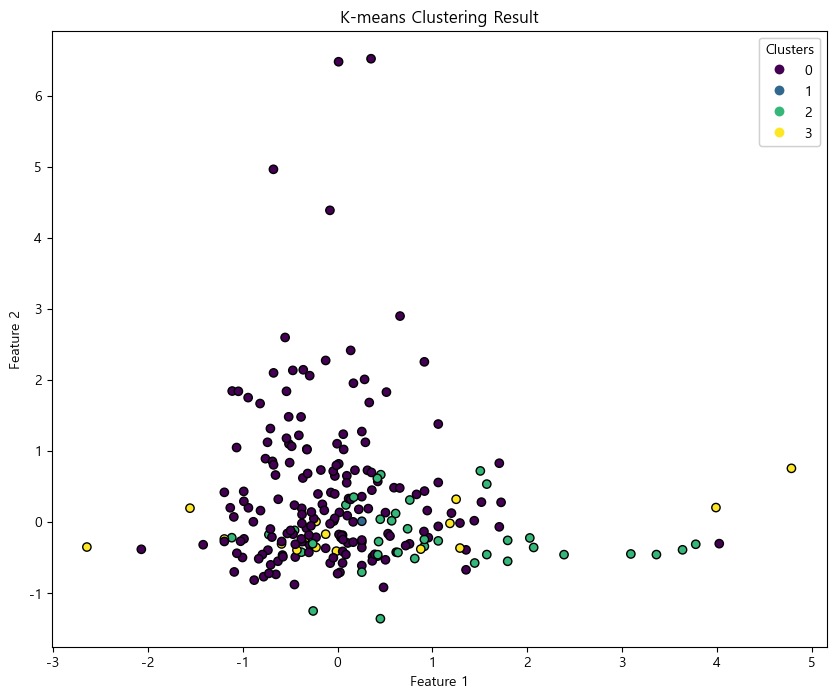

In [39]:
#그냥 한번 찍어보는
# 클러스터링 결과 시각화
plt.figure(figsize=(10, 8))
scatter = plt.scatter(robust_scaled[:, 0], robust_scaled[:, 1], c=assignments_X_train_robust_scaled, cmap='viridis', marker='o', edgecolor='k')


legend2 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend2)
plt.title('K-means Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


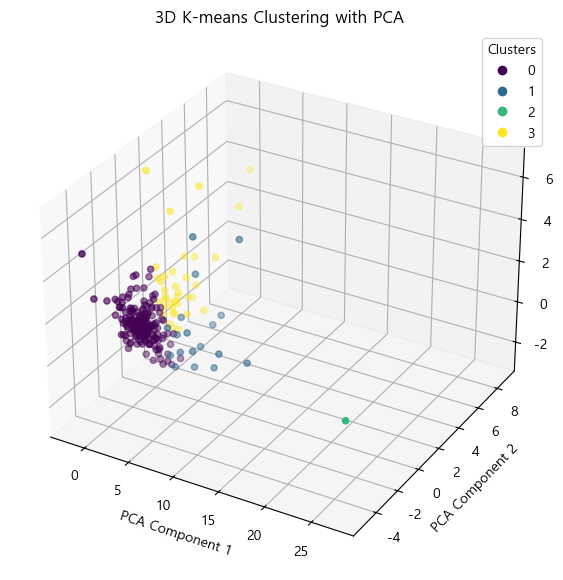

In [40]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
# PCA로 차원 축소 (3차원)
pca = PCA(n_components=3)
df_pca = pca.fit_transform(robust_scaled)

# K-means 클러스터링
kmeans = KMeans(n_clusters=4, random_state=0).fit(df_pca)
labels = kmeans.labels_

# 3D 클러스터링 결과 시각화
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca[:, 0], df_pca[:, 1], df_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D K-means Clustering with PCA')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

#### minmax scaler

In [41]:
optimal_k = 4

In [42]:
kmeans = KMeans(init='k-means++',n_clusters=optimal_k, random_state=42)
kmeans.fit_predict(minmax_scaled)

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


array([1, 3, 0, 1, 0, 2, 3, 3, 0, 3, 3, 3, 0, 1, 3, 3, 3, 3, 3, 0, 0, 0,
       1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 3, 1, 3, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 3, 0, 3, 1, 1, 3, 0, 3, 0, 3, 0, 1, 3, 1, 3,
       2, 0, 1, 3, 0, 3, 1, 3, 2, 1, 3, 1, 2, 3, 1, 1, 1, 2, 3, 2, 3, 2,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 3, 1, 0, 1, 1, 0, 0, 0, 2, 0, 3, 3, 3, 0, 2, 1, 3, 0, 1, 3, 0,
       3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 0, 1, 1, 2, 3, 3, 1, 1, 3, 2,
       0, 1, 2, 3, 1, 0, 1, 3, 1, 1, 1, 3, 0, 3, 0, 3, 0, 2, 3, 1, 3, 3,
       3, 3, 3, 1, 1, 1, 1, 0, 1])

In [43]:
assignments_X_train_minmax_scaled = kmeans.labels_
print(assignments_X_train_minmax_scaled)

[1 3 0 1 0 2 3 3 0 3 3 3 0 1 3 3 3 3 3 0 0 0 1 0 0 0 0 1 1 0 0 0 1 1 0 0 3
 1 3 0 0 0 0 1 0 0 1 0 0 0 1 3 0 3 1 1 3 0 3 0 3 0 1 3 1 3 2 0 1 3 0 3 1 3
 2 1 3 1 2 3 1 1 1 2 3 2 3 2 1 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 1 0 1 0
 0 1 0 0 0 0 0 1 0 0 1 1 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0
 1 0 0 0 0 0 0 3 1 0 1 1 0 0 0 2 0 3 3 3 0 2 1 3 0 1 3 0 3 0 3 3 3 3 3 3 3
 3 1 3 0 1 1 2 3 3 1 1 3 2 0 1 2 3 1 0 1 3 1 1 1 3 0 3 0 3 0 2 3 1 3 3 3 3
 3 1 1 1 1 0 1]


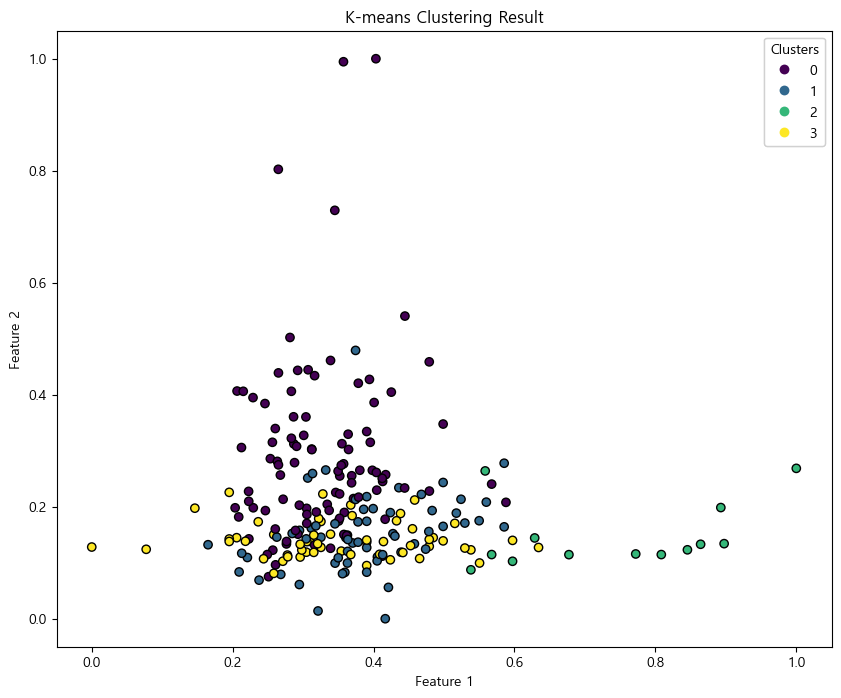

In [44]:
#그냥 한번 찍어보는
# 클러스터링 결과 시각화
plt.figure(figsize=(10, 8))
scatter = plt.scatter(minmax_scaled[:, 0], minmax_scaled[:, 1], c=assignments_X_train_minmax_scaled, cmap='viridis', marker='o', edgecolor='k')


legend3 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend3)
plt.title('K-means Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gkswl\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


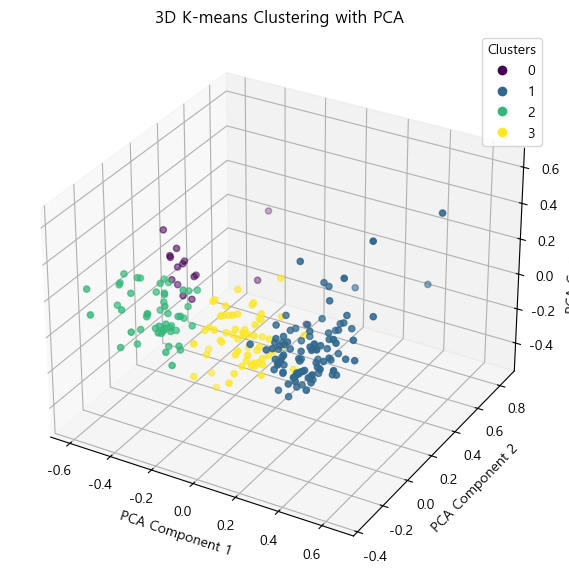

In [45]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
# PCA로 차원 축소 (3차원)
pca = PCA(n_components=3)
df_pca = pca.fit_transform(minmax_scaled)

# K-means 클러스터링
kmeans = KMeans(n_clusters=4, random_state=0).fit(df_pca)
labels = kmeans.labels_

# 3D 클러스터링 결과 시각화
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca[:, 0], df_pca[:, 1], df_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D K-means Clustering with PCA')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

### 3.2 k-Medoids

In [46]:
# 실루엣 함수
def silhouette_analysis(X, max_k=10):
    silhouette_scores = []
    for k in range(2, max_k + 1):
        kmedoids = KMedoids(init='k-medoids++', n_clusters=k, random_state=42)
        kmedoids.fit(X)
        score = silhouette_score(X, kmedoids.labels_)
        silhouette_scores.append(score)
    plt.figure(figsize=(10, 8))
    plt.plot(range(2, max_k + 1), silhouette_scores, marker='o')
    plt.title('Silhouette Analysis with K-Medoids')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Score')
    plt.show()

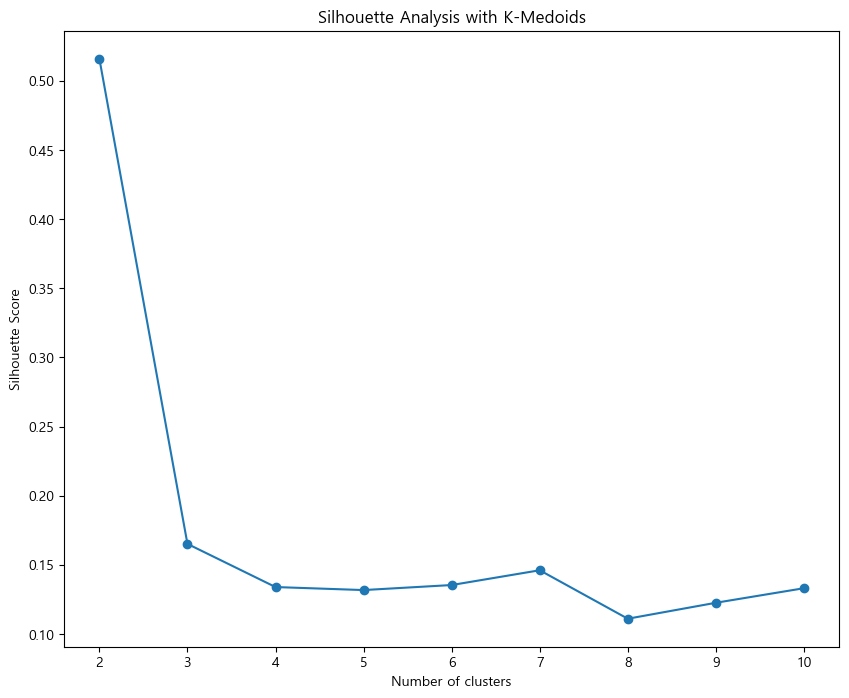

In [47]:
silhouette_analysis(standard_scaled)

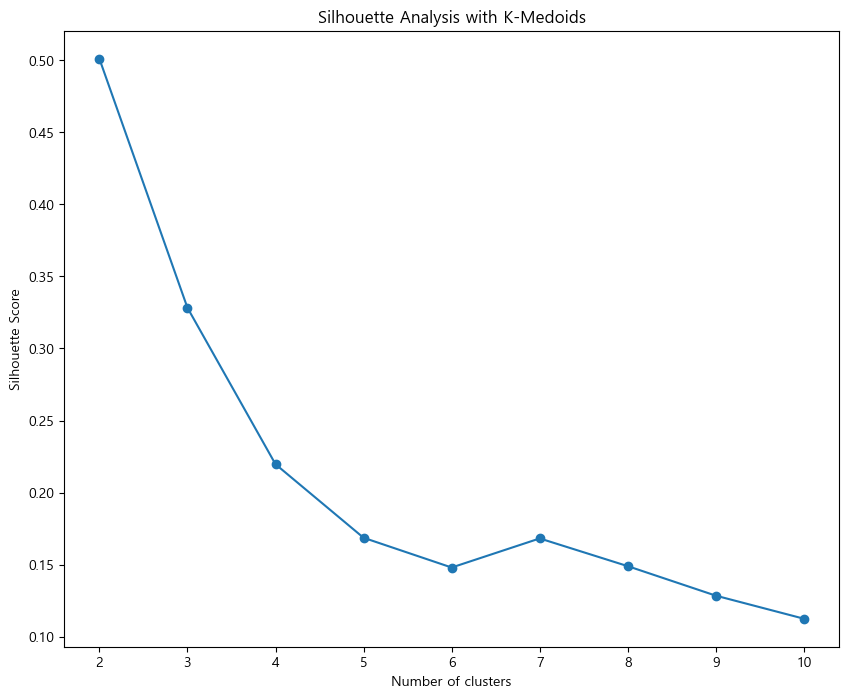

In [48]:
silhouette_analysis(robust_scaled)

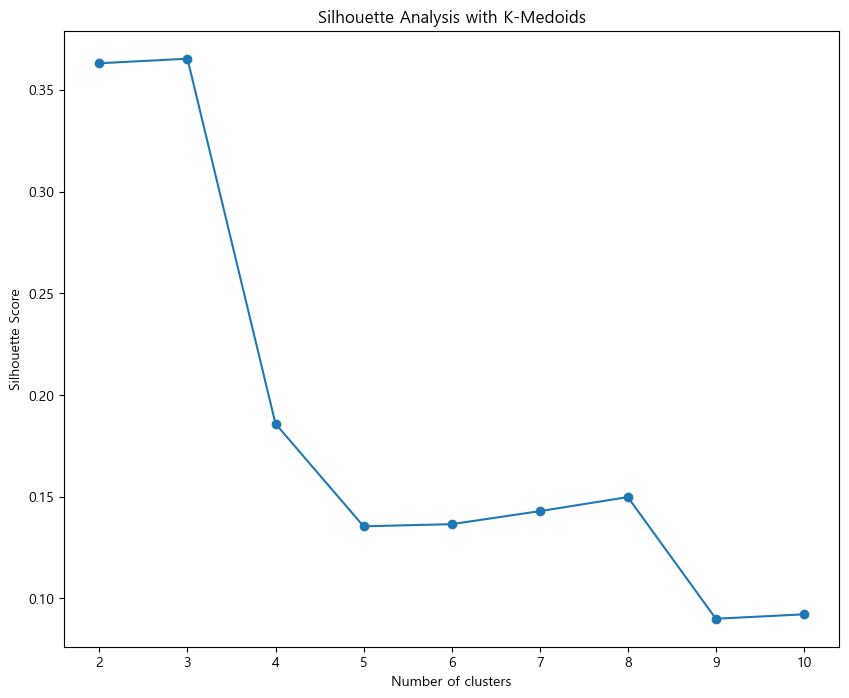

In [49]:
silhouette_analysis(minmax_scaled)

In [50]:
def evaluate_clustering(X_scaled, optimal_k):
    

    dunn_indices = []
    for k in range(2, optimal_k + 1):
        kmedoids = KMedoids(n_clusters=k, random_state=42)
        kmedoids.fit(X_scaled)
        labels = kmedoids.labels_
        dunn_index = get_Dunn_index(X_scaled, labels, intra_cluster_distance_type='avdd', inter_cluster_distance_type='avld')
        dunn_indices.append(dunn_index)

    plt.figure(figsize=(10, 8))
    plt.plot(range(2, optimal_k + 1), dunn_indices, marker='o')
    plt.title('Dunn Index Analysis')
    plt.xlabel('Number of clusters')
    plt.ylabel('Dunn Index')
    plt.show()

    
    print("Dunn Indices:", dunn_indices)

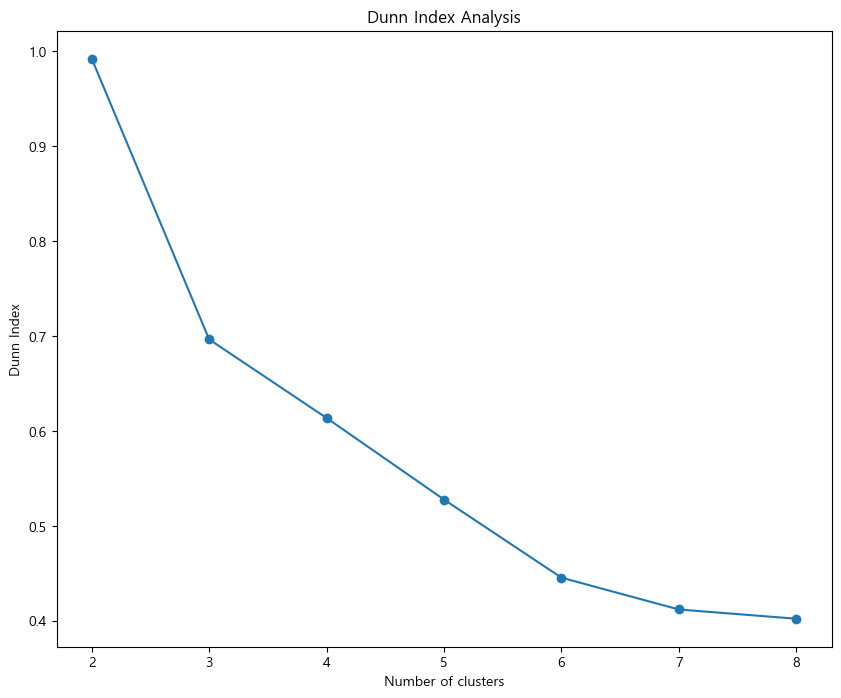

Dunn Indices: [0.991988679212431, 0.6964080480620981, 0.6136333512551286, 0.5277522998057861, 0.4455104595745864, 0.41199957813611554, 0.40228036110663307]


In [51]:
evaluate_clustering(standard_scaled, optimal_k=8)

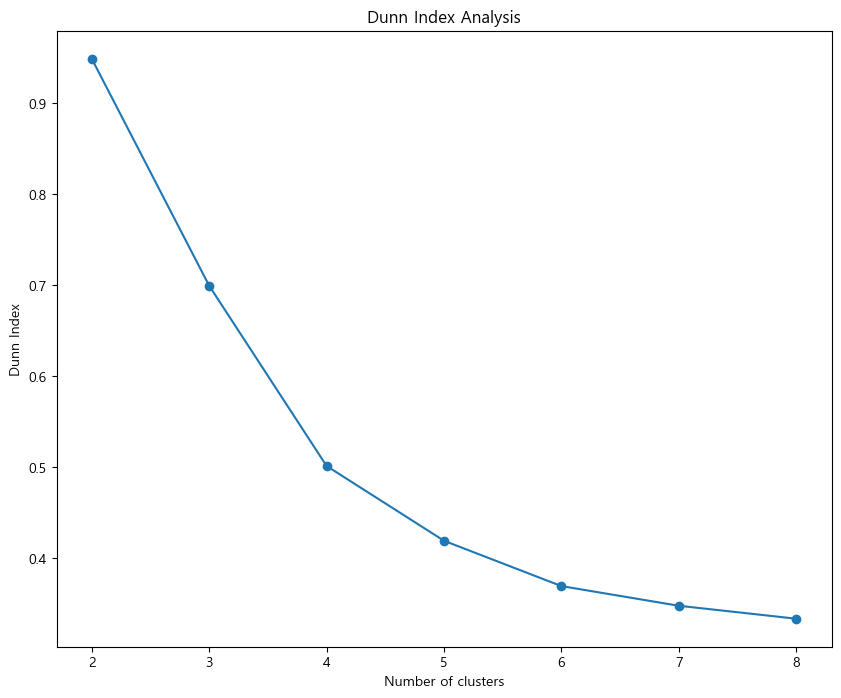

Dunn Indices: [0.948963899453481, 0.6993560954801575, 0.5012170524612304, 0.4189624398622625, 0.36912771150099116, 0.3475195106179307, 0.33327398624722343]


In [52]:
evaluate_clustering(robust_scaled, optimal_k=8)

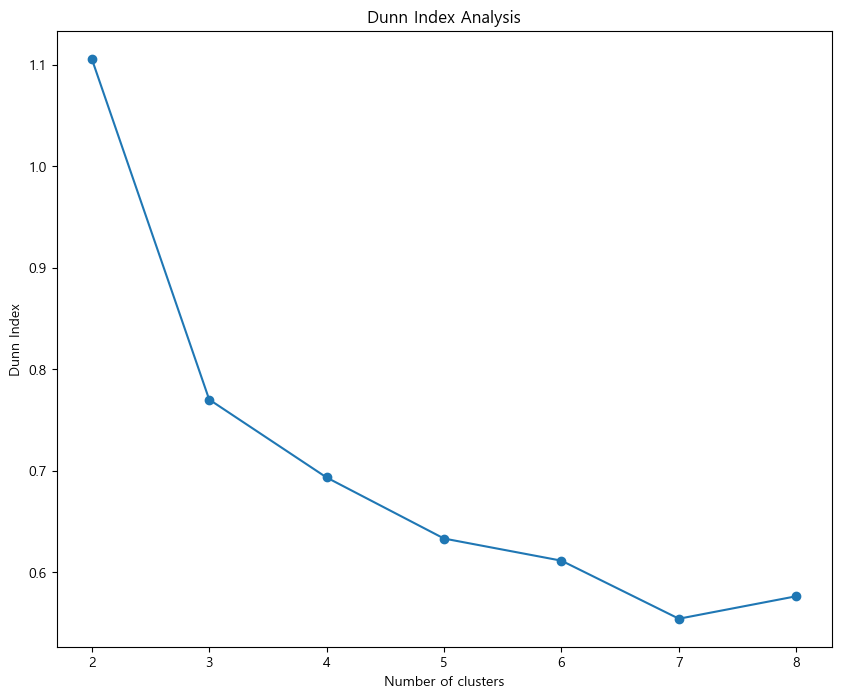

Dunn Indices: [1.1058123798718207, 0.7699690277581465, 0.6931383617028792, 0.6329767069394326, 0.6111673455901389, 0.5539691581977962, 0.5761229766831076]


In [53]:
evaluate_clustering(minmax_scaled, optimal_k=8)

standard_scaler

In [54]:
optimal_k = 4

In [55]:
kmedoids = KMedoids(n_clusters=optimal_k, random_state=42)
assignments_X_train_scaled = kmedoids.fit_predict(standard_scaled)

In [56]:
print(assignments_X_train_scaled)

[0 3 2 3 2 3 3 1 2 3 3 3 0 2 3 3 3 3 3 0 0 0 1 0 0 0 0 1 2 0 0 2 2 2 0 2 1
 1 3 0 0 0 0 1 1 0 3 0 0 1 1 3 0 3 1 1 3 0 3 0 3 0 1 3 1 1 3 2 1 3 0 3 1 3
 3 1 3 1 3 3 1 2 1 3 1 3 3 3 2 0 0 0 0 0 0 2 0 0 2 2 2 0 0 2 2 0 0 1 0 0 0
 0 2 0 2 2 2 2 2 2 0 2 2 0 0 0 2 0 2 2 2 2 0 2 2 0 0 0 0 0 0 0 0 0 0 1 0 2
 2 0 0 0 0 0 0 3 2 2 1 2 2 0 0 3 0 3 3 3 0 3 1 3 2 1 3 0 3 2 3 3 3 3 3 3 3
 3 2 3 2 3 1 3 3 3 1 2 3 3 0 2 3 3 1 0 1 3 2 1 1 3 1 3 1 3 0 3 3 1 3 3 3 1
 3 2 2 1 3 0 2]


In [57]:
#cluster center
print(scaler.inverse_transform(kmedoids.cluster_centers_))

[[4.95000000e-01 3.84080000e+01 7.26796646e-01 4.96000000e-02
  1.40000000e-03 3.30000000e-03 1.00000000e-03 7.38000000e-01]
 [4.91900000e-01 3.58483000e+01 5.07966478e-01 3.72000000e-02
  1.60000000e-03 2.70000000e-03 9.00000000e-04 7.28000000e-01]
 [4.63000000e-01 3.35292000e+01 5.63537344e-01 4.05000000e-02
  1.00000000e-03 4.30000000e-03 1.30000000e-03 1.56550000e+00]
 [5.09400000e-01 3.10339000e+01 1.09748371e-01 2.46000000e-02
  1.40000000e-03 4.20000000e-03 9.00000000e-04 6.94240000e+00]]


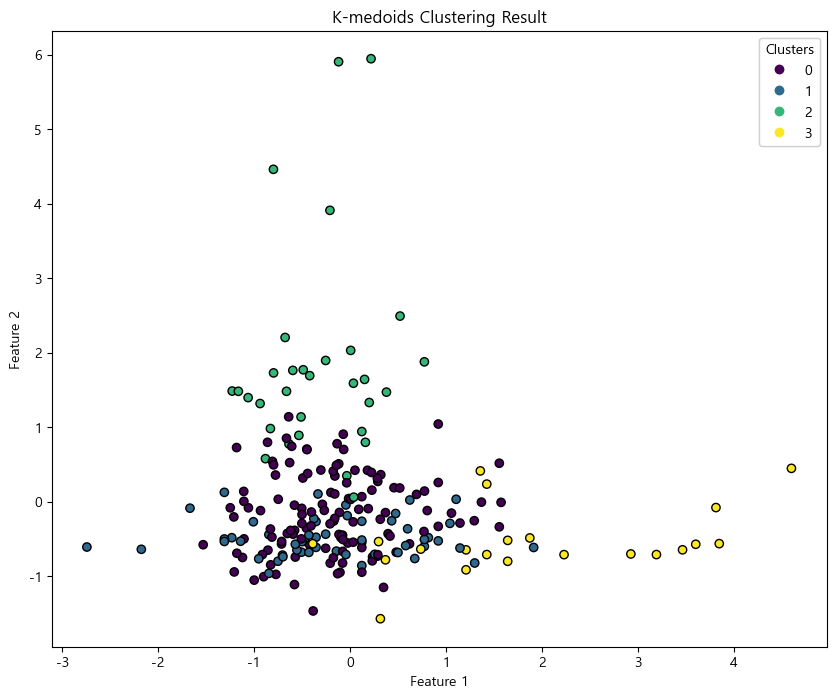

In [58]:
#그냥 한번 찍어보는
plt.figure(figsize=(10, 8))
scatter = plt.scatter(standard_scaled[:, 0], standard_scaled[:, 1], c=assignments_X_train_standard_scaled, cmap='viridis', marker='o', edgecolor='k')
plt.title('K-medoids Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
# 레전드 추가
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.show()

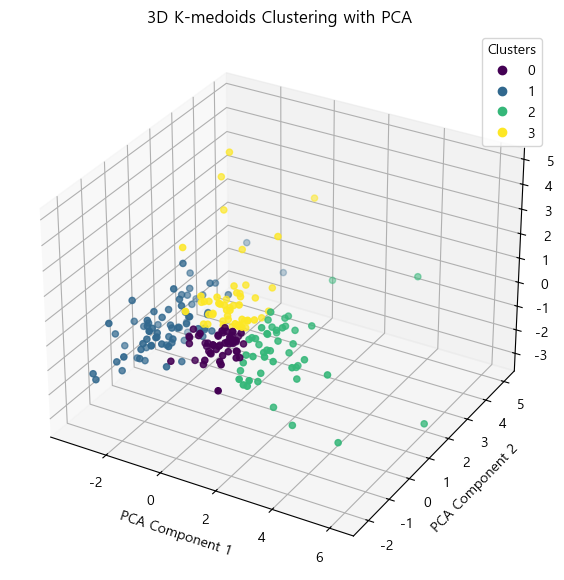

In [59]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
# PCA로 차원 축소 (3차원)
pca = PCA(n_components=3)
df_pca = pca.fit_transform(standard_scaled)

# K-medoids 클러스터링
kmedoids = KMedoids(n_clusters=4, random_state=0).fit(df_pca)
labels = kmedoids.labels_

# 3D 클러스터링 결과 시각화
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca[:, 0], df_pca[:, 1], df_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D K-medoids Clustering with PCA')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

Robust_scaled

In [60]:
optimal_k = 4

In [61]:
kmedoids = KMedoids(n_clusters=optimal_k, random_state=42)
assignments_X_train_scaled = kmedoids.fit_predict(robust_scaled)

In [62]:
print(assignments_X_train_scaled)

[2 2 0 2 2 2 2 2 0 2 2 2 1 2 2 2 2 2 2 3 3 3 1 3 0 0 0 2 0 3 3 0 0 0 3 0 1
 1 2 0 3 1 0 1 1 0 2 3 3 1 1 2 0 2 1 1 1 0 1 0 2 0 1 1 1 2 2 0 1 1 0 1 1 2
 2 1 2 0 2 2 1 0 1 2 2 1 1 2 0 0 0 0 0 0 0 0 0 0 2 0 0 3 3 0 2 0 3 0 1 3 0
 0 0 3 3 0 0 0 0 3 3 0 0 3 3 3 0 3 0 3 0 0 3 0 3 3 3 3 3 3 3 3 3 3 3 1 3 3
 0 3 3 1 3 1 0 2 0 0 2 0 0 0 3 2 0 2 2 2 1 2 1 2 0 1 2 0 2 0 2 2 2 2 2 1 2
 2 2 2 0 2 1 2 2 2 1 0 1 2 0 0 2 2 1 1 2 2 2 1 2 2 1 1 1 2 0 2 2 1 2 2 2 1
 2 0 0 1 2 0 0]


In [63]:
#cluster center
print(scaler.inverse_transform(kmedoids.cluster_centers_))

[[4.72093617e-01 3.65488218e+01 5.72171675e-01 4.17000469e-02
  2.54672957e-03 4.03097536e-03 1.08427948e-03 3.75271287e+00]
 [5.01018998e-01 3.77079440e+01 4.70488497e-01 3.86268185e-02
  2.68625155e-03 3.02494884e-03 8.64579949e-04 2.60245556e+00]
 [5.18718096e-01 3.26591086e+01 2.43235716e-01 2.68926740e-02
  2.40720758e-03 4.70165971e-03 8.64579949e-04 1.78762996e+01]
 [4.62890086e-01 4.36021321e+01 5.41359665e-01 5.78112137e-02
  8.72465711e-04 3.24851029e-03 1.52367853e-03 8.23085136e+00]]


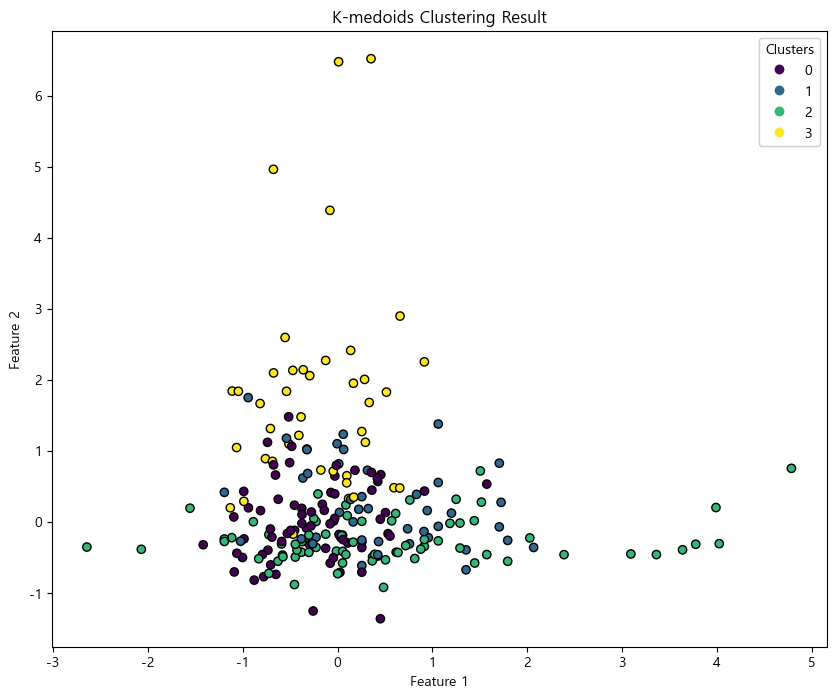

In [64]:
#그냥 한번 찍어보는
plt.figure(figsize=(10, 8))
scatter = plt.scatter(robust_scaled[:, 0], robust_scaled[:, 1], c=assignments_X_train_scaled, cmap='viridis', marker='o', edgecolor='k')
plt.title('K-medoids Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
# 레전드 추가
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.show()

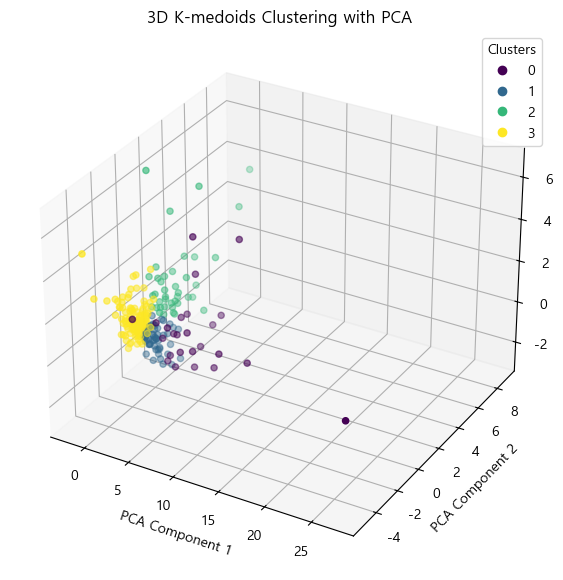

In [65]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
# PCA로 차원 축소 (3차원)
pca = PCA(n_components=3)
df_pca = pca.fit_transform(robust_scaled)

# K-medoids 클러스터링
kmedoids = KMedoids(n_clusters=4, random_state=0).fit(df_pca)
labels = kmedoids.labels_

# 3D 클러스터링 결과 시각화
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca[:, 0], df_pca[:, 1], df_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D K-medoids Clustering with PCA')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

Minmax_scaled

In [66]:
optimal_k = 4

In [67]:
kmedoids = KMedoids(n_clusters=optimal_k, random_state=42)
assignments_X_train_scaled = kmedoids.fit_predict(minmax_scaled)

In [68]:
print(assignments_X_train_scaled)

[0 2 3 1 0 2 2 2 3 2 2 2 3 1 2 2 2 2 2 0 0 0 1 0 0 0 0 1 0 0 0 0 1 3 0 0 2
 2 2 3 3 3 0 1 3 3 2 0 3 3 2 2 3 2 1 1 2 0 2 0 2 3 1 2 1 2 2 3 1 2 3 2 1 2
 2 2 2 1 2 2 1 1 1 2 2 2 2 2 3 3 3 0 0 3 0 2 0 0 0 0 2 0 0 3 3 0 3 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 2 0 0 0 2 0 1 1 0 0 0 0 0 1 0 1 3 0 0 0 0 0 1 1 1 0
 0 3 0 3 3 3 3 2 0 3 1 1 0 0 3 2 0 2 2 2 3 2 1 2 3 1 2 3 2 3 2 2 2 2 2 2 2
 2 1 2 3 2 2 2 2 2 1 3 2 2 0 1 2 2 1 3 1 2 2 1 1 2 1 2 3 2 3 2 2 1 2 2 2 2
 2 1 3 3 1 3 3]


In [69]:
#cluster center
print(scaler.inverse_transform(kmedoids.cluster_centers_))

[[5.14926764e-01 3.69076523e+01 6.65124579e-01 4.68595982e-02
  2.52136193e-03 3.98103078e-03 1.27725879e-03 6.12293261e+00]
 [5.17541149e-01 3.70354934e+01 6.22534883e-01 4.58145405e-02
  2.46096280e-03 4.01670548e-03 1.21788054e-03 6.10425969e+00]
 [5.18644092e-01 3.65370355e+01 5.58374735e-01 4.51744426e-02
  2.49720228e-03 4.23075368e-03 1.20303598e-03 6.30734250e+00]
 [5.15961625e-01 3.70995869e+01 6.66765313e-01 4.58537301e-02
  2.32808472e-03 4.14751271e-03 1.23272510e-03 6.08389619e+00]]


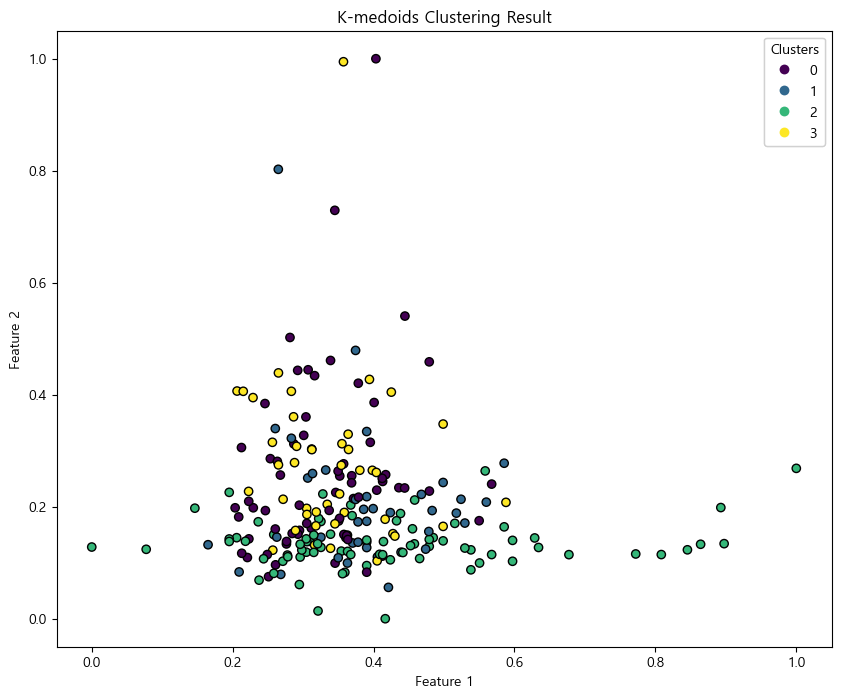

In [70]:
#그냥 한번 찍어보는
plt.figure(figsize=(10, 8))
scatter = plt.scatter(minmax_scaled[:, 0], minmax_scaled[:, 1], c=assignments_X_train_scaled, cmap='viridis', marker='o', edgecolor='k')
plt.title('K-medoids Clustering Result')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
# 레전드 추가
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
plt.show()

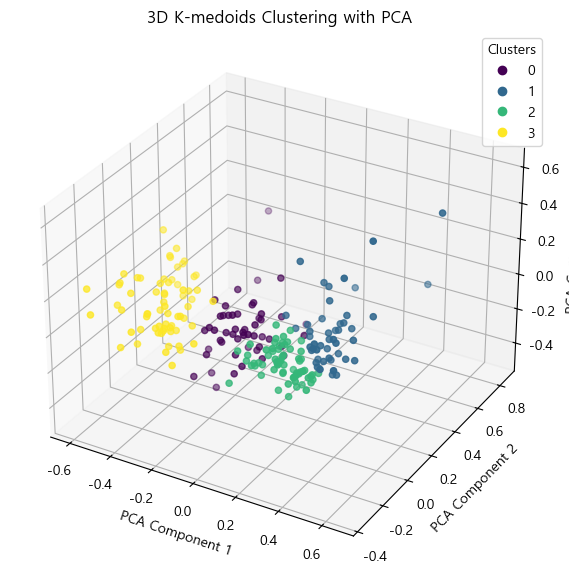

In [71]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
# PCA로 차원 축소 (3차원)
pca = PCA(n_components=3)
df_pca = pca.fit_transform(minmax_scaled)

# K-medoids 클러스터링
kmedoids = KMedoids(n_clusters=4, random_state=0).fit(df_pca)
labels = kmedoids.labels_

# 3D 클러스터링 결과 시각화
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_pca[:, 0], df_pca[:, 1], df_pca[:, 2], c=labels, cmap='viridis')

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D K-medoids Clustering with PCA')
plt.legend(*scatter.legend_elements(), title="Clusters")
plt.show()

### 3.3 DBSCAN

In [72]:
#dbscan은 던 인덱스를 넣어야 될지 모르겠네요

In [73]:

eps_values = np.linspace(0.1, 1.0, 20)
min_samples_values = range(2, 10)
def evaluate_clustering_dbscan(X_scaled, eps_values, min_samples_values):
    dunn_indices = []
    eps_min_samples_combinations = []

    for eps in eps_values:
        for min_samples in min_samples_values:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            dbscan.fit(X_scaled)
            labels = dbscan.labels_
            if len(np.unique(labels)) > 1:  # Ensure more than one cluster is formed
                dunn_index = get_Dunn_index(X_scaled, labels, intra_cluster_distance_type='avdd', inter_cluster_distance_type='avld')
                dunn_indices.append(dunn_index)
                eps_min_samples_combinations.append((eps, min_samples))

    # Plotting the Dunn Index values
    plt.figure(figsize=(10, 8))
    plt.plot(range(2, len(dunn_indices) + 2), dunn_indices, marker='o')
    plt.title('Dunn Index Analysis')
    plt.xlabel('Combination Index')
    plt.ylabel('Dunn Index')
    plt.show()
    
    # Display the Dunn Index values
    print("Dunn Indices:", dunn_indices)
    print("Eps and Min Samples Combinations:", eps_min_samples_combinations)

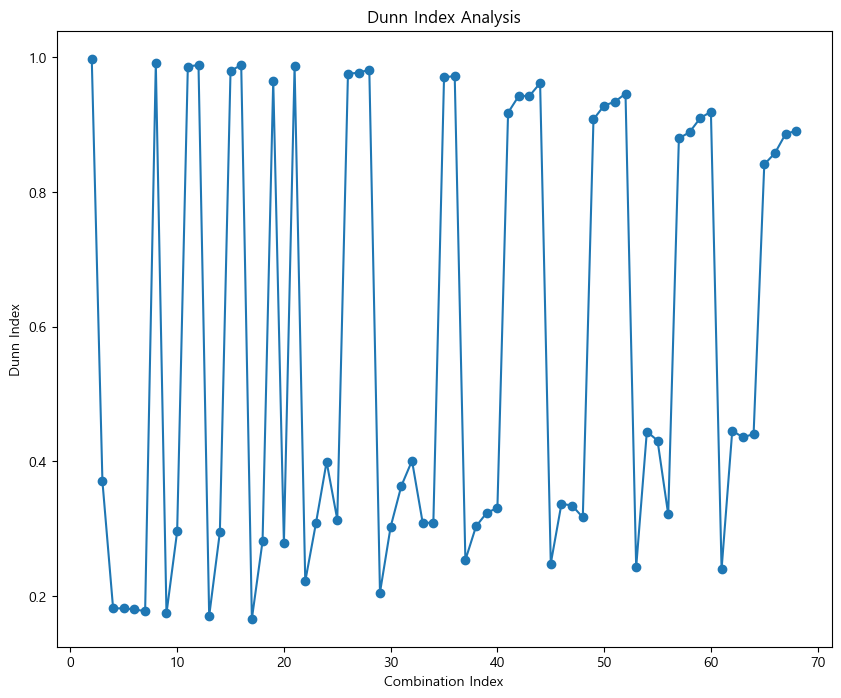

Dunn Indices: [0.9977931688628193, 0.3700498329308945, 0.18151998266654956, 0.18151998266654956, 0.17990554701681236, 0.17732476582980083, 0.990871988027942, 0.17400512505678842, 0.2956740816152683, 0.9860586306572672, 0.988536915775861, 0.17020014616446705, 0.294359444642641, 0.9796014244414802, 0.988536915775861, 0.16610999982955627, 0.2811444006557426, 0.9653829832366227, 0.27871199622115783, 0.9863039740373255, 0.22168248660642262, 0.30778816940405945, 0.39912481893528473, 0.3134465472755496, 0.975414077593473, 0.9770467288419745, 0.981482929413489, 0.20498376399424434, 0.30264301295741836, 0.36325739685659636, 0.40075485230093105, 0.30863100546683647, 0.30863100546683647, 0.9699672154200925, 0.9722422268121431, 0.2532924454466992, 0.30337601921522606, 0.32335830981269215, 0.33071341089428136, 0.9176524863018073, 0.9425482783508516, 0.9425482783508516, 0.9614384552404633, 0.2480570832679994, 0.3367874519157623, 0.33419818525477485, 0.31657633817795017, 0.9078661219197653, 0.9282237

In [74]:
evaluate_clustering_dbscan(standard_scaled, eps_values, min_samples_values)

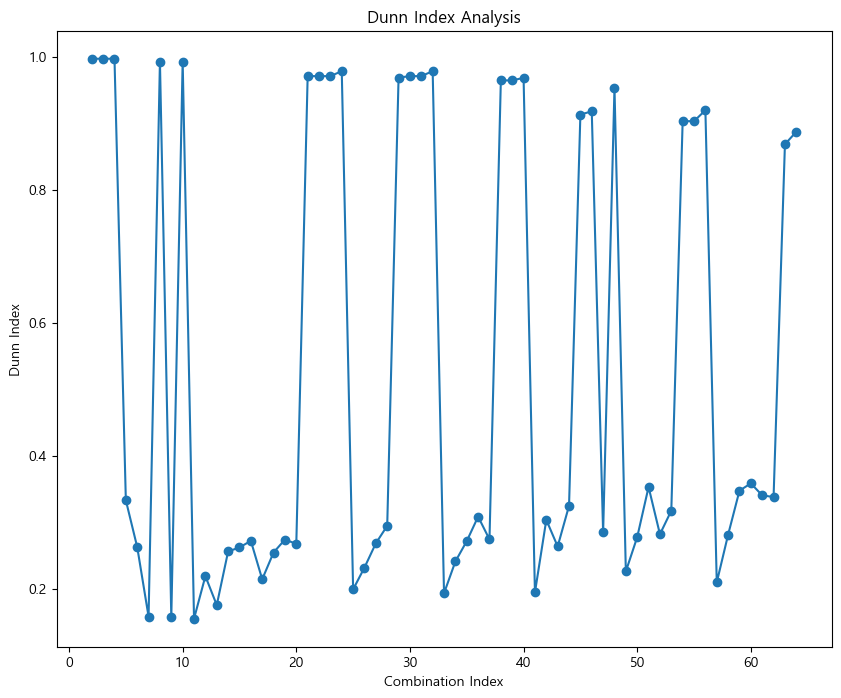

Dunn Indices: [0.9969813310840796, 0.9969813310840796, 0.9969813310840796, 0.3330929978578613, 0.26282299783224633, 0.15820777067393985, 0.9927922526748405, 0.15742572319860185, 0.9927922526748405, 0.1550322967159125, 0.2190303910206653, 0.17554725102446508, 0.25612905234408095, 0.26221332697418687, 0.2720903686117612, 0.21435110698585572, 0.2545950820294547, 0.2740539060297259, 0.2675875730809981, 0.9708169175574992, 0.9708169175574992, 0.9708169175574992, 0.9783065811084015, 0.19912183867511576, 0.23196597616921552, 0.2684066762103166, 0.29470987649188446, 0.9685686437695922, 0.9708169175574992, 0.9708169175574992, 0.9783065811084015, 0.19328424208989825, 0.24111395908188815, 0.2717113814965584, 0.308512739458648, 0.2742736084723001, 0.9643671796458045, 0.9643671796458045, 0.9682520258909035, 0.19452002278520736, 0.30366922957004344, 0.2637049796089575, 0.324752169309449, 0.9130898750083453, 0.9178237252481406, 0.28468080891810776, 0.9529181769462262, 0.22610588375585614, 0.277714820

In [75]:
evaluate_clustering_dbscan(robust_scaled, eps_values, min_samples_values)

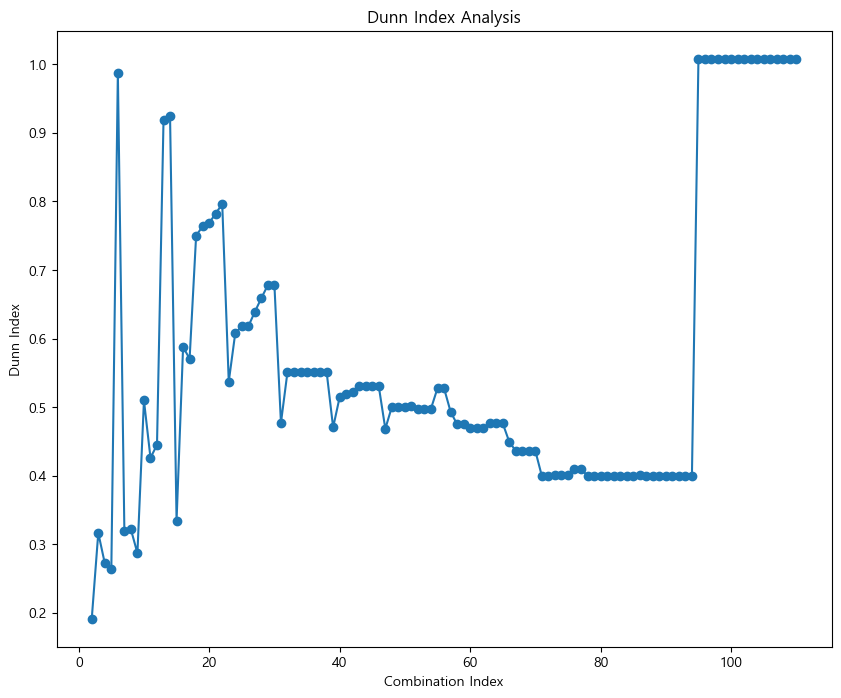

Dunn Indices: [0.19138820489259334, 0.3165362056976474, 0.27217507195248986, 0.2634297570254348, 0.9875940029603741, 0.3196317861031597, 0.32170270615846996, 0.28703860796263714, 0.5097987797713803, 0.4261271530620475, 0.44476015091543114, 0.9183627691039382, 0.9249356525483532, 0.33450490095650487, 0.5877439256686411, 0.5705800180244873, 0.7501936860028088, 0.7637423150182329, 0.768722922967645, 0.7823026137751546, 0.7963988764290365, 0.5370428777743709, 0.6081897557267076, 0.6178150774970022, 0.6178150774970022, 0.6389318399429548, 0.6591064056758016, 0.6780335951252189, 0.6780335951252189, 0.4769281928889839, 0.5510896391764676, 0.5507987800571233, 0.5507987800571233, 0.5507987800571233, 0.5515753566627528, 0.5515753566627528, 0.5515753566627528, 0.4704376878736602, 0.5144978875318398, 0.5197956567780161, 0.5215960925097457, 0.5301789504299228, 0.5301789504299228, 0.5301789504299228, 0.5301789504299228, 0.4684368893223608, 0.5002704896348003, 0.5002704896348003, 0.5002704896348003, 

In [76]:
evaluate_clustering_dbscan(minmax_scaled, eps_values, min_samples_values)

Performing grid search for Standard Scaled Data...


Font 'default' does not have a glyph for '\u2212' [U+2212], substituting with a dummy symbol.


Best params for Standard Scaled Data: eps=1.0, min_samples=6
Best silhouette score for Standard Scaled Data: 0.031014209600922417


Font 'default' does not have a glyph for '\u2212' [U+2212], substituting with a dummy symbol.


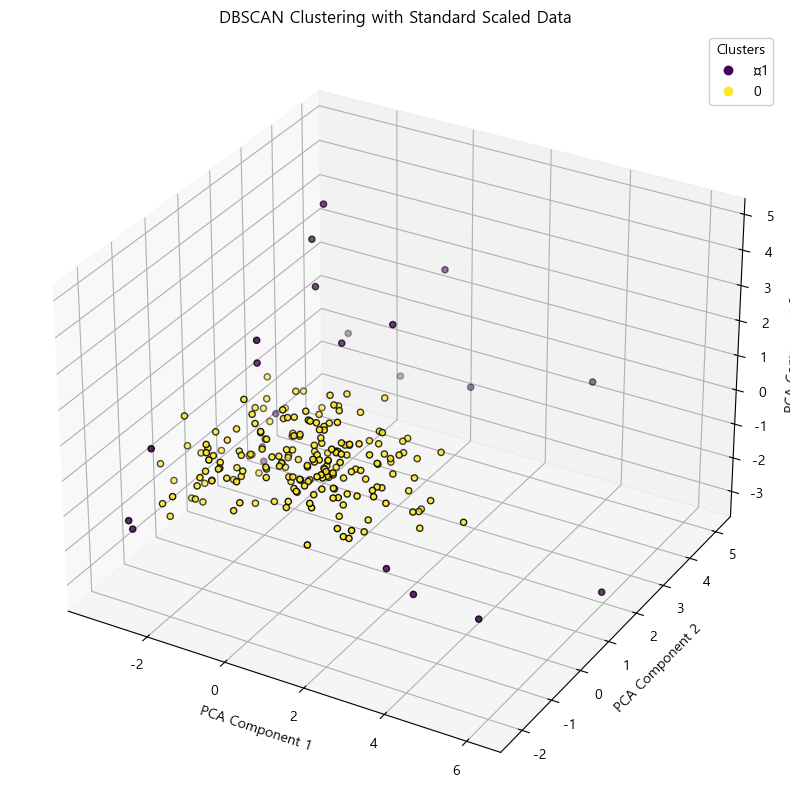

Performing grid search for Robust Scaled Data...


Font 'default' does not have a glyph for '\u2212' [U+2212], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u2212' [U+2212], substituting with a dummy symbol.


Best params for Robust Scaled Data: eps=1.0, min_samples=8
Best silhouette score for Robust Scaled Data: -0.0839688029500978


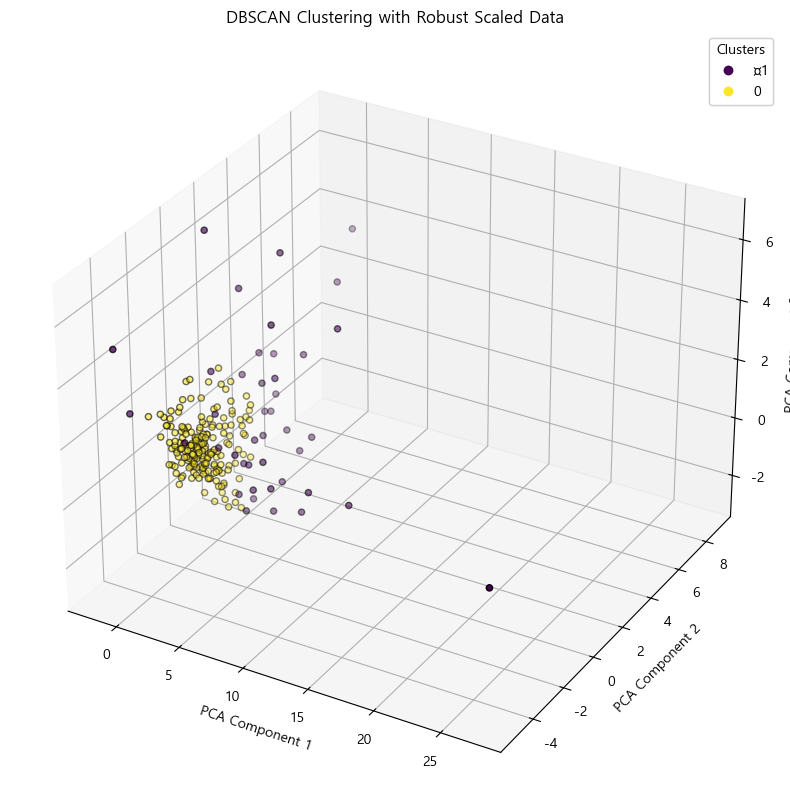

Performing grid search for MinMax Scaled Data...
Best params for MinMax Scaled Data: eps=0.5263157894736842, min_samples=2
Best silhouette score for MinMax Scaled Data: 0.5025592386150874


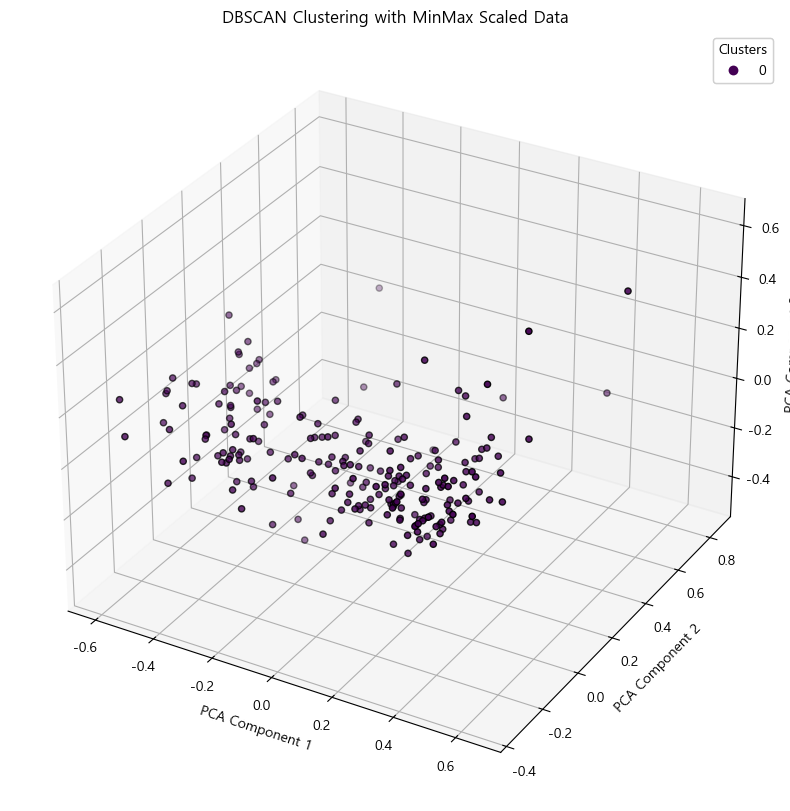

In [77]:
# PCA 3차원 시각화 함수
def pca_3d_visualization(scaled_data, title, eps, min_samples):
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(scaled_data)
    dbscan = DBSCAN(eps=eps, min_samples=min_samples).fit(pca_result)
    labels = dbscan.labels_
    
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=labels, cmap='viridis', marker='o', edgecolor='k')
    
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.set_zlabel('PCA Component 3')
    ax.set_title(f'DBSCAN Clustering with {title}')
    
    legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend1)
    
    plt.show()

# DBSCAN 하이퍼파라미터 그리드 서치 함수
def dbscan_grid_search(X, param_grid):
    best_score = -1
    best_params = None
    for params in ParameterGrid(param_grid):
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        labels = dbscan.fit_predict(X)
        if len(set(labels)) > 1:  # Ensure there are more than one cluster and not all points are outliers
            score = silhouette_score(X, labels)
            if score > best_score:
                best_score = score
                best_params = params
    return best_params, best_score

# 하이퍼파라미터 그리드 정의
param_grid = {
    'eps': np.linspace(0.1, 1.0, 20),
    'min_samples': range(2, 10)
}

# 스케일링된 데이터에 대해 그리드 서치 및 시각화 수행
for scaler_name, scaled_data in [('Standard Scaled Data', standard_scaled),
                                 ('Robust Scaled Data', robust_scaled),
                                 ('MinMax Scaled Data', minmax_scaled)]:
    print(f"Performing grid search for {scaler_name}...")
    best_params, best_score = dbscan_grid_search(scaled_data, param_grid)
    print(f"Best params for {scaler_name}: eps={best_params['eps']}, min_samples={best_params['min_samples']}")
    print(f"Best silhouette score for {scaler_name}: {best_score}")
    pca_3d_visualization(scaled_data, scaler_name, best_params['eps'], best_params['min_samples'])

standard_scaled

In [78]:
dbscan = DBSCAN(eps=1.0, min_samples=6)
labels = dbscan.fit_predict(standard_scaled)

In [79]:
dbscan.labels_

array([-1, -1,  0, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1,  0, -1,
       -1, -1,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,
        0,  0, -1,  0, -1, -1, -1, -1,  0, -1,  0,  0,  0,  0, -1,  0, -1,
       -1,  0, -1, -1,  0, -1,  0, -1,  0, -1,  0,  0, -1, -1, -1, -1,  0,
        0, -1,  0, -1,  0, -1, -1, -1, -1,  0, -1, -1,  0,  0, -1, -1, -1,
       -1, -1, -1,  0,  0,  0, -1, -1, -1, -1, -1,  0,  0, -1,  0, -1, -1,
       -1,  0,  0,  0, -1, -1, -1, -1,  0,  0, -1, -1,  0,  0, -1,  0, -1,
       -1, -1, -1, -1, -1, -1,  0,  0,  0, -1, -1,  0, -1,  0,  0, -1,  0,
       -1,  0, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        0,  0, -1, -1,  0, -1,  0,  0,  0, -1, -1,  0, -1, -1, -1, -1, -1,
        0, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1,  0,  0, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1,
        0, -1,  0, -1, -1, -1,  0, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1,
       -1, -1, -1,  0, -1

In [80]:
dbscan = DBSCAN(eps=1.0, min_samples=8)
labels = dbscan.fit_predict(robust_scaled)

In [81]:
dbscan.labels_

array([-1, -1, -1, -1, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1,  0,  0,  0,  0, -1, -1,  0, -1, -1,  0,  0,  0,
       -1,  0, -1, -1, -1, -1, -1, -1,  0, -1,  0,  0, -1, -1, -1,  0, -1,
       -1,  0, -1, -1,  0, -1,  0, -1, -1, -1,  0,  0, -1, -1, -1, -1,  0,
        0, -1,  0, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1,  0, -1, -1, -1,
       -1, -1, -1,  0,  0, -1, -1, -1, -1, -1, -1, -1,  0, -1,  0, -1, -1,
       -1,  0, -1,  0, -1, -1, -1, -1, -1,  0, -1, -1, -1,  0, -1,  0, -1,
       -1, -1, -1, -1, -1, -1, -1,  0,  0, -1,  0,  0, -1,  0,  0, -1, -1,
       -1,  0, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
        0, -1, -1, -1,  0, -1, -1,  0,  0, -1, -1,  0, -1, -1, -1, -1, -1,
        0, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1,  0, -1, -1, -1, -1, -1,  0,  0, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1,  0, -1, -1, -1, -1, -1,  0, -1,  0, -1, -1, -1, -1, -1, -1,
       -1, -1, -1,  0, -1

minmax_scaled

In [82]:
dbscan = DBSCAN(eps=0.5263157894736842, min_samples=2)
labels = dbscan.fit_predict(minmax_scaled)

In [83]:
dbscan.labels_

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0

### 3.4 Mean Shifts

In [84]:
from sklearn.cluster import MeanShift, estimate_bandwidth

In [85]:
bandwidth_values = np.linspace(0.1, 3.0, 30)
def evaluate_clustering_mean_shift(X_scaled, bandwidth_values):
    dunn_indices = []
    for bandwidth in bandwidth_values:
        mean_shift = MeanShift(bandwidth=bandwidth)
        mean_shift.fit(X_scaled)
        labels = mean_shift.labels_
        if len(set(labels)) > 1:  # 클러스터가 2개 이상일 때만 Dunn Index 계산
            dunn_index = get_Dunn_index(X_scaled, labels, intra_cluster_distance_type='avdd', inter_cluster_distance_type='avld')
        else:
            dunn_index = -1  # 클러스터가 하나인 경우 Dunn Index 계산 불가하므로 -1로 설정
        dunn_indices.append(dunn_index)
    
    plt.figure(figsize=(10, 8))
    plt.plot(bandwidth_values, dunn_indices, marker='o')
    plt.title('Dunn Index Analysis with Mean Shift')
    plt.xlabel('Bandwidth values')
    plt.ylabel('Dunn Index')
    plt.show()
    
    print("Dunn Indices:", dunn_indices)

C:\Users\gkswl\AppData\Local\Temp\ipykernel_17188\3244469121.py:39: RuntimeWarning: divide by zero encountered in scalar divide
  Dunn_idx = min_inter_cd / max_intra_cd
C:\Users\gkswl\AppData\Local\Temp\ipykernel_17188\3244469121.py:39: RuntimeWarning: divide by zero encountered in scalar divide
  Dunn_idx = min_inter_cd / max_intra_cd


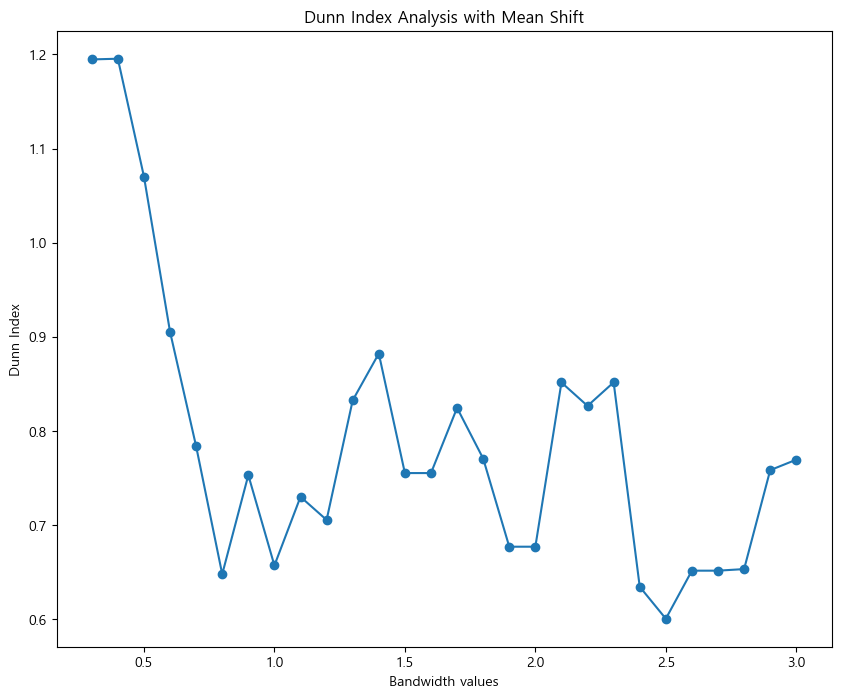

Dunn Indices: [inf, inf, 1.1947108701497333, 1.1954539567258837, 1.070298752021792, 0.9053877188678505, 0.7836906550701157, 0.6478390260310987, 0.753067271670306, 0.6571017886112668, 0.73003032211598, 0.7054836472710889, 0.8325125735116975, 0.8822453915129229, 0.7552561119856378, 0.7552561119856378, 0.8245191238547577, 0.7706919372232721, 0.6770291898451865, 0.6770291898451865, 0.8514989275956658, 0.826634463298775, 0.8516323380145473, 0.6344571299415166, 0.6005173854524455, 0.6515678140377617, 0.6515678140377617, 0.6532522682442472, 0.7583580189869072, 0.769487758036667]


In [86]:
evaluate_clustering_mean_shift(standard_scaled, bandwidth_values)

C:\Users\gkswl\AppData\Local\Temp\ipykernel_17188\3244469121.py:39: RuntimeWarning: divide by zero encountered in scalar divide
  Dunn_idx = min_inter_cd / max_intra_cd
C:\Users\gkswl\AppData\Local\Temp\ipykernel_17188\3244469121.py:39: RuntimeWarning: divide by zero encountered in scalar divide
  Dunn_idx = min_inter_cd / max_intra_cd
C:\Users\gkswl\AppData\Local\Temp\ipykernel_17188\3244469121.py:39: RuntimeWarning: divide by zero encountered in scalar divide
  Dunn_idx = min_inter_cd / max_intra_cd


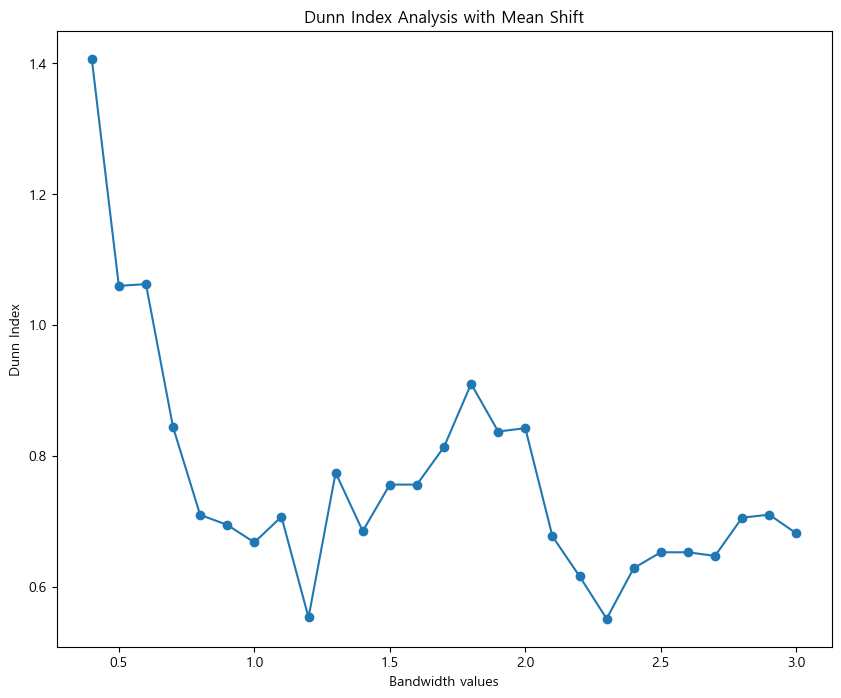

Dunn Indices: [inf, inf, inf, 1.406715455440643, 1.0595986668823885, 1.0623137726179455, 0.8437847873956074, 0.7096298648958658, 0.6943919363558164, 0.6675936634392065, 0.7068267883698115, 0.5529650640175696, 0.7740947804412621, 0.6848471459402435, 0.7559380434210539, 0.7559380434210539, 0.8135387129432382, 0.90990372925263, 0.8370314284646916, 0.8421753942787015, 0.6768826897754109, 0.6159800467240423, 0.550987215365017, 0.6282339691269824, 0.6525305012253569, 0.6525305012253569, 0.6469752168957447, 0.7053468016878941, 0.7100598106909525, 0.6814212918413853]


In [87]:
evaluate_clustering_mean_shift(robust_scaled, bandwidth_values)

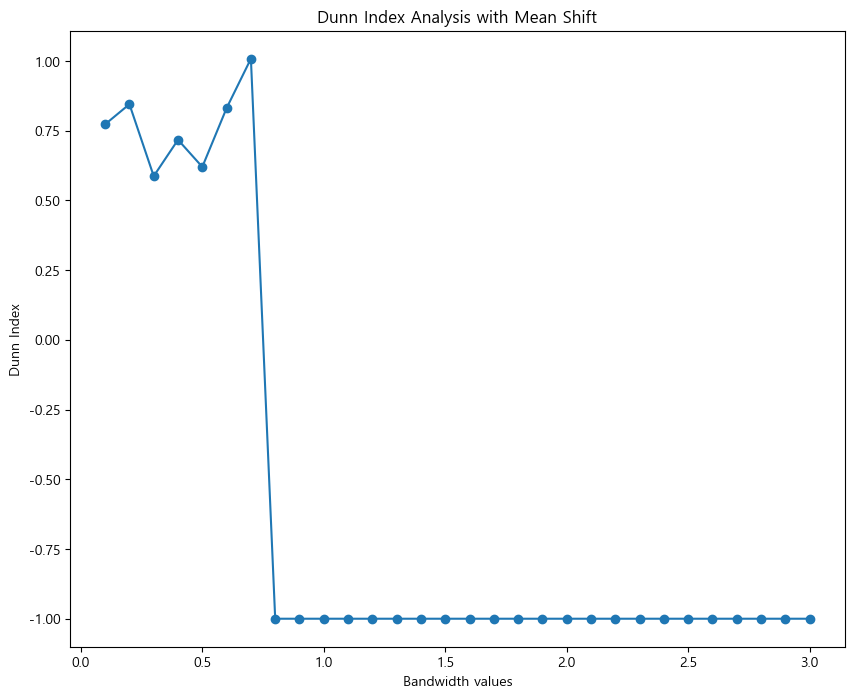

Dunn Indices: [0.7729678992633846, 0.8451098444002736, 0.5871357553694818, 0.7173943825739262, 0.6202068468930336, 0.8310622435681084, 1.0081506051537332, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1]


In [88]:
evaluate_clustering_mean_shift(minmax_scaled, bandwidth_values)

Performing grid search for Standard Scaled Data...
Best params for Standard Scaled Data: bandwidth=3.0
Best silhouette score for Standard Scaled Data: 0.29509747406891285


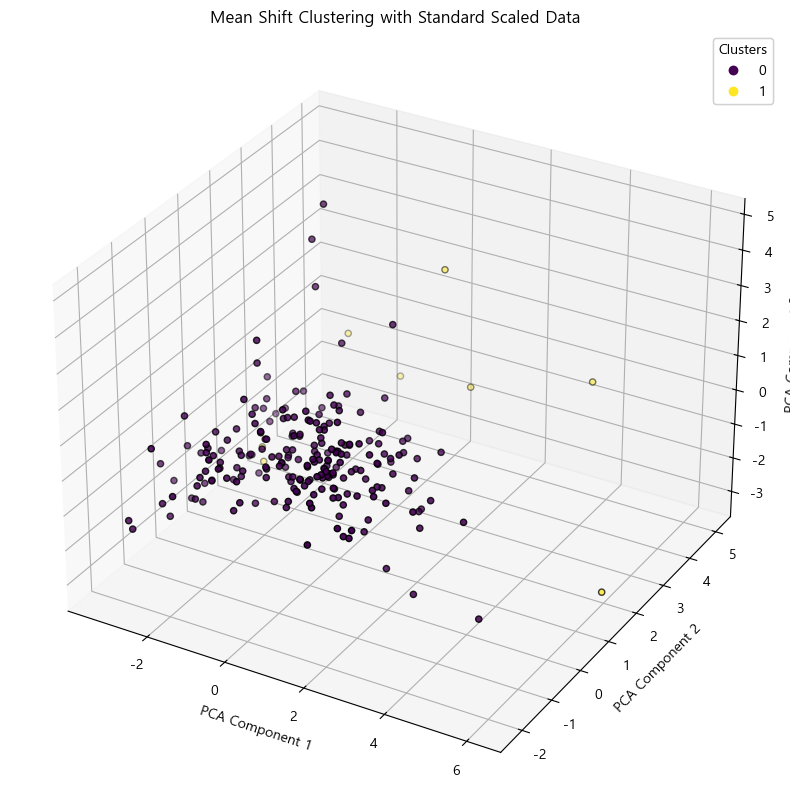

Performing grid search for Robust Scaled Data...
Best params for Robust Scaled Data: bandwidth=3.0
Best silhouette score for Robust Scaled Data: 0.2498684537700646


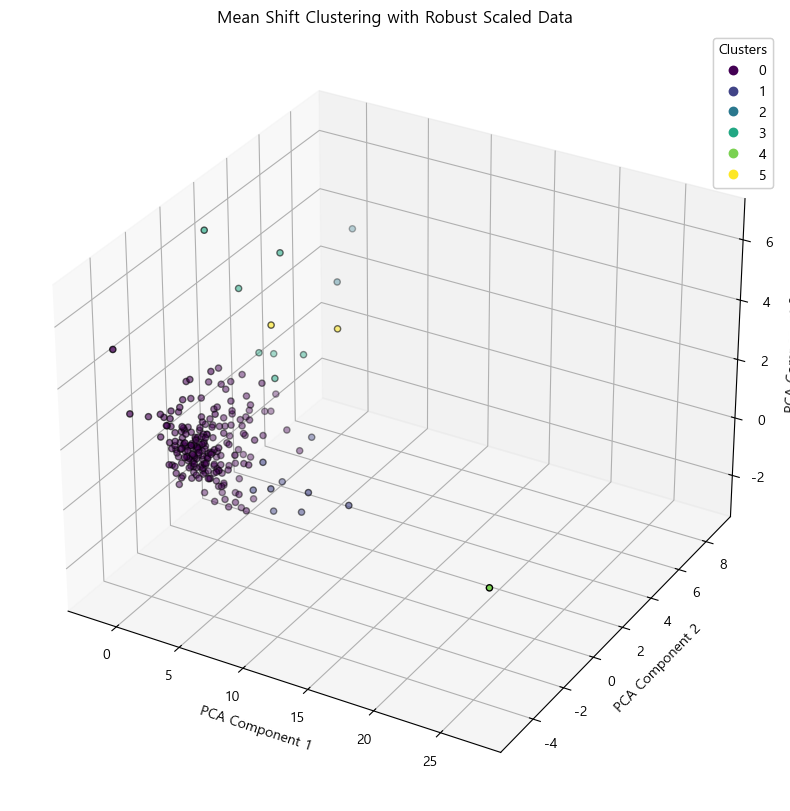

Performing grid search for MinMax Scaled Data...
Best params for MinMax Scaled Data: bandwidth=0.7
Best silhouette score for MinMax Scaled Data: 0.48441636388809806


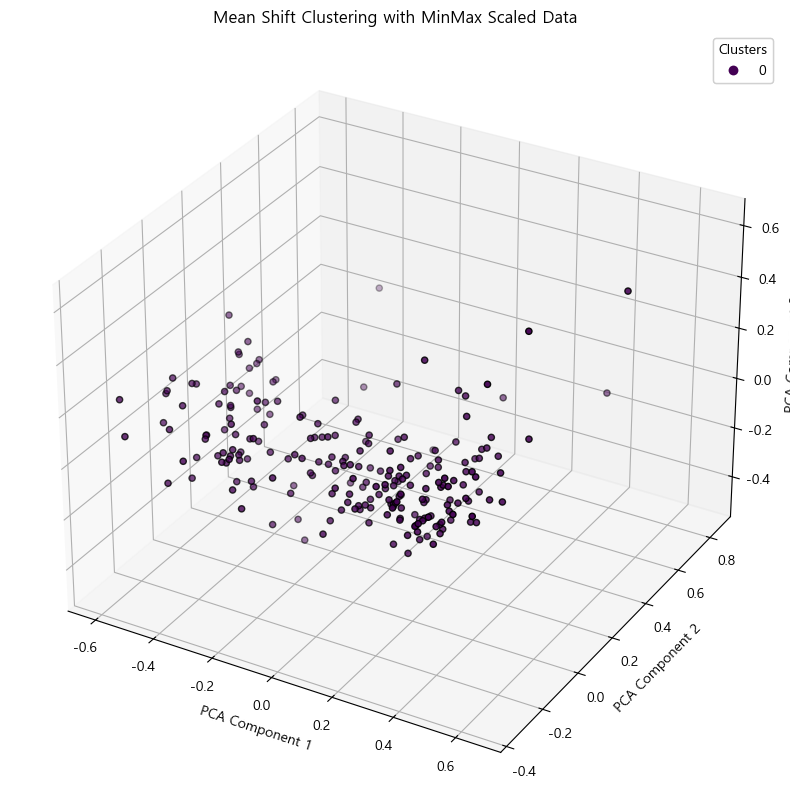

In [89]:

# PCA 3차원 시각화 함수
def pca_3d_visualization(scaled_data, title, bandwidth):
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(scaled_data)
    mean_shift = MeanShift(bandwidth=bandwidth).fit(pca_result)
    labels = mean_shift.labels_
    
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=labels, cmap='viridis', marker='o', edgecolor='k')
    
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.set_zlabel('PCA Component 3')
    ax.set_title(f'Mean Shift Clustering with {title}')
    
    legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
    ax.add_artist(legend1)
    
    plt.show()

# Mean Shift 하이퍼파라미터 그리드 서치 함수
def mean_shift_grid_search(X, param_grid):
    best_score = -1
    best_params = None
    for params in ParameterGrid(param_grid):
        mean_shift = MeanShift(bandwidth=params['bandwidth'])
        labels = mean_shift.fit_predict(X)
        n_clusters = len(np.unique(labels))
        if n_clusters > 1 and n_clusters < len(X):  # Ensure there are valid number of clusters
            score = silhouette_score(X, labels)
            if score > best_score:
                best_score = score
                best_params = params
    return best_params, best_score

# 하이퍼파라미터 그리드 정의
bandwidth_values = np.linspace(0.1, 3.0, 30)
param_grid = {
    'bandwidth': bandwidth_values
}

# 스케일링된 데이터에 대해 그리드 서치 및 시각화 수행
for scaler_name, scaled_data in [('Standard Scaled Data', standard_scaled),
                                 ('Robust Scaled Data', robust_scaled),
                                 ('MinMax Scaled Data', minmax_scaled)]:
    print(f"Performing grid search for {scaler_name}...")
    best_params, best_score = mean_shift_grid_search(scaled_data, param_grid)
    print(f"Best params for {scaler_name}: bandwidth={best_params['bandwidth']}")
    print(f"Best silhouette score for {scaler_name}: {best_score}")
    pca_3d_visualization(scaled_data, scaler_name, best_params['bandwidth'])

스케일링한거 plot 그리기
log 취해서 plot 그리기

### 3.5 Agglomerative

In [90]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

#### standard scaler

In [91]:
agg_scores = []
agg_models = []

for k in range(2, 11):
    agg = AgglomerativeClustering(n_clusters=k)
    labels = agg.fit_predict(standard_scaled)
    score = silhouette_score(standard_scaled, labels)
    agg_scores.append(score)
    agg_models.append(agg)

Text(0.5, 1.0, 'Silhouette Score')

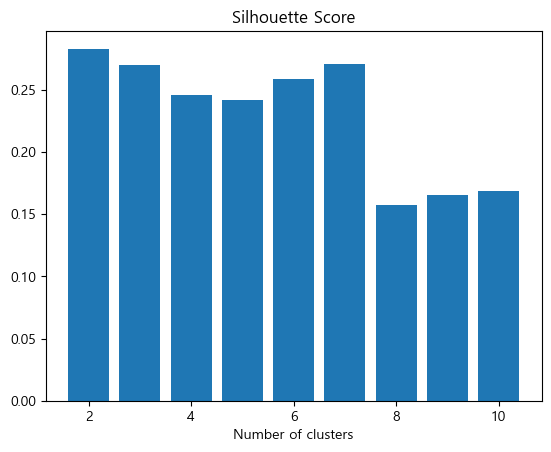

In [92]:
plt.bar(range(2,11), agg_scores, )
plt.xlabel("Number of clusters")
plt.title("Silhouette Score")

In [93]:
def evaluate_clustering_agglomerative(X_scaled, optimal_k):
    dunn_indices = []
    
    for k in range(2, optimal_k + 1):
        agglomerative = AgglomerativeClustering(n_clusters=k)
        agglomerative.fit(X_scaled)
        labels = agglomerative.labels_
        dunn_index = get_Dunn_index(X_scaled, labels, intra_cluster_distance_type='avdd', inter_cluster_distance_type='avld')
        dunn_indices.append(dunn_index)

    plt.figure(figsize=(10, 8))
    plt.plot(range(2, optimal_k + 1), dunn_indices, marker='o')
    plt.title('Dunn Index Analysis')
    plt.xlabel('Number of clusters')
    plt.ylabel('Dunn Index')
    plt.show()
    
    print("Dunn Indices:", dunn_indices)

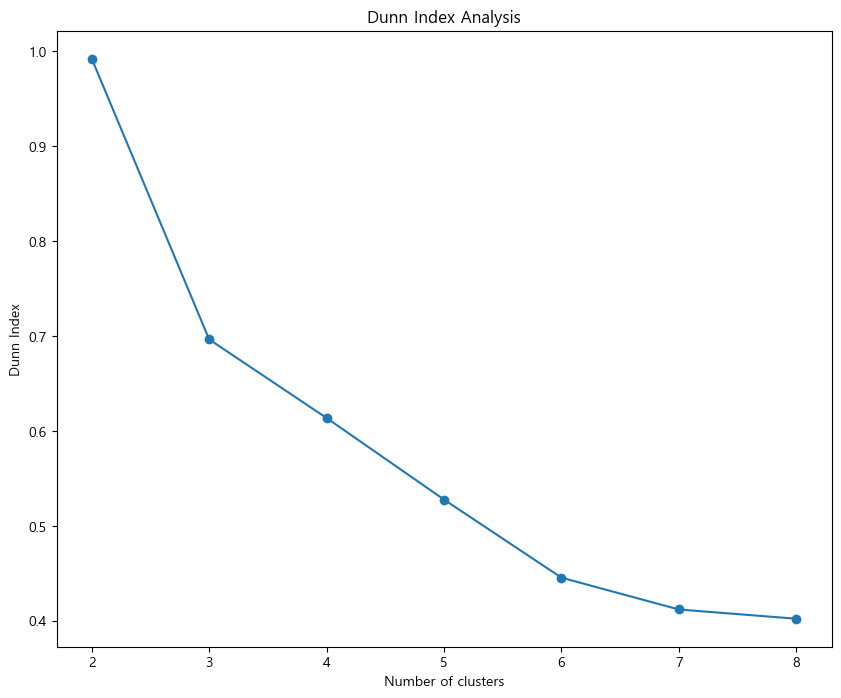

Dunn Indices: [0.991988679212431, 0.6964080480620981, 0.6136333512551286, 0.5277522998057861, 0.4455104595745864, 0.41199957813611554, 0.40228036110663307]


In [94]:
evaluate_clustering(standard_scaled, optimal_k=8)

In [95]:
model = AgglomerativeClustering(n_clusters=4)
model.fit(standard_scaled)

AgglomerativeClustering(n_clusters=4)

In [96]:
model.labels_

array([1, 0, 1, 1, 1, 2, 0, 0, 1, 2, 2, 2, 1, 1, 0, 0, 2, 0, 0, 1, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 2, 1, 0, 1, 0, 1, 1, 0, 0, 0,
       2, 1, 1, 0, 1, 0, 1, 0, 2, 1, 2, 1, 2, 0, 1, 1, 1, 2, 0, 2, 0, 2,
       1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 3, 1, 3, 3, 1, 3, 3, 3, 3, 1, 3, 3, 1, 1, 3, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 0, 0, 0, 1, 2, 1, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 2, 0, 0, 1, 1, 0, 2,
       1, 1, 2, 2, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 2, 0, 1, 0, 0,
       1, 2, 0, 1, 1, 0, 0, 1, 1], dtype=int64)

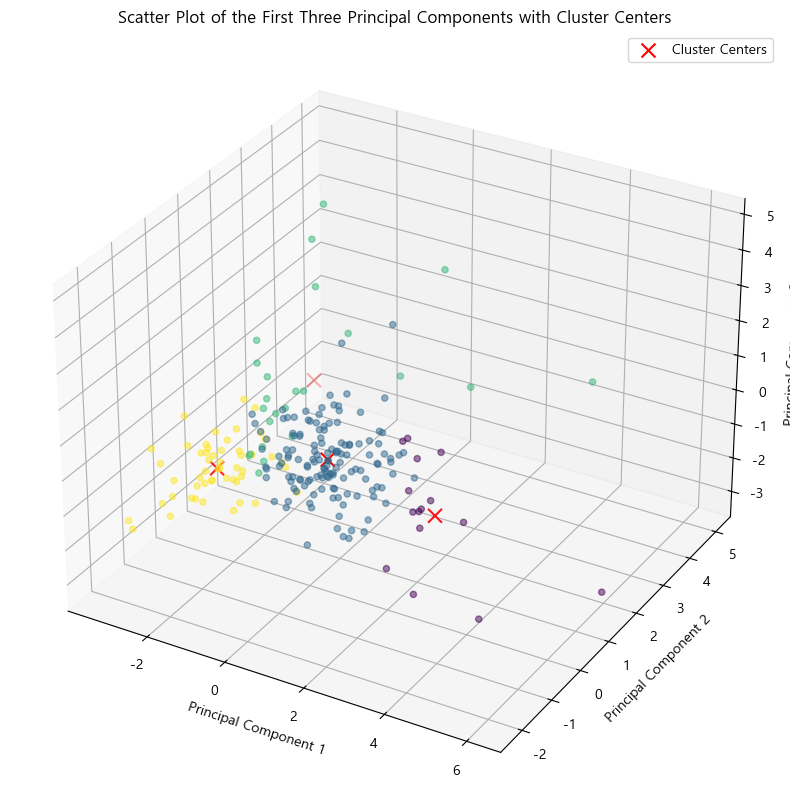

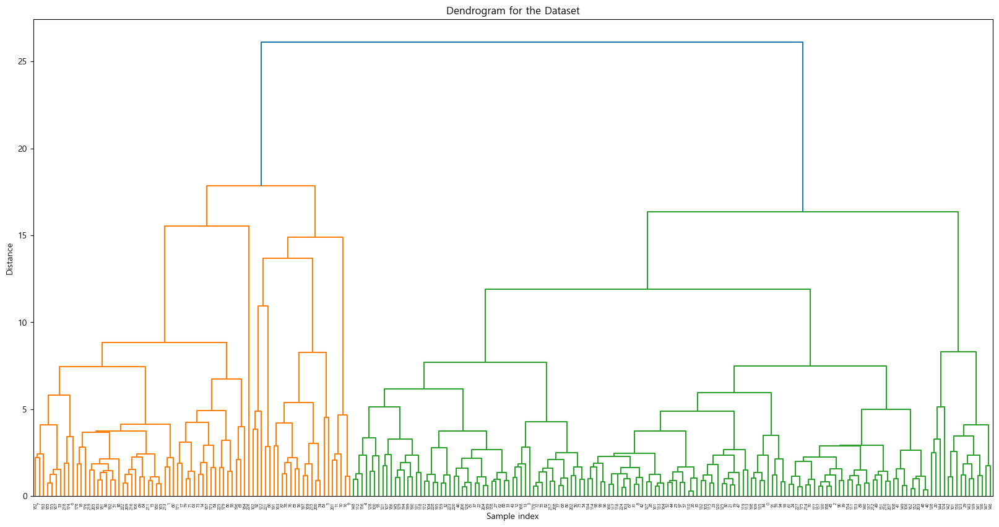

In [97]:
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assume standard_scaled is already defined and scaled data

# Perform hierarchical clustering using Ward's method
linked = linkage(standard_scaled, method='ward')

# Cut the dendrogram at a specific distance to form clusters
max_d = 16  # This is the cut-off distance you can adjust
clusters = fcluster(linked, max_d, criterion='distance')

# Find the cluster centers
cluster_centers = []
for cluster in np.unique(clusters):
    cluster_points = standard_scaled[clusters == cluster]
    cluster_center = cluster_points.mean(axis=0)
    cluster_centers.append(cluster_center)

# Convert the cluster centers to a numpy array
cluster_centers = np.array(cluster_centers)

# Perform PCA to reduce dimensions to 3D for visualization
pca = PCA(n_components=3)
pca_result = pca.fit_transform(standard_scaled)
pca_cluster_centers = pca.transform(cluster_centers)

# Plotting the scatter plot of the first three principal components
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=clusters, cmap='viridis', marker='o', alpha=0.5)
ax.scatter(pca_cluster_centers[:, 0], pca_cluster_centers[:, 1], pca_cluster_centers[:, 2], c='red', marker='x', s=100, label='Cluster Centers')
ax.set_title('Scatter Plot of the First Three Principal Components with Cluster Centers')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()
plt.show()

# Plotting the dendrogram
plt.figure(figsize=(20, 10))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Dendrogram for the Dataset')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

#### Robust scaler

In [98]:
agg_scores = []
agg_models = []

for k in range(2, 11):
    agg = AgglomerativeClustering(n_clusters=k)
    labels = agg.fit_predict(robust_scaled)
    score = silhouette_score(robust_scaled, labels)
    agg_scores.append(score)
    agg_models.append(agg)

Text(0.5, 1.0, 'Silhouette Score')

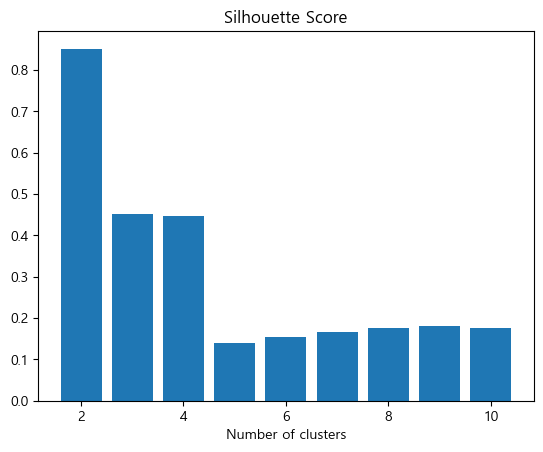

In [99]:
plt.bar(range(2,11), agg_scores, )
plt.xlabel("Number of clusters")
plt.title("Silhouette Score")

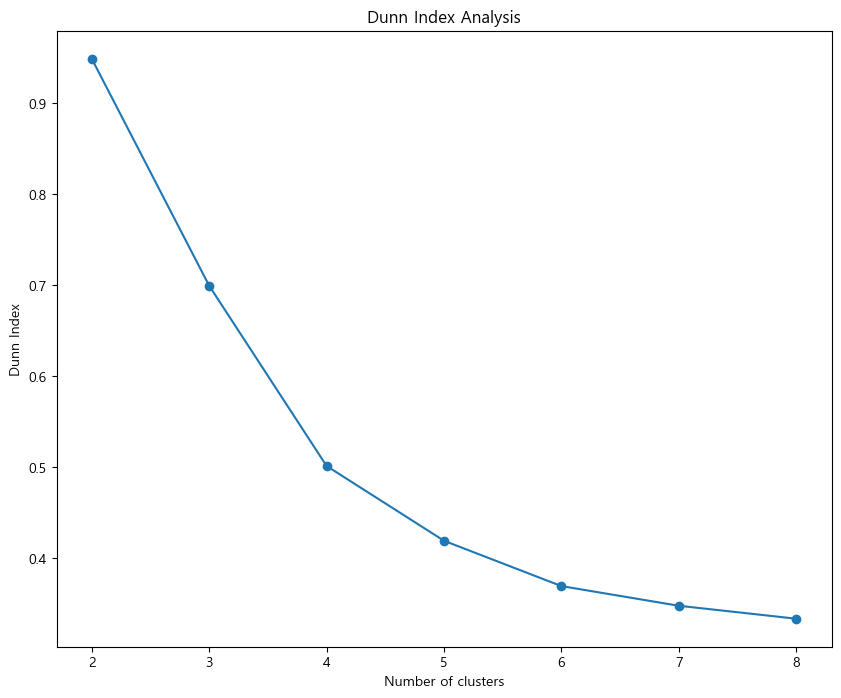

Dunn Indices: [0.948963899453481, 0.6993560954801575, 0.5012170524612304, 0.4189624398622625, 0.36912771150099116, 0.3475195106179307, 0.33327398624722343]


In [100]:
evaluate_clustering(robust_scaled, optimal_k=8)

In [101]:
best_agg_model = agg_models[agg_scores.index(max(agg_scores))]
print(f"Best Agglomerative Clustering silhouette score: {max(agg_scores)}, Number of clusters: {agg_scores.index(max(agg_scores)) + 2}")

Best Agglomerative Clustering silhouette score: 0.8517864388376769, Number of clusters: 2


In [102]:
model = AgglomerativeClustering(n_clusters=4)
model.fit(robust_scaled)

AgglomerativeClustering(n_clusters=4)

In [103]:
model.labels_

array([0, 0, 0, 1, 1, 2, 1, 1, 0, 2, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2,
       2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 2, 2, 0, 0, 0, 2, 0, 1, 0, 0, 2, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 2, 0, 0, 0, 0, 3, 0, 0], dtype=int64)

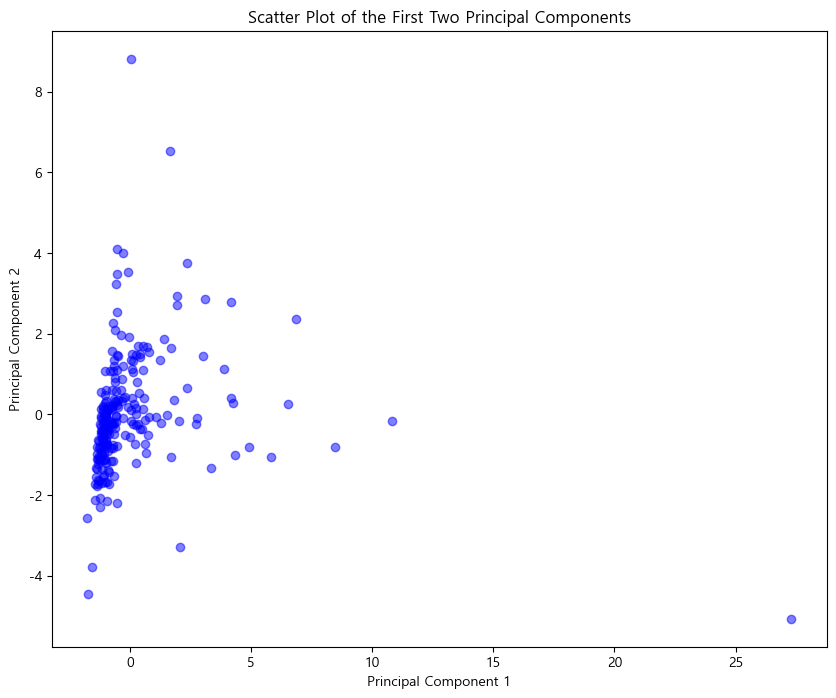

In [104]:
# Perform PCA to reduce dimensions to 2D
pca = PCA(n_components=2)
pca_result = pca.fit_transform(robust_scaled)

# Plotting the scatter plot of the first two principal components
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c='blue', marker='o', alpha=0.5)
plt.title('Scatter Plot of the First Two Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

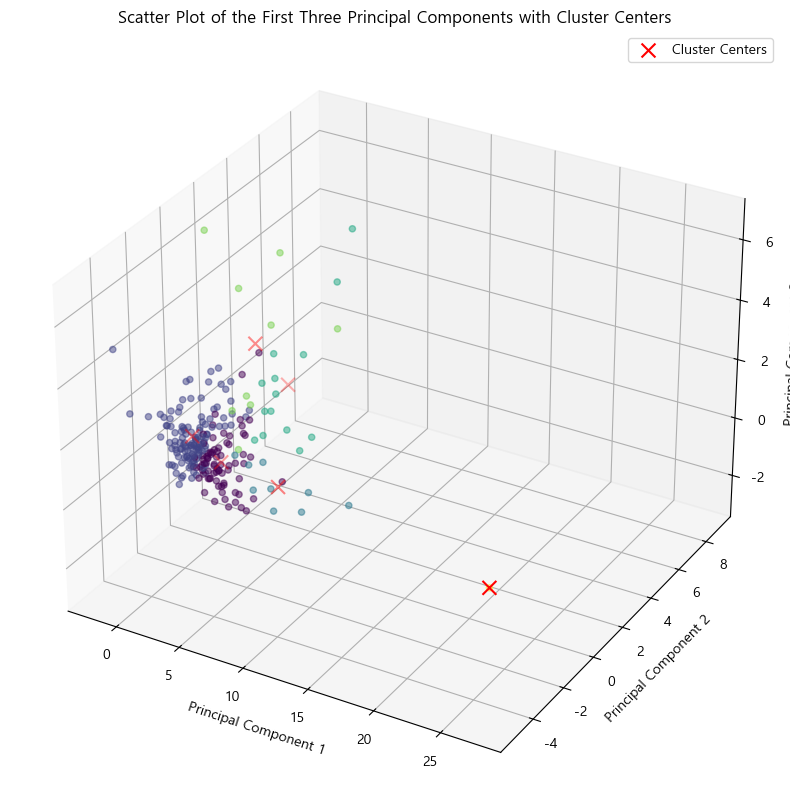

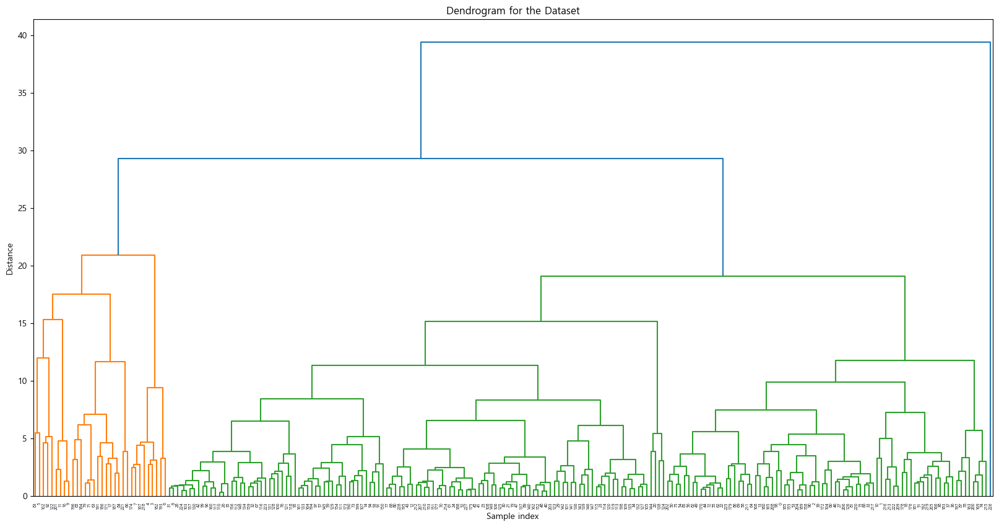

In [105]:
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assume robust_scaled is already defined and scaled data

# Perform hierarchical clustering using Ward's method
linked = linkage(robust_scaled, method='ward')

# Cut the dendrogram at a specific distance to form clusters
max_d = 16  # This is the cut-off distance you can adjust
clusters = fcluster(linked, max_d, criterion='distance')

# Find the cluster centers
cluster_centers = []
for cluster in np.unique(clusters):
    cluster_points = robust_scaled[clusters == cluster]
    cluster_center = cluster_points.mean(axis=0)
    cluster_centers.append(cluster_center)

# Convert the cluster centers to a numpy array
cluster_centers = np.array(cluster_centers)

# Perform PCA to reduce dimensions to 3D for visualization
pca = PCA(n_components=3)
pca_result = pca.fit_transform(robust_scaled)
pca_cluster_centers = pca.transform(cluster_centers)

# Plotting the scatter plot of the first three principal components
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=clusters, cmap='viridis', marker='o', alpha=0.5)
ax.scatter(pca_cluster_centers[:, 0], pca_cluster_centers[:, 1], pca_cluster_centers[:, 2], c='red', marker='x', s=100, label='Cluster Centers')
ax.set_title('Scatter Plot of the First Three Principal Components with Cluster Centers')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()
plt.show()

# Plotting the dendrogram
plt.figure(figsize=(20, 10))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Dendrogram for the Dataset')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

#### minmax scaler

In [106]:
agg_scores = []
agg_models = []

for k in range(2, 11):
    agg = AgglomerativeClustering(n_clusters=k)
    labels = agg.fit_predict(minmax_scaled)
    score = silhouette_score(minmax_scaled, labels)
    agg_scores.append(score)
    agg_models.append(agg)

Text(0.5, 1.0, 'Silhouette Score')

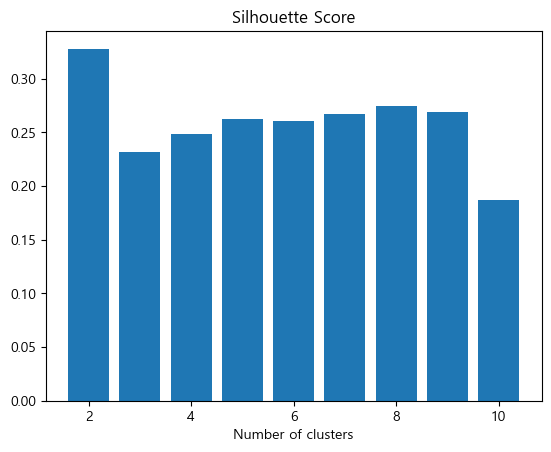

In [107]:
plt.bar(range(2,11), agg_scores, )
plt.xlabel("Number of clusters")
plt.title("Silhouette Score")

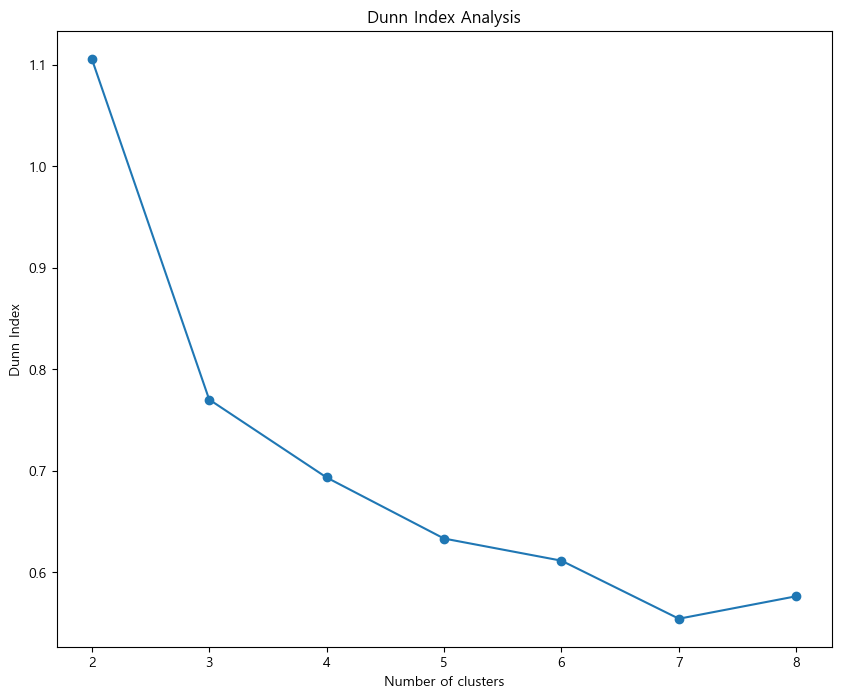

Dunn Indices: [1.1058123798718207, 0.7699690277581465, 0.6931383617028792, 0.6329767069394326, 0.6111673455901389, 0.5539691581977962, 0.5761229766831076]


In [108]:
evaluate_clustering(minmax_scaled, optimal_k=8)

In [109]:
model = AgglomerativeClustering(n_clusters=4)
model.fit(minmax_scaled)

AgglomerativeClustering(n_clusters=4)

In [110]:
model.labels_

array([0, 3, 0, 2, 0, 1, 3, 3, 0, 2, 2, 2, 0, 2, 3, 3, 2, 3, 3, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 3, 2, 3, 0, 0, 0, 0, 2,
       0, 0, 2, 0, 0, 0, 2, 3, 0, 3, 2, 2, 3, 0, 3, 0, 3, 0, 0, 3, 3, 3,
       1, 0, 2, 3, 0, 3, 2, 3, 1, 2, 1, 2, 1, 3, 2, 2, 2, 1, 3, 1, 3, 1,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 0, 2, 2, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0,
       0, 3, 0, 0, 0, 2, 0, 0, 0, 1, 0, 3, 3, 3, 0, 1, 2, 3, 0, 2, 3, 0,
       3, 0, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 0, 2, 2, 1, 3, 3, 2, 0, 3, 1,
       0, 2, 1, 2, 2, 0, 2, 3, 2, 0, 2, 3, 0, 3, 0, 3, 0, 1, 3, 2, 3, 3,
       3, 1, 3, 2, 2, 0, 2, 0, 0], dtype=int64)

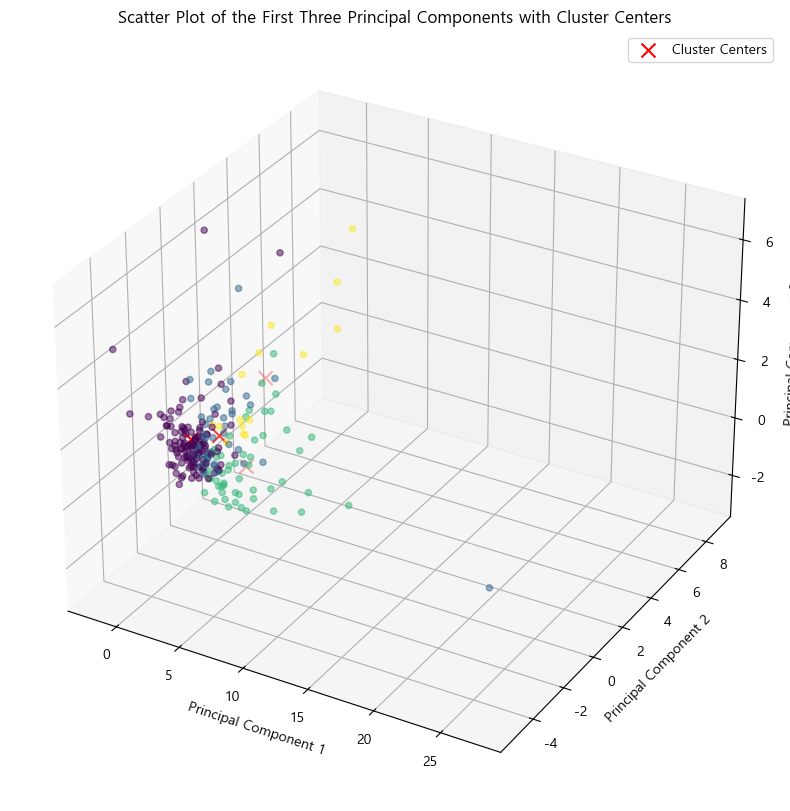

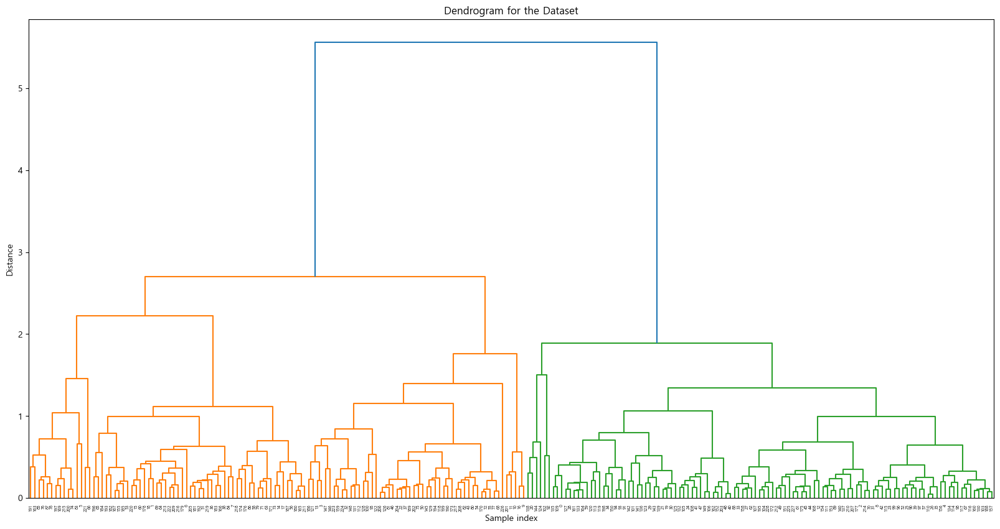

In [111]:
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assume robust_scaled is already defined and scaled data

# Perform hierarchical clustering using Ward's method
linked = linkage(minmax_scaled, method='ward')

# Cut the dendrogram at a specific distance to form clusters
max_d = 2  # This is the cut-off distance you can adjust
clusters = fcluster(linked, max_d, criterion='distance')

# Find the cluster centers
cluster_centers = []
for cluster in np.unique(clusters):
    cluster_points = robust_scaled[clusters == cluster]
    cluster_center = cluster_points.mean(axis=0)
    cluster_centers.append(cluster_center)

# Convert the cluster centers to a numpy array
cluster_centers = np.array(cluster_centers)

# Perform PCA to reduce dimensions to 3D for visualization
pca = PCA(n_components=3)
pca_result = pca.fit_transform(robust_scaled)
pca_cluster_centers = pca.transform(cluster_centers)

# Plotting the scatter plot of the first three principal components
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(pca_result[:, 0], pca_result[:, 1], pca_result[:, 2], c=clusters, cmap='viridis', marker='o', alpha=0.5)
ax.scatter(pca_cluster_centers[:, 0], pca_cluster_centers[:, 1], pca_cluster_centers[:, 2], c='red', marker='x', s=100, label='Cluster Centers')
ax.set_title('Scatter Plot of the First Three Principal Components with Cluster Centers')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()
plt.show()

# Plotting the dendrogram
plt.figure(figsize=(20, 10))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Dendrogram for the Dataset')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()

# 4. 최종 모델 선택 결과

* 최종적으로 standard_scaled로 진행한 k=4 인 agglomerative모델 선택  

1. PCA를 통해 3차원으로 축소해서 본 cluster가 그나마 가장 잘 묶였음
2. 실루엣 스코어에서 가장 좋은 점수를 얻음
3. dendrogram으로 시각적으로 잘 묶였음을 유추할 수 있었음
4. 태블로를 통해 알아본 cluster 결과가 가장 납득될만 했음 


* standard scaling

1. k-means : 실루엣, dunn index 점수가 agglomerative에 비해 낮게 나옴. 
2. -k-medoids : 실루엣, dunn index 점수가 agglomerative에 비해 낮게 나옴.
3. -DBSCAN : PCA를 통해 차원을 3차원으로 축소해 본 cluster결과가 나빴고 전체적으로 cluster가 잘 묶이지 않음
4. Meanshift ; PCA를 통해 차원을 3차원으로 축소해 본 cluster결과가 나빴고 전체적으로 cluster가 잘 묶이지 않음

* Robust scaling

1. 전체적으로 모든 모델이 PCA 통해서 3차원 축소해본 결과가 별로 좋지 않았음

* Minmax scaling

1. K-medoids : 이 부분이 pca 통해 3차원으로 축소한 그림에서 잘 묶여 있어 보였지만 clustering 결과를 실제 태블로로 대한민국 지도에 실제로 시각화해봤을 때, 병합 군집 보다는 설명력이 떨어진다고 판단

In [112]:
model = AgglomerativeClustering(n_clusters=4)
model.fit(standard_scaled)

AgglomerativeClustering(n_clusters=4)

In [113]:
model.labels_

array([1, 0, 1, 1, 1, 2, 0, 0, 1, 2, 2, 2, 1, 1, 0, 0, 2, 0, 0, 1, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 2, 1, 0, 1, 0, 1, 1, 0, 0, 0,
       2, 1, 1, 0, 1, 0, 1, 0, 2, 1, 2, 1, 2, 0, 1, 1, 1, 2, 0, 2, 0, 2,
       1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 3, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 3, 1, 3, 3, 1, 3, 3, 3, 3, 1, 3, 3, 1, 1, 3, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 0, 0, 0, 1, 2, 1, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 2, 0, 0, 1, 1, 0, 2,
       1, 1, 2, 2, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 2, 0, 1, 0, 0,
       1, 2, 0, 1, 1, 0, 0, 1, 1], dtype=int64)

In [114]:
 df['Cluster'] = model.labels_

In [115]:
df

,맞벌이비율,평균 과세대상근로소득(백만원),apart,초등학생 수 대비 학원 비율,초등학생 수 대비 도서관 비율,초등학생 수 대비 pc방 비율,초등학생 수 대비 소아과 비율,초등학생 수 대비 학교 숲 비율,Cluster
0,0.5818,33.9802,0.589536,0.0650,0.0011,0.0065,0.0014,11.0156,1
1,0.4667,31.6427,0.198992,0.0196,0.0035,0.0069,0.0000,24.8581,0
2,0.4141,36.5519,0.660448,0.0394,0.0014,0.0041,0.0010,7.9148,1
3,0.5686,35.8620,0.466221,0.0330,0.0011,0.0052,0.0011,32.4194,1
4,0.4416,31.9435,0.701770,0.0377,0.0007,0.0061,0.0017,25.1465,1
...,...,...,...,...,...,...,...,...,...
224,0.4630,33.5292,0.563537,0.0405,0.0010,0.0043,0.0013,1.5655,1
225,0.5556,33.4837,0.669411,0.0310,0.0009,0.0040,0.0004,2.2162,0
226,0.5000,33.9319,0.574872,0.0271,0.0008,0.0039,0.0010,154.6193,0
227,0.5070,38.2154,0.742007,0.0421,0.0003,0.0035,0.0010,1.2137,1
